# Библиотеки

In [1]:
import os
import random
from keras import backend as K
import numpy as np
import tensorflow
from tensorflow.keras.backend import clear_session

# для кераса недостаточно просто задать рандом сид,
# поэтому сделаем ф-ию для воспроизводимости рез-в
def reset_seeds(seed_value = 1108):
    clear_session()
    tensorflow.compat.v1.reset_default_graph()
    
    tensorflow.keras.utils.set_random_seed(seed_value)
    os.environ['PYTHONHASHSEED']=str(seed_value)

    session_conf = tensorflow.compat.v1.ConfigProto(intra_op_parallelism_threads=1, 
                                                    inter_op_parallelism_threads=1)
    sess = tensorflow.compat.v1.Session(graph=tensorflow.compat.v1.get_default_graph(), 
                                        config=session_conf)
    K.set_session(sess)

reset_seeds(seed_value = 1108)

In [2]:
# Для работы с данными
import pandas as pd
import glob
# Метрики качества
from sklearn.metrics import r2_score, mean_absolute_percentage_error
# Визуализация
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib.lines import Line2D
import matplotlib # colormap, lines
import seaborn as sns
# Процесс выполнения
from tqdm.notebook import tqdm,trange
from tqdm.keras import TqdmCallback
# Tensorflow
from tensorflow.keras import Input,Model
from tensorflow.keras.layers import Dense, concatenate, Dropout, LSTM
# PyTorch
import torch
import torch.nn as nn

# Отдельные модули
import preprocessing
import micro_model_functions
import micro_help_functions
import macro_model_functions
import macro_help_functions

# Загрузка данных

In [3]:
path_to_dataset = 'transact_18_22.csv'
df = pd.read_csv(path_to_dataset)

print('df shape: ', df.shape)
df.head()

df shape:  (19262668, 7)


,client,card,date,amt,mcc,group,value
0,390989,3048567,2018-01-01,878.0,5814,food,survival
1,1309946,3226559,2018-01-01,249.0,5411,food,survival
2,1386278,2715990,2018-01-01,50.0,5499,food,survival
3,475694,2884069,2018-01-01,2564.0,5941,fun,self_realization
4,710293,3396065,2018-01-01,464.9,5814,food,survival


Посмотрим на кол-во клиентов, МСС и транзакций в категориях

In [3]:
df.client.nunique()

10000

In [4]:
df.mcc.nunique()

390

In [5]:
df.value.value_counts()

survival            11898943
socialization        3462139
money                1968121
self_realization     1697659
5300                   47735
                      ...   
3050                       1
3512                       1
8734                       1
3589                       1
3542                       1
Name: value, Length: 279, dtype: int64

In [4]:
# не будем учитывать категорию деньги
df = df[df['value'].isin(['survival','socialization','self_realization'])]

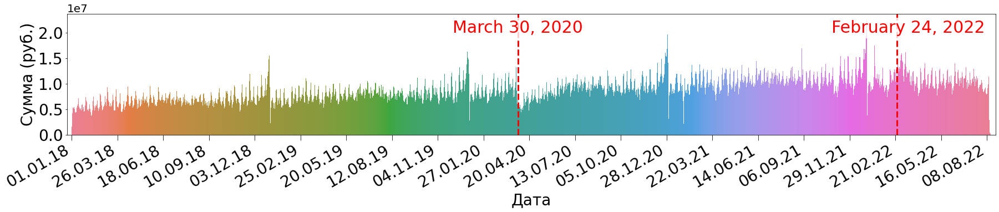

In [34]:
import matplotlib.dates as md
fig, ax = plt.subplots(figsize = (30, 4))

# specify the position of the major ticks at the beginning of the week
ax.xaxis.set_major_formatter(md.DateFormatter('%d.%m.%y'))
plt.setp(ax.xaxis.get_majorticklabels(), rotation = 45)

grouped = df.sort_values(by = 'date').groupby('date')['amt'].sum().reset_index(name='amt')
dates = pd.Series(pd.date_range(df.date.min(),df.date.max())).dt.strftime('%d.%m.%y')
plot = plt.bar(grouped.date, grouped.amt, 
               color=sns.color_palette('husl',len(grouped.date),desat=0.8), width=1);

ax.xaxis.set_major_locator(md.WeekdayLocator(byweekday = 1, interval=2))
# specify the format of the labels as 'year-month-day'
# set ticks length
ax.tick_params(axis = 'x', which = 'major', length = 10)
ax.tick_params(axis = 'x', which = 'minor', length = 5)

font_size = 28
# for scale's font size ('e7')
plt.rc('axes', titlesize=font_size) 
# set axes labels
plt.xlabel('Дата', fontsize=font_size)
plt.ylabel('Сумма (руб.)', fontsize=font_size)
plt.margins(x=0.005)
plt.xticks(grouped.date[::84], dates[::84], rotation=30, 
           ha='right', fontsize=font_size)
plt.yticks(fontsize=font_size)

plt.axvline(dates[dates=='30.03.20'].index[0], ls='--', lw=3, color='red')
plt.text(dates[dates=='30.03.20'].index[0]-120, 20000000,'March 30, 2020',
         c='red', fontsize=font_size+2, bbox = dict(facecolor='white', alpha=0.8, linewidth=0))

plt.axvline(dates[dates=='24.02.22'].index[0], ls='--', lw=3, color='red')
plt.text(dates[dates=='24.02.22'].index[0]-120, 20000000,'February 24, 2022',
         c='red', fontsize=font_size+2, bbox = dict(facecolor='white', alpha=0.8, linewidth=0))

# show the plot
plt.show();

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


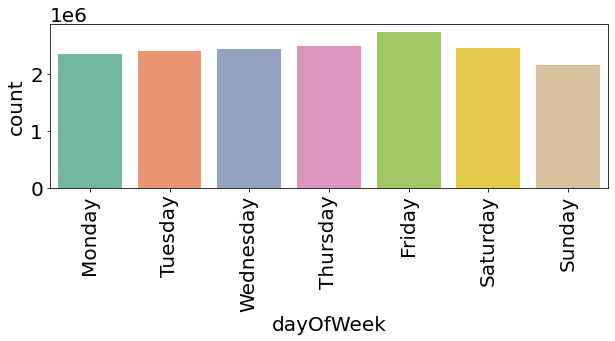

In [30]:
# посмотрим по дням недели
df_full = df.copy()
df_full.date = pd.to_datetime(df_full.date)
df_full['dayOfWeek_num'] = df_full.date.dt.weekday
df_full['dayOfWeek'] = df_full.date.dt.day_name()
plt.rcParams['figure.figsize'] = 10, 3

l2 = df_full.sort_values(by = 'date')['dayOfWeek']
plot = sns.countplot(l2,palette='Set2')
plot.set_xticklabels(labels=l2.unique(), rotation=90);

## Выделение регулярно питающихся

In [8]:
df.loc[:,'date'] = pd.to_datetime(df.date)
df_sur_all = df[df.value=='survival']
df_sur_all['day_of_week'] = df_sur_all.date.dt.dayofweek
df_sur = df_sur_all[df_sur_all.date<'2020-03-01']

C:\Users\user\AppData\Local\Temp\ipykernel_7188\1588471401.py:1: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:,'date'] = pd.to_datetime(df.date)
C:\Users\user\AppData\Local\Temp\ipykernel_7188\1588471401.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sur_all['day_of_week'] = df_sur_all.date.dt.dayofweek


In [9]:
sur_by_client = df_sur.sort_values(by = 'date').groupby(['client','date'])['amt'].median()

In [10]:
pivot_day = pd.pivot_table(data=df_sur, values='amt',columns='day_of_week',index='client',aggfunc='count',fill_value=0)
pivot_day_n = pivot_day.apply(lambda x: x/max(x), axis=1)
pivot_day_n

day_of_week,0,1,2,3,4,5,6
client,,,,,,,
224,0.555556,0.436508,0.428571,0.420635,0.523810,1.000000,0.809524
1108,0.574074,0.666667,0.648148,1.000000,1.000000,0.740741,0.333333
1117,0.612903,1.000000,0.774194,0.387097,0.709677,0.370968,0.306452
1197,0.455882,0.794118,0.588235,1.000000,0.647059,0.455882,0.367647
1223,0.755102,0.938776,0.938776,0.734694,1.000000,0.816327,0.448980
...,...,...,...,...,...,...,...
3560436,0.565657,0.929293,0.989899,1.000000,0.929293,1.000000,0.585859
3561841,0.866667,1.000000,0.992593,0.977778,0.918519,0.970370,0.844444
3561945,0.325758,0.500000,0.727273,0.598485,0.969697,1.000000,0.621212


In [11]:
# если хотя бы в четырех днях недели было более 200 транзакций
pivot_day[pivot_day.apply(lambda x: (x>100).sum()>=3, axis=1)]

day_of_week,0,1,2,3,4,5,6
client,,,,,,,
2005,121,102,155,89,138,119,98
2213,103,106,89,108,134,129,125
2677,86,104,121,97,108,91,70
6404,116,138,147,138,188,81,94
6908,95,89,117,99,136,132,104
...,...,...,...,...,...,...,...
3558664,126,129,126,137,129,86,78
3560021,136,122,137,130,152,152,85
3561841,117,135,134,132,124,131,114


In [12]:
pivot_spent = pd.pivot_table(data=df_sur, values='amt',columns='day_of_week',index='client',aggfunc='median',fill_value=0)
pivot_spent

day_of_week,0,1,2,3,4,5,6
client,,,,,,,
224,265.985,229.000,216.000,258.000,276.500,746.485,563.225
1108,450.000,456.580,510.840,411.250,369.770,384.990,432.905
1117,643.065,521.380,477.000,619.440,454.315,1299.210,582.250
1197,384.460,349.215,363.100,452.000,309.750,313.500,422.000
1223,501.700,529.500,401.600,502.165,698.000,515.500,219.500
...,...,...,...,...,...,...,...
3560436,131.150,145.200,184.000,177.600,150.605,146.000,275.500
3561841,295.000,385.000,300.000,367.000,364.500,780.000,685.740
3561945,180.990,190.300,198.500,198.000,212.000,335.540,363.290


In [13]:
pivot_spent.describe()

day_of_week,0,1,2,3,4,5,6
count,9962.000000,9962.000000,9962.000000,9962.000000,9962.000000,9962.000000,9962.000000
mean,456.107645,462.884240,466.500279,495.094633,517.393394,609.550951,582.524647
std,481.652657,555.147715,529.593272,854.088793,590.106622,679.267826,642.847418
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,247.360000,249.811250,251.333750,255.207500,277.000000,319.000000,301.877500
50%,353.442500,359.965000,362.482500,371.637500,402.000000,465.580000,449.312500
75%,538.000000,546.700000,550.000000,558.122500,602.503750,697.955000,674.740000
max,17774.750000,31380.000000,19328.000000,45000.000000,28773.000000,25747.750000,30000.000000


In [14]:
active_eaters = np.intersect1d(pivot_spent[pivot_spent.apply(lambda x: (x>250).sum()>=3, axis=1)].index,
              pivot_day[pivot_day.apply(lambda x: (x>100).sum()>=3, axis=1)].index
              )
active_eaters.shape

(1436,)

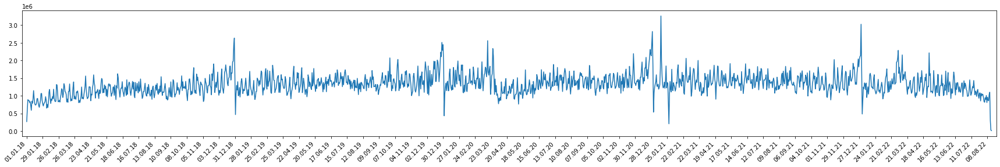

In [371]:
import matplotlib.dates as md
fig, ax = plt.subplots(figsize = (30, 4))

# specify the position of the major ticks at the beginning of the week
ax.xaxis.set_major_formatter(md.DateFormatter('%d.%m.%y'))
plt.setp(ax.xaxis.get_majorticklabels(), rotation = 45)
df_sur_active = df_sur_all[df_sur_all.client.isin(active_eaters)]

grouped = df_sur_active.sort_values(by = 'date').groupby('date')['amt'].sum().reset_index(name='amt')
dates = pd.Series(pd.date_range(df.date.min(),df.date.max())).dt.strftime('%d.%m.%y')
plt.plot(grouped.date, grouped.amt)
plt.margins(x=0.005)
plt.xticks(grouped.date[::28], dates[::28], rotation=45, ha='right');

In [364]:
grouped[(grouped.date>'2020-03-23')&(grouped.date<'2020-04-10')]

,date,amt
813,2020-03-24,1561726.80
814,2020-03-25,1623188.60
815,2020-03-26,2340027.06
816,2020-03-27,2133768.74
817,2020-03-28,1572705.46
818,2020-03-29,1042225.68
819,2020-03-30,1479046.27
820,2020-03-31,1113342.49
821,2020-04-01,1295094.11
822,2020-04-02,1019413.55


In [395]:
df_sur_active.sort_values(by = 'date').groupby('date')['amt']

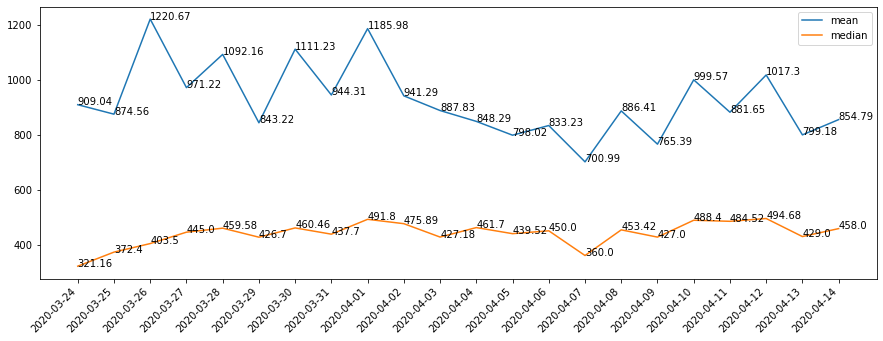

In [396]:
grouped_mean = df_sur_active.sort_values(by = 'date').groupby('date')['amt'].mean().reset_index(name='amt')
grouped_mean = grouped_mean[(grouped_mean.date>'2020-03-23')&(grouped_mean.date<'2020-04-15')]
plt.plot(grouped_mean.date, grouped_mean.amt, label='mean')
for a,b in zip(grouped_mean.date, round(grouped_mean.amt,2)): 
    plt.text(a, b, str(b))

grouped_median = df_sur_active.sort_values(by = 'date').groupby('date')['amt'].median().reset_index(name='amt')
grouped_median = grouped_median[(grouped_median.date>'2020-03-23')&(grouped_median.date<'2020-04-15')]
plt.plot(grouped_median.date, grouped_median.amt, label='median')
for a,b in zip(grouped_median.date, round(grouped_median.amt,2)): 
    plt.text(a, b, str(b))
    
plt.xticks(grouped_mean.date, rotation=45, ha='right')
plt.legend();

In [357]:
pd.datetime(2020,4,27) + pd.DateOffset(days=28)

C:\Users\user\AppData\Local\Temp\ipykernel_16436\264436973.py:1: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  pd.datetime(2020,4,27) + pd.DateOffset(days=28)


Timestamp('2020-05-25 00:00:00')

In [374]:
df_sur_active_before = df_sur_active[(df_sur_active.date>'2020-02-28')&(df_sur_active.date<'2020-03-29')]
pivot_day_active_before = pd.pivot_table(data=df_sur_active_before, values='amt',columns='day_of_week',
                                  index='client',aggfunc='sum',fill_value=0)
pivot_day_active_before.median()

day_of_week
0    2045.980
1    2237.670
2    2272.220
3    2610.490
4    3254.880
5    3813.755
6    2276.855
dtype: float64

In [372]:
df_sur_active = df_sur_all[df_sur_all.client.isin(active_eaters)]
df_sur_active_in = df_sur_active[(df_sur_active.date>'2020-03-28')&(df_sur_active.date<'2020-04-27')]
pivot_day_active_in = pd.pivot_table(data=df_sur_active_in, values='amt',columns='day_of_week',
                                  index='client',aggfunc='sum',fill_value=0)
pivot_day_active_in.median()

day_of_week
0    1859.51
1    1785.16
2    2015.92
3    1925.30
4    2395.53
5    2125.29
6    2082.67
dtype: float64

In [373]:
df_sur_active = df_sur_all[df_sur_all.client.isin(active_eaters)]
df_sur_active_after = df_sur_active[(df_sur_active.date>'2020-04-26')&(df_sur_active.date<'2020-05-26')]
pivot_day_active_after = pd.pivot_table(data=df_sur_active_after, values='amt',columns='day_of_week',
                                  index='client',aggfunc='sum',fill_value=0)
pivot_day_active_after.median()

day_of_week
0    2645.32
1    1835.61
2    1907.59
3    2108.36
4    2570.22
5    2086.97
6    1718.74
dtype: float64

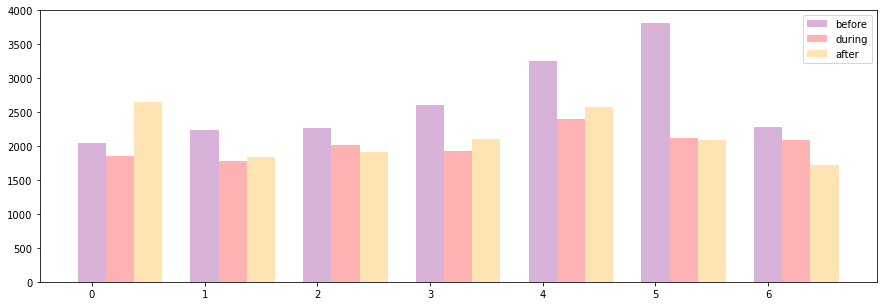

In [375]:
barWidth = 0.25
br1 = np.arange(7)
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

plt.bar(br1, pivot_day_active_before.median(), 
        color='purple', alpha=0.3, width = barWidth, label='before')
plt.bar(br2, pivot_day_active_in.median(), 
        color='red', alpha=0.3, width = barWidth, label='during')
plt.bar(br3, pivot_day_active_after.median(), 
        color='orange', alpha=0.3, width = barWidth, label='after')
plt.legend();

In [376]:
pivot_day_active_in

day_of_week,0,1,2,3,4,5,6
client,,,,,,,
2005,974.76,7015.00,0.00,0.00,3457.55,3720.06,26912.84
2677,429.00,981.07,5898.87,0.00,4564.11,1385.21,248.00
6404,7531.81,3801.57,60550.40,15581.99,22852.77,1553.81,22553.01
6908,4394.70,2243.78,1352.03,3672.96,999.00,9747.41,3024.70
7601,0.00,0.00,0.00,0.00,0.00,1319.00,0.00
...,...,...,...,...,...,...,...
3548715,258.73,1570.16,14128.55,1691.11,4509.35,8819.33,8943.74
3550334,1837.84,1962.72,2943.59,3088.55,1468.82,953.84,4558.37
3550444,492.99,5059.38,1005.00,707.66,9985.78,766.70,1894.27


In [28]:
df_sur.loc[:,'bin'] = pd.cut(df_sur['amt'], [0,10,200,500,1000,5000,10000,50000,9999999])

C:\Users\user\AppData\Local\Temp\ipykernel_16436\3025786108.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sur.loc[:,'bin'] = pd.cut(df_sur['amt'], [0,10,200,500,1000,5000,10000,50000,9999999])


,client,card,date,amt,mcc,group,value,day_of_week,bin
0,390989,3048567,2018-01-01,878.00,5814,food,survival,0,"(500, 1000]"
1,1309946,3226559,2018-01-01,249.00,5411,food,survival,0,"(200, 500]"
2,1386278,2715990,2018-01-01,50.00,5499,food,survival,0,"(10, 200]"
4,710293,3396065,2018-01-01,464.90,5814,food,survival,0,"(200, 500]"
5,2406107,3465449,2018-01-01,909.38,5411,food,survival,0,"(500, 1000]"
...,...,...,...,...,...,...,...,...,...
19262633,531454,6731427,2022-08-15,248.00,5814,food,survival,0,"(200, 500]"
19262636,691106,4775403,2022-08-15,1330.00,5814,food,survival,0,"(1000, 5000]"
19262637,2089178,6542071,2022-08-15,198.00,5814,food,survival,0,"(10, 200]"
19262645,141623,4745797,2022-08-15,1528.00,5411,food,survival,0,"(1000, 5000]"


In [29]:
pivot_out = pd.pivot_table(data=df_sur, values='amt',columns='bin',index='client',aggfunc='count',fill_value=0)
pivot_out

bin,"(0, 10]","(10, 200]","(200, 500]","(500, 1000]","(1000, 5000]","(5000, 10000]","(10000, 50000]","(50000, 9999999]"
client,,,,,,,,
224,1,184,220,118,175,7,4,1
1108,0,107,210,166,39,0,0,0
1117,0,156,246,155,149,13,4,3
1197,0,181,340,214,109,17,5,0
1223,1,170,244,141,164,12,1,0
...,...,...,...,...,...,...,...,...
3560436,23,1161,322,214,240,20,1,0
3561841,16,444,582,363,373,26,11,0
3561945,1,598,406,284,288,11,0,0


## back

In [7]:
df = df[df.client.isin(df.client.value_counts().iloc[:3000].index)]
df.shape

(8265305, 7)

In [8]:
df.amt = df.amt.astype('int')
df.dtypes

client     int64
card       int64
date      object
amt        int32
mcc        int64
group     object
value     object
dtype: object

Лишний раз убедимся, в каком порядке идут базовые ценности

In [10]:
pivot_money_tr = pd.pivot_table(df, index='client', columns=['date','value'],
                                    values='amt', aggfunc='sum', fill_value=0)
# Используем следующую конструкцию, чтобы были учтены все дни (даже если там не было транзакций)
pivot_money_tr = pivot_money_tr.stack()
pivot_money_tr = pivot_money_tr.reindex(pd.MultiIndex.from_product(pivot_money_tr.index.levels, 
                                                                       names=pivot_money_tr.index.names), fill_value=0)

In [11]:
pivot_money_tr

date                      2018-01-01  2018-01-02  2018-01-03  2018-01-04  \
client  value                                                              
2005    self_realization           0        8145           0           0   
        socialization              0           0           0           0   
        survival                   0           0           0           0   
2213    self_realization           0           0           0           0   
        socialization              0           0           0           0   
...                              ...         ...         ...         ...   
3562613 socialization              0           0           0           0   
        survival                   0           0           0           0   
3564569 self_realization           0           0           0           0   
        socialization              0           0           0           0   
        survival                   0           0           0           0   

date                      2018-01-05  2018-01-06  2018-01-07  2018-01-08  \
client  value                                                              
2005    self_realization           0           0           0           0   
        socialization           2491           0           0           0   
        survival                6200           0        1914           0   
2213    self_realization           0           0           0           0   
        socialization              0           0           0           0   
...                              ...         ...         ...         ...   
3562613 socialization              0           0           0           0   
        survival                   0           0           0           0   
3564569 self_realization           0           0           0           0   
        socialization              0           0           0           0   
        survival                   0           0           0           0   

date                      2018-01-09  2018-01-10  ...  2022-08-06  2022-08-07  \
client  value                                     ...                           
2005    self_realization           0         251  ...           0           0   
        socialization              0           0  ...           0           0   
        survival                   0           0  ...           0           0   
2213    self_realization          66           0  ...       19940       24720   
        socialization              0           0  ...         842         590   
...                              ...         ...  ...         ...         ...   
3562613 socialization              0           0  ...          30          30   
        survival                   0           0  ...        1010          59   
3564569 self_realization           0           0  ...        1074           0   
        socialization              0           0  ...           0         125   
        survival                   0           0  ...         708        2087   

date                      2022-08-08  2022-08-09  2022-08-10  2022-08-11  \
client  value                                                              
2005    self_realization           0           0           0           0   
        socialization              0           0           0           0   
        survival                   0           0           0           0   
2213    self_realization         199           0        6000        3000   
        socialization           1061        2606        1584         880   
...                              ...         ...         ...         ...   
3562613 socialization             56          58          28          28   
        survival                   0           0           0           0   
3564569 self_realization           0           0          89           0   
        socialization             96           0           0        2462   
        survival                   0         831        

# Предобработка данных

## Составление датафрейма: факт совершения транзакций, общая сумма за день

In [403]:
bin_compressed = preprocessing.create_trans_data(df=df, col_clientid='client', col_date='date', 
                                   col_group='value', col_amount='amt')
bin_compressed.head()

,bin_trans,money_trans
2005,"[[0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0,...","[[0, 8145, 0, 0, 0, 0, 0, 0, 0, 251, 0, 0, 632..."
2213,"[[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 66, 0, 0, 0, 0, 0, 0..."
3427,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
5044,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1810,..."
5112,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [16]:
# Сохраним для того, чтобы получить реальные id клиентов и сумму позже
bin_compressed.to_pickle('1822_real_id_bin_money.pkl')

## Добавление признаков из даты

К данным по транзакциям добавим информацию о дне неделе и месяце, которые были закодированы с помощью синуса и косинуса для обеспечения одинакового расстояния между всеми элементами. 

In [404]:
feat_df = preprocessing.add_date_features(start_date=df.date.min(), end_date=df.date.max(),
                                          main_feat_trans=bin_compressed['bin_trans'])
feat_df

0       [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [1.0, 0....
1       [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
2       [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
3       [[0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
4       [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
                              ...                        
2995    [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
2996    [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
2997    [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
2998    [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
2999    [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0], [0.0, 0....
Length: 3000, dtype: object

В итоге, каждый день представляет собой вектор из семи признаков (факт совершения транзакции первой категории, второй, третьей, синус и косинус дня недели, синус и косинус месяца), что дает окончательную размерность признакового пространства для каждого пользователя, равную 546х7.

In [31]:
feat_df.iloc[0].shape

(1688, 7)

In [59]:
feat_df.to_pickle("1822_3000_amnt_binclass.pkl", protocol=4)

# Предсказания на микро-уровне (каждый клиент)

## Обучающая и тестовая выборки

Обучаемся на полутора годах(?) 01.01.18-30.06.19. тестируем на 01.07.19 - 31.12.19 (на основе их -- ранняя остановка).

А 2020-2022 года идут на тестовые недели

In [32]:
days_in_train=365
train_df = feat_df.apply(lambda x: x[ : days_in_train])
test_df = feat_df.apply(lambda x: x[days_in_train : 561])

In [33]:
np.random.seed(42)

# Зададим порядок клиентов 
clients = list(feat_df.index)
#random_clients = np.random.choice(clients,size=clients.shape[0],replace=False)
#random_clients[:10]
clients[:5]

[0, 1, 2, 3, 4]

## Пробуем новые изм.модели на микроуровне

In [24]:
importlib.reload(micro_help_functions)

<module 'micro_help_functions' from 'C:\\Users\\user\\Documents\\mk\\18-22\\micro_help_functions.py'>

In [25]:
def main_s(train_loader, test_loader, the_model, loss_function, optimizer, epoch_n):
    '''
    Основная функция с обучением и валидацией модели.
    
    Параметры:
        train_loader -- даталоадер для обучающей выборки
        test_loader -- даталоадер для валидационной выборки
        the_model -- сама модель
        loss_function -- функция ошибки
        optimizer -- оптимизатор
        epoch_n -- кол-во эпох
    Вывод:
        Ошибки на обучающей и тестовой выборках, лучшая модель
    '''

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    train_losses, test_losses = [], []
    best_loss = 999
    epochs_since_improvement = 0
    checkpoint= {}
    
    # Для каждой эпохи
    for epoch in trange(epoch_n, desc='epoch'):
        batch_losses = []
        
        the_model.train() # "Включить" режим обучения (dropout слой будет работать)
        
        # уменьшаем шаг обучения каждые 10 эпох, если нужно
        if epochs_since_improvement == 100:
            break
        if epochs_since_improvement > 0 and epochs_since_improvement % 10 == 0:
            micro_model_functions.adjust_learning_rate(optimizer, 0.8)
                
        # Обучение для каждого батча
        for i, (input, y) in enumerate(train_loader):
            # переносим тензоры на GPU, если можно
            input = input.to(device)
            y = y.to(device)
            
            # пропускаем через модель и получаем предсказания
            preds = the_model(input)
            # обнуляем градиенты, чтобы не накапливались с предыдущих
            optimizer.zero_grad() 
            # считаем ошибку
            loss = loss_function(preds, y) 
            loss.backward()
            # обновляем веса
            optimizer.step() 

            batch_losses.append(loss.item())

        batch_losses = np.array(batch_losses)
        train_losses.append(np.mean(batch_losses))
        print(f'TRAIN: {epoch} epoch loss: {train_losses[-1]:.4f}')
        
        # Проводим валидацию после эпохи обучения
        
        the_model.eval() # "Включить" режим валидации 
        
        # вручную отключаем вычисление градиентов
        with torch.no_grad(): 
            batch_losses = []
            # Валидация для каждого батча
            for i, (input, y) in enumerate(test_loader):
                # переносим тензоры
                input = input.to(device)
                y = y.to(device)
                preds = the_model(input)
                # считаем ошибку
                loss = loss_function(preds, y) 
                batch_losses.append(loss.item())

        batch_losses = np.array(batch_losses)
        test_losses.append(np.mean(batch_losses))
        recent_loss = test_losses[-1]
        print(f'___TEST: {epoch} epoch loss: {recent_loss:.4f}')
        
        # Сохраняем модель на эпоху с лучшей ошибкой на тесте
        best_loss = min(recent_loss, best_loss)
        if recent_loss > best_loss:
            epochs_since_improvement += 1
            print(f"Epochs since last improvement: {epochs_since_improvement}\n")
        else:
            epochs_since_improvement = 0
            checkpoint = {'model': the_model.state_dict(),
                          'optimizer' : optimizer.state_dict()}
            #print("Saving")
            
    print(f'Train: {train_losses[-1]}, Test: {test_losses[-1]}')
    return train_losses, test_losses, checkpoint

In [26]:
def train_model2(all_x, all_y, all_test_x, all_test_y, 
                e_n=100, lr=0.0005, cat=0, n_cats=3, n_train=28):
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    batch_size = 128
    x_for_train = np.concatenate((all_x[:,:,n_cats:],all_x[:,:,cat].reshape(-1,n_train,1)),axis=2)
    x_for_test = np.concatenate((all_test_x[:,:,n_cats:],all_test_x[:,:,cat].reshape(-1,n_train,1)),axis=2)
    
    train_loader = torch.utils.data.DataLoader(micro_model_functions.TransactionsDataset(x_for_train[:], 
                                                                   all_y[:,:,cat].astype('float32')),
                                               batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=0)  
    test_loader = torch.utils.data.DataLoader(micro_model_functions.TransactionsDataset(x_for_test, 
                                                                  all_test_y[:,:,cat].astype('float32')),
                                               batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=0)

    the_model = micro_model_functions.LSTM_cat_model(input_size=5, hidden_size=64, to_pred=7,
                            dropout_inside=0.2,dropout_outside=0.1).to(device)
    loss_function = nn.L1Loss().to(device)

    optimizer = torch.optim.Adam(params=filter(lambda p: p.requires_grad, the_model.parameters()),lr=lr)

    # обучаем!
    train_losses, test_losses, checkpoint = micro_model_functions.main_s(train_loader, test_loader, the_model, 
                                                                 loss_function, optimizer, epoch_n=e_n)
    
    return the_model, optimizer, train_losses, test_losses, checkpoint

In [29]:
feat_df2 = preprocessing.add_date_features(start_date=df.date.min(), end_date=df.date.max(),
                                          main_feat_trans=bin_compressed['money_trans'])
train_df2 = feat_df2.apply(lambda x: x[ : days_in_train])
test_df2 = feat_df2.apply(lambda x: x[days_in_train : 730])

In [30]:
def get_df2(df, client_id, k=1, n_cats=3, n_train=28, n_pred=7, use_scaling=False,
            scalers=[]):
    '''
    Получение сдвигов для временного ряда клиента.
    
    Параметры:
        df -- датасет с транзакционными данными
        client_id --идентификатор клиента
        k -- брать каждый k-ый сдвиг
        n_cats -- количество категорий транзакций
        n_train -- кол-во дней, на основании которых делается прогноз
        n_pred -- сколько дней прогнозируется за раз
    Вывод:
        Датафрейм со сдвигами.
    '''
    a = pd.DataFrame(df.loc[client_id].copy(), 
                 columns=[*[f'event_{i}' for i in range(n_cats)]
                          ,'d_sin','d_cos','m_sin','m_cos'])
    if use_scaling:
        if not scalers:
            scalers = []
            for i in range(n_cats):
                scaler = MinMaxScaler(clip=False, feature_range=(-1, 1))
                a.iloc[:,i] = scaler.fit_transform(a.iloc[:,i].to_numpy().reshape(-1, 1))
                scalers.append(scaler)
        else:
            for i in range(n_cats):
                a.iloc[:,i] = scalers[i].transform(a.iloc[:,i].to_numpy().reshape(-1, 1))
    else:
        scalers = []
        
    # Для экономии меняем тип
    cols = ['d_sin','d_cos','m_sin','m_cos']
    a[cols] = a[cols].apply(lambda x: x.astype('float16'))
    #cols = [f'event_{i}' for i in range(n_cats)]
    #a[cols] = a[cols].apply(lambda x: x.astype(event_dtype))

    orig_cols = a.columns
    
    # Вычисляем сдвиги всех признаков для входных данных модели
    to_add = []
    for i in range(1,n_train):
          for col in orig_cols[:]:
                to_add.append(a[col].shift(-i).iloc[::k].rename(f'{col}-{i}'))
    # Сдвиги целевого признака
    for i in range(n_train, n_train+n_pred):
          for col in orig_cols[:n_cats]: #предсказываем факт совершения транзакции
                to_add.append(a[col].shift(-i).iloc[::k].rename(f'{col}+{i-n_train+1}'))
    # Объединяем
    a = pd.concat([a.iloc[::k]]+to_add, axis=1) 
    a.dropna(inplace=True)
    
    return a, scalers

In [31]:
def get_df_full_y_new2(df, min_date='2020-07-01',max_date='2021-06-29', n_cats=3,
                     n_train=28,n_pred=7,use_scaling=False,scalers=[]):
    '''
    Получение сдвигов для всех временных рядов с добавлением даты к целевой переменной.
    Параметры:
        df -- датасет с транзакционными данными
        min_date -- дата начала учета транзакций (YYYY-MM-DD)
        max_date -- дата конца учета транзакций (YYYY-MM-DD)
        n_cats -- количество категорий транзакций
        n_train -- кол-во дней, на основании которых делается прогноз
        n_pred -- сколько дней прогнозируется за раз
    Вывод:
        Датафрейм со сдвигами.
    '''
    a = pd.DataFrame(df, columns=[*[f'event_{i}' for i in range(n_cats)]
                          ,'d_sin','d_cos','m_sin','m_cos'])
    if use_scaling:
        if not scalers:
            scalers = []
            for i in range(n_cats):
                scaler = MinMaxScaler(clip=False, feature_range=(-1, 1))
                a.iloc[:,i] = scaler.fit_transform(a.iloc[:,i].to_numpy().reshape(-1, 1))
                scalers.append(scaler)
        else:
            for i in range(n_cats):
                a.iloc[:,i] = scalers[i].transform(a.iloc[:,i].to_numpy().reshape(-1, 1))
    else:
        scalers = []
    
    cols = ['d_sin','d_cos','m_sin','m_cos']
    a[cols] = a[cols].apply(lambda x: x.astype('float16'))
    #cols = [f'event_{i}' for i in range(n_cats)]
    #a[cols] = a[cols].apply(lambda x: x.astype('int32'))
    a['date'] = pd.date_range(min_date,max_date)

    orig_cols = a.columns
    # Вычисляем сдвиги всех признаков для входных данных модели
    to_add = []
    for i in range(1,n_train):
          for col in orig_cols[:]:
                to_add.append(a[col].shift(-i).rename(f'{col}-{i}'))
    # Вычисляем сдвиги всех признаков как целевых
    for i in range(n_train, n_train+n_pred):
          for col in orig_cols[:]:
                to_add.append(a[col].shift(-i).rename(f'{col}+{i-n_train+1}'))
    # Объединяем            
    a = pd.concat([a]+to_add, axis=1) 
    a.dropna(inplace=True)
    
    return a, scalers

In [34]:
def get_splits_by_client2(client_id, train_df, test_df, n_cats=3, 
                         n_train=28, n_pred=7, n_features=7):
    '''
    Получение признаков и целевой переменной для клиента.
    
    Параметры:
        client_id -- идентификатор клиента
        train_df -- датасет с транзакционными данными за обучающий период
        test_df -- датасет с транзакционными данными за тестовый период
        n_cats -- количество категорий транзакций
        n_train -- кол-во дней, на основании которых делается прогноз
        n_pred -- сколько дней прогнозируется за раз
        n_features -- кол-во признаков для обучения
    Вывод:
        Признаки и целевая переменная для обучающей и тестовой выборок.
    '''
    train_client, scalers = get_df2(train_df2, client_id, k=1, n_train=n_train, 
                          n_pred=n_pred,use_scaling=True)
    test_client, scalers = get_df2(test_df2, client_id, k=1, n_train=n_train, 
                         n_pred=n_pred,scalers=scalers,use_scaling=True)
    
    all_x = train_client.iloc[:,:-n_pred*n_cats].values.reshape(-1,n_train,n_features)
    all_y = train_client.iloc[:,-n_pred*n_cats:].values.reshape(-1,n_pred,n_cats)

    all_test_x = test_client.iloc[:,:-n_pred*n_cats].values.reshape(-1,n_train,n_features)
    all_test_y = test_client.iloc[:,-n_pred*n_cats:].values.reshape(-1,n_pred,n_cats)
    
    return all_x,all_y,all_test_x,all_test_y,scalers

In [35]:
from sklearn.preprocessing import MinMaxScaler


In [36]:
# Получим данные для клиента 
all_x,all_y,\
all_test_x,all_test_y,scalers = get_splits_by_client2(2901,train_df2, 
                                              test_df2)

In [86]:
cl_model, cl_optimizer, train_losses, \
test_losses, cl_checkpoint = train_model2(all_x,all_y,all_test_x,all_test_y,
                                            e_n=1000, lr=0.0005,cat=2)

epoch:   0%|          | 0/1000 [00:00<?, ?it/s]

In [87]:
n_cats=3
n_train=28
cat = 2
x_for_test = np.concatenate((all_test_x[:,:,n_cats:],all_test_x[:,:,cat].reshape(-1,n_train,1)),axis=2)
test_loader = torch.utils.data.DataLoader(
    micro_model_functions.TransactionsDataset(x_for_test,
                                              all_test_y[:,:,cat].astype('float32')),
                                               batch_size=128, shuffle=True, pin_memory=True, num_workers=0)

In [88]:
tests, y_t = next(iter(test_loader))
cl_model.eval()
preds = cl_model(tests)
preds

tensor([[-0.9350, -0.9174, -0.9387, -0.9397, -0.9369, -0.9335, -0.9130],
        [-0.9413, -0.9213, -0.9461, -0.9460, -0.9383, -0.9381, -0.9172],
        [-0.9322, -0.9157, -0.9355, -0.9370, -0.9363, -0.9314, -0.9113],
        [-0.9415, -0.9214, -0.9464, -0.9462, -0.9383, -0.9382, -0.9173],
        [-0.9413, -0.9213, -0.9461, -0.9459, -0.9384, -0.9381, -0.9172],
        [-0.9412, -0.9212, -0.9460, -0.9458, -0.9383, -0.9381, -0.9171],
        [-0.9415, -0.9215, -0.9463, -0.9461, -0.9384, -0.9383, -0.9174],
        [-0.9416, -0.9216, -0.9465, -0.9462, -0.9385, -0.9384, -0.9175],
        [-0.9416, -0.9215, -0.9465, -0.9462, -0.9384, -0.9383, -0.9174],
        [-0.9416, -0.9215, -0.9466, -0.9463, -0.9384, -0.9383, -0.9175],
        [-0.9411, -0.9212, -0.9458, -0.9457, -0.9383, -0.9380, -0.9170],
        [-0.9409, -0.9208, -0.9455, -0.9455, -0.9381, -0.9378, -0.9167],
        [-0.9414, -0.9214, -0.9463, -0.9461, -0.9383, -0.9382, -0.9173],
        [-0.9409, -0.9210, -0.9456, -0.9455, -0.938

In [89]:
scalers[2].inverse_transform(y_t.detach().numpy())

array([[   0.      ,    0.      ,    0.      ,   90.000015,  567.      ,
           0.      ,  282.00006 ],
       [   0.      ,    0.      ,    0.      ,    0.      ,    0.      ,
           0.      ,    0.      ],
       [   0.      ,    0.      ,    0.      , 1303.      , 2501.      ,
         294.00006 ,  192.99995 ],
       [   0.      ,    0.      ,    0.      ,    0.      ,    0.      ,
         439.      , 2197.      ],
       [   0.      ,    0.      ,    0.      ,    0.      ,    0.      ,
           0.      ,    0.      ],
       [   0.      ,    0.      ,    0.      ,    0.      ,    0.      ,
           0.      ,    0.      ],
       [ 370.00006 ,    0.      ,  116.000015,    0.      ,    0.      ,
          96.000015,  174.99995 ],
       [ 380.00006 ,    0.      ,    0.      ,    0.      ,    0.      ,
           0.      ,    0.      ],
       [ 439.      ,    0.      ,  483.      ,   76.99994 ,  380.00006 ,
           0.      ,    0.      ],
       [   0.      ,    0.  

In [90]:
scalers[2].inverse_transform(preds.detach().numpy())

array([[163.19238, 207.53429, 153.98819, 151.39845, 158.41411, 166.96611,
        218.57436],
       [147.45282, 197.74455, 135.308  , 135.73091, 155.05222, 155.48051,
        208.03163],
       [170.45949, 211.68884, 162.14125, 158.31377, 160.10097, 172.33174,
        222.92793],
       [147.02975, 197.47379, 134.71136, 135.22429, 154.99442, 155.21725,
        207.72717],
       [147.50119, 197.62025, 135.48935, 135.93338, 154.89423, 155.401  ,
        207.91557],
       [147.75757, 197.92216, 135.79651, 136.15323, 155.05356, 155.63507,
        208.24234],
       [146.95247, 197.34619, 134.86786, 135.39201, 154.79388, 155.01881,
        207.63268],
       [146.80467, 196.9486 , 134.52477, 135.17891, 154.63051, 154.88359,
        207.16978],
       [146.75914, 197.17622, 134.45589, 135.04742, 154.79793, 154.94963,
        207.41943],
       [146.72514, 197.1283 , 134.28786, 134.9068 , 154.83852, 154.9748 ,
        207.3444 ],
       [148.0165 , 198.10516, 136.11143, 136.412  , 155.1199

In [37]:
def base_model_data(q, model_after,days,cat=0, n_train=28, n_pred=7, n_features=7):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    #drop date column
    all_test_x = q.iloc[:,:-n_pred*(n_features+1)].drop(q.iloc[:,7:-n_pred*(n_features+1):8], axis=1, inplace=False
                                                       ).values.reshape(-1,n_train,n_features)
    all_test_y = q.iloc[:,-n_pred*(n_features+1):].values.reshape(-1,n_pred,(n_features+1))

    x_for_test = np.concatenate((all_test_x[:,:,3:],all_test_x[:,:,cat].reshape(-1,n_train,1)),axis=2)

    test_loader_n = torch.utils.data.DataLoader(TransactionsDataset(x_for_test, 
                                                                    all_test_y[:,:,cat].astype('float32')),
                                               batch_size=x_for_test.shape[0], shuffle=False, pin_memory=True)
    tests, y_t = next(iter(test_loader_n))

    model_after.eval()
    preds = pred(tests, model_after)
    y = y_t.to(device)

    r=[]
    y_days = all_test_y[:,:,-1].astype('datetime64[D]')
    for week_n, week in enumerate(days):
        pred_wday = preds[week_n]
        y_wday = y[week_n]

        #f1_scores = f1_score(y_wday.detach().cpu(), pred_wday.detach().cpu(), 
                             #zero_division=0)
        r.append([y_wday.detach().cpu().numpy(),
                  pred_wday.detach().cpu().numpy()])
    
    return r

In [106]:
importlib.reload(micro_model_functions)

client_dict = {}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)

# Для каждого клиента отдельная модель

for client_id in tqdm(clients[:1], desc='clients'):
    b_cats_r = []
    i_cats_r = []
    
    # Получим данные для клиента 
    all_x,all_y,all_test_x,all_test_y, _ = get_splits_by_client2(client_id, train_df2, test_df2)
    
    # Для каждой категории отдельная модель
    for cat in range(3):
        
        # Обучаем базовую модель
        cl_model, cl_optimizer, train_losses, test_losses, cl_checkpoint = train_model2(all_x,all_y,
                                                                                       all_test_x,all_test_y, 
                                                                                       e_n=1000, lr=0.0005,cat=cat)
        weights=[]
        
        # Сохраняем базовую модель, чтобы потом на ее основе сделать инкрементальную модель
        torch.save(cl_checkpoint, f'model_{cat}.pth')
        model_after = micro_model_functions.LSTM_cat_model(input_size=5, hidden_size=64, to_pred=7).to(device)
        checkpoint = torch.load(f'./model_{cat}.pth')
        model_after.load_state_dict(checkpoint['model'])
        
        # Разделим временной интервал тестовой выборки на недели
        days = pd.date_range('2020-01-01','2022-08-09')
        days = np.array(days).reshape(-1,7).astype('datetime64[D]')
        # Получим данные для клиента с указанной датой для дней, которые будут предсказываться
        q, scalers = get_df_full_y_new2(feat_df2.loc[client_id][730-28:], 
                                                   min_date='2019-12-04', max_date='2022-08-15')
        q = q[::7]

        # Результаты базовой модели для тестовых недель
        b_r = micro_model_functions.base_model_data(q,model_after,days,cat=cat)
        b_cats_r.append(b_r)

        # Загружаем базовую модель
        the_checkpoint = torch.load(f'./model_{cat}.pth')
        imodel_after = micro_model_functions.LSTM_cat_model(input_size=5, hidden_size=64, to_pred=7).to(device)
        imodel_after.load_state_dict(the_checkpoint['model'])
        ioptimizer_after = torch.optim.Adam(params=filter(lambda p: p.requires_grad, imodel_after.parameters()),lr=0.0005)
        ioptimizer_after.load_state_dict(the_checkpoint['optimizer'])
        # Меняем шаг обучения у оптимизатора
        for param_group in ioptimizer_after.param_groups:
            param_group['lr'] = 0.001
        
        # Результаты инкрементальной модели для тестовых недель
        i_r = micro_model_functions.incr_model_data(q, imodel_after,days,ioptimizer_after, weights,with_weights=False,cat=cat)
        i_cats_r.append(i_r)
    
    # Сохраняем предсказания и реальные значения для двух моделей
    client_dict[client_id] = [b_cats_r,i_cats_r]

clients:   0%|          | 0/1 [00:00<?, ?it/s]

epoch:   0%|          | 0/1000 [00:00<?, ?it/s]

epoch:   0%|          | 0/1000 [00:00<?, ?it/s]

epoch:   0%|          | 0/1000 [00:00<?, ?it/s]

In [118]:
df_2models = pd.DataFrame.from_dict(client_dict).T
df_2models.columns = [['base','inc']]
df_2models

,base,inc
0,[[[[ 0. 1078. 3338. 0. 300. 0. 0.]...,[[[[ 0. 1078. 3338. 0. 300. 0. 0.]...


In [119]:
col_base='base'
col_inc='inc'
n_cats=3
n_test_weeks=136
n_pred=7

base_array = np.array([np.vstack(x) for x in df_2models[col_base].to_numpy().reshape(-1)],dtype=object
                         ).reshape(-1,n_cats,n_test_weeks,2,n_pred) # 2 -- real and predicted values

inc_array = np.array([np.vstack(x) for x in df_2models[col_inc].to_numpy().reshape(-1)],dtype=object
                        ).reshape(-1,n_cats,n_test_weeks,2)
inc_array = np.array([i.flatten() for i in inc_array.reshape(-1)],dtype=object
                        ).reshape(-1,n_cats,n_test_weeks,2,n_pred)

C:\Users\user\anaconda3\lib\site-packages\numpy\core\shape_base.py:121: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


In [131]:
from sklearn.metrics import mean_squared_error as mse

In [132]:
inc_with_metric = np.array([[[mse(ys[0],(ys[1]).astype('int')) for ys in weeks] for weeks in cats] for cats in inc_array])
inc_with_metric.shape

(1, 3, 136)

In [133]:
np.array([np.sqrt(np.sum(user**2,0))/np.sqrt(3) for user in inc_with_metric]).shape

(1, 136)

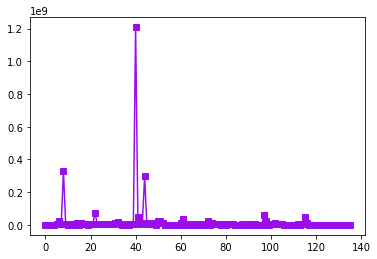

In [134]:
plt.plot(np.mean(np.array([np.sqrt(np.sum(user**2,0))/np.sqrt(3) for user in inc_with_metric]),0),
         's-',c='xkcd:violet',label='Базовая')

In [92]:
from sklearn.metrics import mean_absolute_percentage_error as mape

In [94]:
mape(scalers[2].inverse_transform(y_t.detach().numpy()),
     scalers[2].inverse_transform(preds.detach().numpy()))

5.228071e+17

## Предсказания для базовой и инкрементальной моделей

In [102]:
importlib.reload(micro_model_functions)

client_dict = {}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)

# Для каждого клиента отдельная модель

for client_id in tqdm(clients[2:3], desc='clients'):
    b_cats_r = []
    i_cats_r = []
    
    # Получим данные для клиента 
    all_x,all_y,all_test_x,all_test_y = micro_help_functions.get_splits_by_client(client_id, train_df, test_df)
    
    # Для каждой категории отдельная модель
    for cat in range(3):
        
        # Обучаем базовую модель
        cl_model, cl_optimizer, train_losses, test_losses, \
            cl_checkpoint, weights = micro_model_functions.train_model(all_x,all_y,
                                                                       all_test_x,all_test_y, 
                                                                       e_n=1000, lr=0.0005,cat=cat)
        
        # Сохраняем базовую модель, чтобы потом на ее основе сделать инкрементальную модель
        torch.save(cl_checkpoint, f'model_{cat}.pth')
        model_after = micro_model_functions.LSTM_cat_model(input_size=5, hidden_size=64, to_pred=7).to(device)
        checkpoint = torch.load(f'./model_{cat}.pth')
        model_after.load_state_dict(checkpoint['model'])
        
        # Разделим временной интервал тестовой выборки на недели
        days = pd.date_range('2019-01-01','2022-08-08')
        days = np.array(days).reshape(-1,7).astype('datetime64[D]')
        # Получим данные для клиента с указанной датой для дней, которые будут предсказываться
        q = micro_help_functions.get_df_full_y_new(feat_df.loc[client_id][365-28:], 
                                                   min_date='2018-12-04', max_date='2022-08-15')[::7]

        # Результаты базовой модели для тестовых недель
        b_r = micro_model_functions.base_model_data(q,model_after,days,cat=cat)
        b_cats_r.append(b_r)

        # Загружаем базовую модель
        the_checkpoint = torch.load(f'./model_{cat}.pth')
        imodel_after = micro_model_functions.LSTM_cat_model(input_size=5, hidden_size=64, to_pred=7).to(device)
        imodel_after.load_state_dict(the_checkpoint['model'])
        ioptimizer_after = torch.optim.Adam(params=filter(lambda p: p.requires_grad, imodel_after.parameters()),
                                            lr=0.0005)
        ioptimizer_after.load_state_dict(the_checkpoint['optimizer'])
        # Меняем шаг обучения у оптимизатора
        for param_group in ioptimizer_after.param_groups:
            param_group['lr'] = 0.0001
        
        # Результаты инкрементальной модели для тестовых недель
        i_r = micro_model_functions.incr_model_data(q, imodel_after,days,ioptimizer_after, 
                                                    with_weights=False,cat=cat)
        i_cats_r.append(i_r)
    
    # Сохраняем предсказания и реальные значения для двух моделей
    client_dict[client_id] = [b_cats_r,i_cats_r]

clients:   0%|          | 0/1 [00:00<?, ?it/s]

epoch:   0%|          | 0/1000 [00:00<?, ?it/s]

epoch:   0%|          | 0/1000 [00:00<?, ?it/s]

epoch:   0%|          | 0/1000 [00:00<?, ?it/s]

In [103]:
df_2models = pd.DataFrame.from_dict(client_dict).T
#df_2models.to_pickle('/content/drive/MyDrive/master/2nd/the_project/2700-3000_yt_yp_RIGHTV.pkl')
df_2models.columns = [['base','inc']]
df_2models

,base,inc
2,"[[[[0. 0. 0. 0. 0. 0. 0.], [0.541454 0.48680...","[[[[0. 0. 0. 0. 0. 0. 0.], [[0.54145396 0.4868..."


## Сравнение базовой модели с инкрементальной 

In [3]:
path_to_2models_data_folder = 'client_data_001_testfrom19/'

# Загрузим данные
df_2models = pd.concat(map(pd.read_pickle, glob.glob(path_to_2models_data_folder+'*.pkl')))
df_2models = df_2models[~df_2models.index.duplicated(keep='first')].sort_index()
df_2models.columns = [['base','inc']]

print(df_2models.shape)
df_2models.head()

(3000, 2)


,base,inc
0,"[[[[0. 1. 0. 1. 0. 0. 1.], [-1.182159 -1.289...","[[[[0. 1. 0. 1. 0. 0. 1.], [[-1.1821591 -1.28..."
1,"[[[[0. 1. 0. 0. 0. 0. 0.], [1.034886 1.173865...","[[[[0. 1. 0. 0. 0. 0. 0.], [[1.0348861 1.17386..."
2,"[[[[0. 0. 0. 0. 0. 0. 0.], [-0.10904915 0.006...","[[[[0. 0. 0. 0. 0. 0. 0.], [[-0.10904916 0.00..."
3,"[[[[0. 0. 0. 0. 0. 1. 0.], [0.18922582 0.62491...","[[[[0. 0. 0. 0. 0. 1. 0.], [[0.18922582 0.6249..."
4,"[[[[1. 0. 0. 0. 0. 0. 0.], [1.3155253 1.522739...","[[[[1. 0. 0. 0. 0. 0. 0.], [[1.315525 1.52273..."


### f1 scores

In [4]:
col_base='base'
col_inc='inc'
n_cats=3
n_test_weeks=188
n_pred=7

base_array = np.array([np.vstack(x) for x in df_2models[col_base].to_numpy().reshape(-1)],dtype=object
                         ).reshape(-1,n_cats,n_test_weeks,2,n_pred) # 2 -- real and predicted values

inc_array = np.array([np.vstack(x) for x in df_2models[col_inc].to_numpy().reshape(-1)],dtype=object
                        ).reshape(-1,n_cats,n_test_weeks,2)
inc_array = np.array([i.flatten() for i in inc_array.reshape(-1)],dtype=object
                        ).reshape(-1,n_cats,n_test_weeks,2,n_pred)

C:\Users\user\anaconda3\lib\site-packages\numpy\core\shape_base.py:121: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


In [7]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

SMALL_SIZE = 16
MEDIUM_SIZE = 18
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=17)    # legend fontsize
plt.rc('figure', titlesize=MEDIUM_SIZE)  # fontsize of the figure title

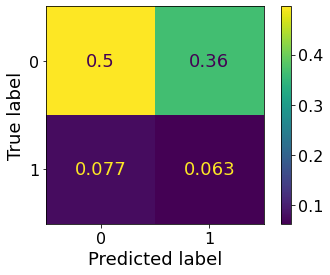

In [9]:
val_group = 0
cm = confusion_matrix(base_array[:,val_group,:,0,:].reshape(-1).astype('int'),
                      (base_array[:,val_group,:,1,:]>0).astype('int').reshape(-1), 
                      normalize='all')

ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1]).plot()

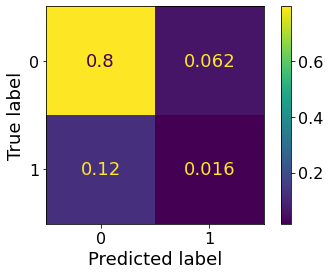

In [8]:
val_group = 0
cm = confusion_matrix(inc_array[:,val_group,:,0,:].reshape(-1).astype('int'),
                      (inc_array[:,val_group,:,1,:]>0).astype('int').reshape(-1), 
                      normalize='all')

ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1]).plot()

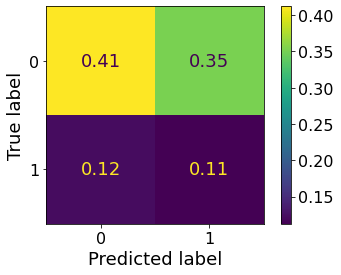

In [10]:
val_group = 1
cm = confusion_matrix(base_array[:,val_group,:,0,:].reshape(-1).astype('int'),
                     (base_array[:,val_group,:,1,:]>0).astype('int').reshape(-1), 
                      normalize='all')

ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1]).plot()

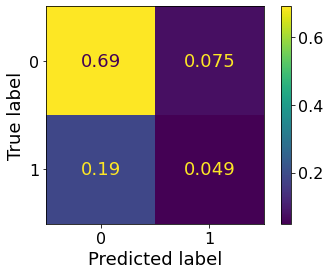

In [11]:
val_group = 1
cm = confusion_matrix(inc_array[:,val_group,:,0,:].reshape(-1).astype('int'),
                     (inc_array[:,val_group,:,1,:]>0).astype('int').reshape(-1), 
                      normalize='all')

ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1]).plot()

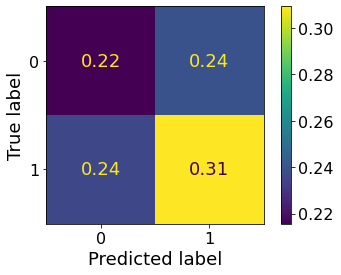

In [12]:
val_group = 2
cm = confusion_matrix(base_array[:,val_group,:,0,:].reshape(-1).astype('int'),
                     (base_array[:,val_group,:,1,:]>0).astype('int').reshape(-1), 
                      normalize='all')

ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1]).plot()

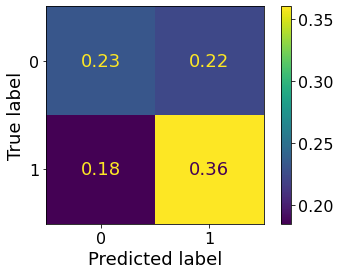

In [13]:
val_group = 2
cm = confusion_matrix(inc_array[:,val_group,:,0,:].reshape(-1).astype('int'),
                     (inc_array[:,val_group,:,1,:]>0).astype('int').reshape(-1), 
                      normalize='all')

ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1]).plot()

### back to normal

In [27]:
# Получим значения для каждой модели и "среднее" значение метрики
inc_with_metric, inc_with_metric_3in1, base_with_metric, \
base_with_metric_3in1 = micro_help_functions.get_base_inc_arrays(df_2models, 
                                                                 micro_help_functions.F1metr, n_test_weeks=188)

C:\Users\user\anaconda3\lib\site-packages\numpy\core\shape_base.py:121: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


In [28]:
SMALL_SIZE = 16
MEDIUM_SIZE = 18

font_size = 33
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=font_size)          # controls default text sizes
plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
plt.rc('axes', labelsize=font_size)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('legend', fontsize=font_size)    # legend fontsize
plt.rc('figure', titlesize=font_size)  # fontsize of the figure title

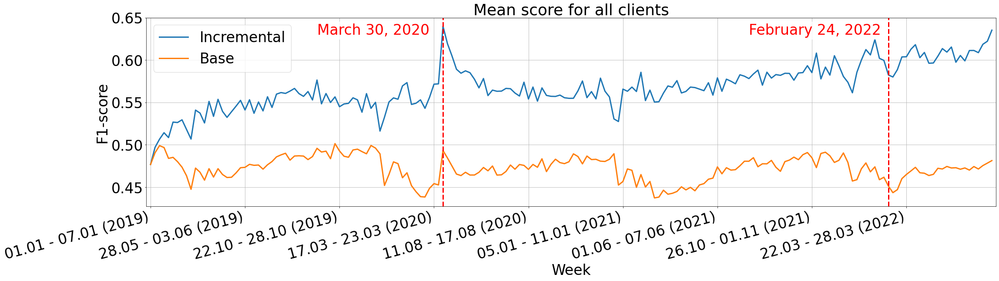

In [29]:
# Посмотрим на результаты двух моделей на тестовых неделях
plt.rcParams['figure.figsize'] = 35, 8

days_test = pd.date_range('2019-01-01','2022-08-08')
days_test = np.array(days_test).reshape(-1,7).astype('datetime64[D]')
a0 = pd.Series(days_test[:,0]).dt.strftime('%d.%m')
a1 = pd.Series(days_test[:,-1]).dt.strftime('%d.%m (%Y)')

'''
for cat in range(3):
    plt.plot(np.mean(base_with_metric[:,cat,:],0),'r-', alpha=0.1)
    plt.plot(np.mean(inc_with_metric[:,cat,:],0),'b--', alpha=0.15)
'''

plt.plot(a0+' - '+a1, np.mean(inc_with_metric_3in1,0),
         '-',c=cmap.colors[0],label='Incremental',linewidth=3)
plt.plot(a0+' - '+a1, np.mean(base_with_metric_3in1,0),
         '-',c=cmap.colors[1],label='Base',linewidth=3)

plt.xticks((a0+' - '+a1)[::21], rotation=15, ha='right')

plt.axvline(65, ls='--', lw=3, color='red')
plt.text(67-30,0.63,'March 30, 2020',c='red', fontsize=font_size, 
         bbox = dict(facecolor='white', alpha=0.8, linewidth=0))
plt.axvline(164, ls='--', lw=3, color='red')
plt.text(166-33,0.63,'February 24, 2022',c='red', fontsize=font_size, 
         bbox = dict(facecolor='white', alpha=0.8, linewidth=0))

plt.grid()
plt.legend()
plt.margins(x=0.005)

plt.xlabel('Week')
plt.ylabel('F1-score')
plt.title('Mean score for all clients',fontsize=font_size+3);

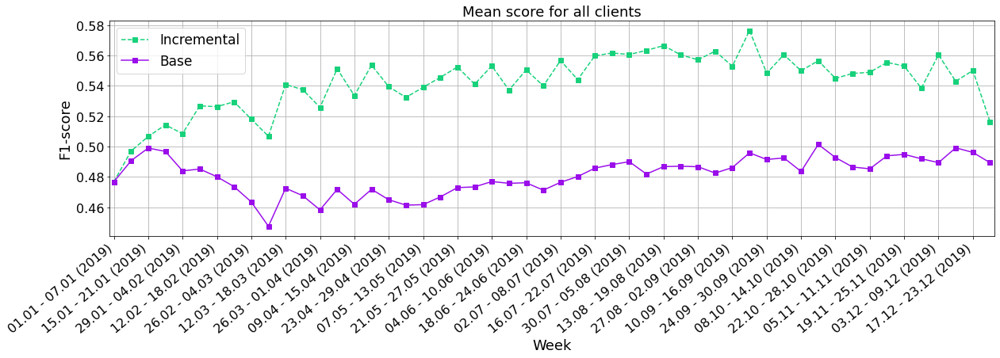

In [7]:
plt.rcParams['figure.figsize'] = 20, 5

days_test = pd.date_range('2019-01-01','2022-08-08')
days_test = np.array(days_test).reshape(-1,7).astype('datetime64[D]')
a0 = pd.Series(days_test[:,0][:52]).dt.strftime('%d.%m')
a1 = pd.Series(days_test[:,-1][:52]).dt.strftime('%d.%m (%Y)')

plt.plot(a0+' - '+a1, np.mean(inc_with_metric_3in1,0)[:52],
         's--',c='xkcd:seaweed',label='Incremental')
plt.plot(a0+' - '+a1, np.mean(base_with_metric_3in1,0)[:52],
         's-',c='xkcd:violet',label='Base')

plt.xticks((a0+' - '+a1)[::2], rotation=40, ha='right')
plt.grid()
plt.legend()
plt.margins(x=0.005)

plt.xlabel('Week')
plt.ylabel('F1-score')
plt.title('Mean score for all clients');

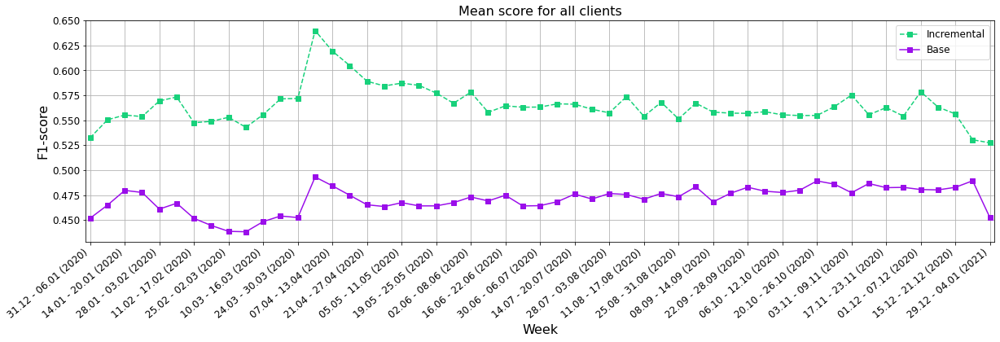

In [45]:
plt.rcParams['figure.figsize'] = 20, 5

days_test = pd.date_range('2019-01-01','2022-08-08')
days_test = np.array(days_test).reshape(-1,7).astype('datetime64[D]')
a0 = pd.Series(days_test[:,0][52:105]).dt.strftime('%d.%m')
a1 = pd.Series(days_test[:,-1][52:105]).dt.strftime('%d.%m (%Y)')

plt.plot(a0+' - '+a1, np.mean(inc_with_metric_3in1,0)[52:105],
         's--',c='xkcd:seaweed',label='Incremental')
plt.plot(a0+' - '+a1, np.mean(base_with_metric_3in1,0)[52:105],
         's-',c='xkcd:violet',label='Base')

plt.xticks((a0+' - '+a1)[::2], rotation=40, ha='right')
plt.grid()
plt.legend()
plt.margins(x=0.005)

plt.xlabel('Week')
plt.ylabel('F1-score')
plt.title('Mean score for all clients');

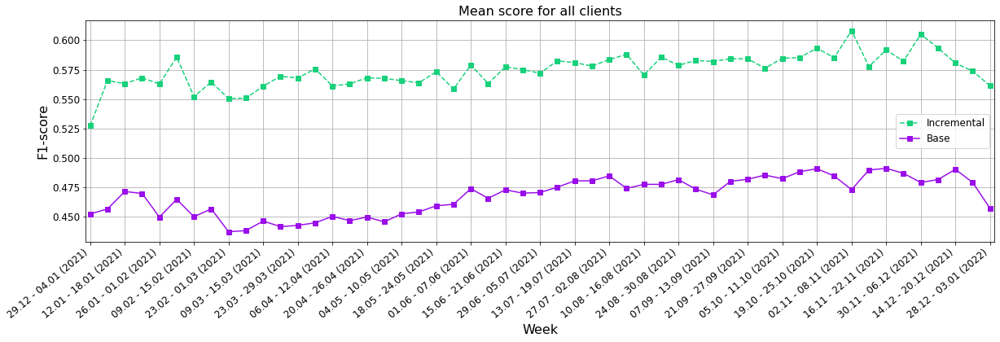

In [53]:
plt.rcParams['figure.figsize'] = 20, 5

days_test = pd.date_range('2019-01-01','2022-08-08')
days_test = np.array(days_test).reshape(-1,7).astype('datetime64[D]')
a0 = pd.Series(days_test[:,0][104:157]).dt.strftime('%d.%m')
a1 = pd.Series(days_test[:,-1][104:157]).dt.strftime('%d.%m (%Y)')

plt.plot(a0+' - '+a1, np.mean(inc_with_metric_3in1,0)[104:157],
         's--',c='xkcd:seaweed',label='Incremental')
plt.plot(a0+' - '+a1, np.mean(base_with_metric_3in1,0)[104:157],
         's-',c='xkcd:violet',label='Base')

plt.xticks((a0+' - '+a1)[::2], rotation=40, ha='right')
plt.grid()
plt.legend()
plt.margins(x=0.005)

plt.xlabel('Week')
plt.ylabel('F1-score')
plt.title('Mean score for all clients');

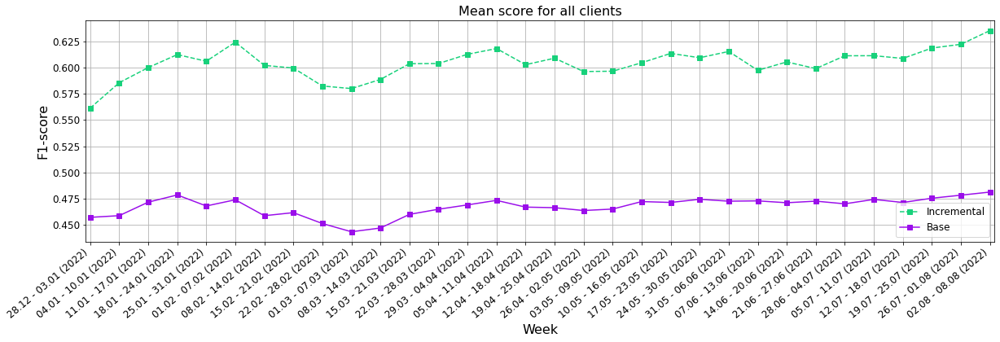

In [59]:
plt.rcParams['figure.figsize'] = 20, 5

days_test = pd.date_range('2019-01-01','2022-08-08')
days_test = np.array(days_test).reshape(-1,7).astype('datetime64[D]')
a0 = pd.Series(days_test[:,0][156:]).dt.strftime('%d.%m')
a1 = pd.Series(days_test[:,-1][156:]).dt.strftime('%d.%m (%Y)')

plt.plot(a0+' - '+a1, np.mean(inc_with_metric_3in1,0)[156:],
         's--',c='xkcd:seaweed',label='Incremental')
plt.plot(a0+' - '+a1, np.mean(base_with_metric_3in1,0)[156:],
         's-',c='xkcd:violet',label='Base')

plt.xticks((a0+' - '+a1)[::1], rotation=40, ha='right')
plt.grid()
plt.legend()
plt.margins(x=0.005)

plt.xlabel('Week')
plt.ylabel('F1-score')
plt.title('Mean score for all clients');

In [9]:
np.mean(np.mean(inc_with_metric_3in1[:,:65],0) - np.mean(base_with_metric_3in1[:,:65],0))

0.06857313276467887

In [10]:
np.mean(np.mean(inc_with_metric_3in1[:,65:164],0) - np.mean(base_with_metric_3in1[:,65:164],0))

0.10316509524875998

In [11]:
np.mean(np.mean(inc_with_metric_3in1[:,164:],0) - np.mean(base_with_metric_3in1[:,164:],0))

0.13813069379298928

In [7]:
np.mean(inc_with_metric_3in1[:,-1],0) - np.mean(base_with_metric_3in1[:,-1],0)

0.15391814585883123

In [13]:
from scipy.stats import pearsonr, spearmanr
pearsonr(np.mean(base_with_metric_3in1,0),np.mean(inc_with_metric_3in1,0))[0]

-0.021204402622550307

In [14]:
spearmanr(np.mean(base_with_metric_3in1,0),np.mean(inc_with_metric_3in1,0))[0]

-0.07310364506860126

### Внутренняя предсказуемость

алг. Хаффмана

In [397]:
import queue

class Node:
    def __init__(self, x, k=-1, l=None, r=None, c=''):
        self.freq = x
        self.key = k
        self.left = l
        self.right = r
        self.code = c
    def __lt__(self, otr):
        return self.freq < otr.freq

def huffman_code(data):
    freqTable={}
    nodeList=[]
    que=queue.PriorityQueue()
    codeTable={}
    
    # frequent label init
    for n in data:
        if n in freqTable:
            freqTable[n]+=1
        else:
            freqTable[n]=1
    
    # Huffman tree init
    for k,v in freqTable.items():
        nodeList.append(Node(v,k))
        que.put(nodeList[-1])
        
    # Huffman tree generate
    while que.qsize()>1:
        n1=que.get()
        n2=que.get()
        n1.code='1'
        n2.code='0'
        nn=Node(n1.freq+n2.freq,l=n1,r=n2);
        nodeList.append(nn);
        que.put(nodeList[-1])

    # get Huffman code
    def bl(p,codestr=[]):
        codestr.append(p.code)
        if p.left:
            bl(p.left,codestr.copy())
            bl(p.right,codestr.copy())
        else:
            codeTable[p.key]=''.join(codestr)
    bl(nodeList[-1])
    
    # print Huffman code result
    # print(str(codeTable))
    
    return codeTable

алг. Лемпеля-Зива

In [398]:
def LempelZiv(S):
    n=len(S)
    i=0
    C=u=v=vmax=1
    while (u+v)<n:
        if S[i+v] == S[u+v]:
            v+=1
        else:
            vmax = max(v, vmax)
            i+=1
            v=1
            if i==u:
                C+=1
                u+=vmax
                i=0
                vmax=v
            else:
                v=1
    if v!=1:
        C+=1
    return C

In [399]:
dates = pd.date_range('2018-01-01','2022-08-15')

In [405]:
fdf = feat_df

df_all = pd.DataFrame(index=fdf.index,data=0,columns=['huff'])

for client in tqdm(fdf.index):
    df = pd.DataFrame(dates)
    df[['self','soc','sur']] = feat_df.loc[client][:,:3].astype(int)
    df['code'] = df.iloc[:,1:].apply(lambda x: int(format(x.sur, '01b')+
                                                   format(x.soc, '01b')+
                                                   format(x.self, '01b'),2), 
                                     axis=1)
    res = dict()

    for day_n in range(0,952,7):
        textus = df['code'][730-28+day_n:730-28+day_n+35].values
        table=huffman_code(textus)
        code=''
        for i in textus:
            code+=table[i]
        res[day_n] = len(code)/len(textus)/3
        
    df_all.loc[client,'huff'] = [[np.array(list(res.values()))]]

  0%|          | 0/3000 [00:00<?, ?it/s]

In [406]:
plt.rcParams['figure.figsize'] = 25, 5
r1 = np.array([np.vstack(x) for x in df_all.to_numpy().reshape(-1)],dtype=object).reshape(fdf.index.shape[0],136)

plt.plot(a0+'-'+a1, np.mean(r1,0))
plt.margins(x=0.005)
plt.xticks(rotation=70, ha='right')
plt.grid();

NameError: name 'a0' is not defined

In [ ]:
df_lz = pd.DataFrame(index=fdf.index,data=0,columns=['lz'])
df_lz['lz'] = df_lz['lz'].astype('object')
n = 4000
for client in tqdm(fdf.index):
    df = pd.DataFrame(dates)
    df[['self','soc','sur']] = feat_df.loc[client][:,:3].astype(int)
    df['code'] = df.iloc[:,1:].apply(lambda x: int(format(x.sur, '01b')+
                                                   format(x.soc, '01b')+
                                                   format(x.self, '01b'),2), 
                                     axis=1)
    res = dict()

    for day_n in range(0,952,7):
        textus = ''.join(df['code'][730-28+day_n:730-28+day_n+35].apply(lambda x: format(x, '03b')).values)
    
        res[day_n] = LempelZiv(textus)
        
    df_lz.loc[client,'lz'] = np.array(list(res.values()))

In [ ]:
r2 = np.array([np.vstack(x) for x in df_lz.iloc[:n].to_numpy().reshape(-1)],dtype=object).reshape(fdf.index.shape[0],136)
r2.shape

plt.plot(a0+'-'+a1, np.mean(r2,0))
plt.margins(x=0.005)
plt.xticks(rotation=70, ha='right')
plt.grid();

In [366]:
r2.shape

(2995, 136)

In [368]:
inc_with_metric_3in1.shape

(2995, 136)

In [399]:
r1[:,:].reshape(-1).shape

(407320,)

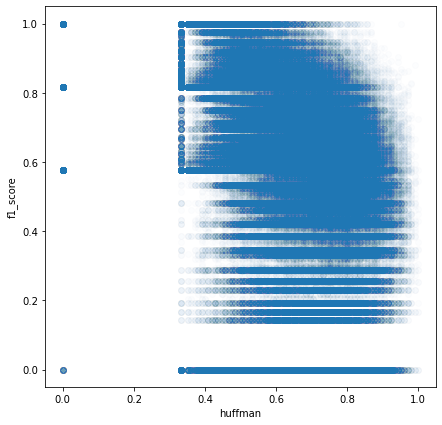

In [407]:
plt.scatter(r1[:,:].reshape(-1),inc_with_metric_3in1[:,:].reshape(-1),alpha=0.01)
plt.xlabel('huffman')
plt.ylabel('f1_score');

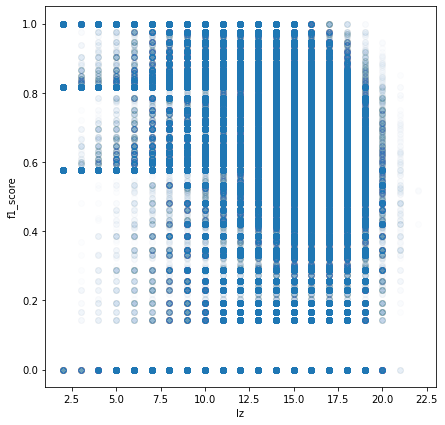

In [408]:
plt.scatter(r2[:,:].reshape(-1),inc_with_metric_3in1[:,:].reshape(-1),alpha=0.01)
plt.xlabel('lz')
plt.ylabel('f1_score');

# Предсказания на мезо- (группы клиентов) и макро- (все клиенты) уровнях 

## Разделение клиентов по группам предсказуемости

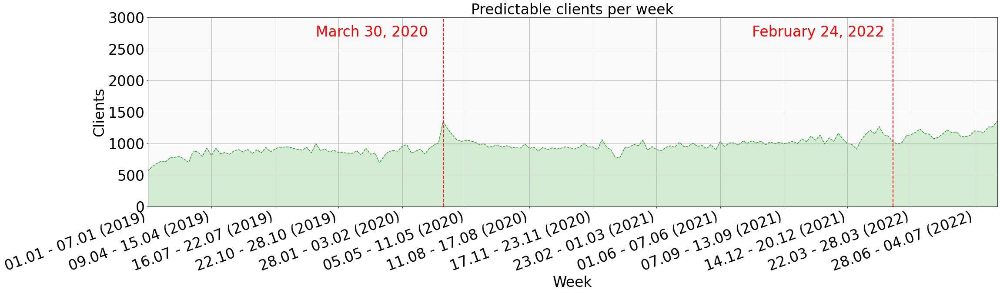

In [30]:
plt.rcParams['figure.figsize'] = 35, 8
# Посчитаем кол-во хорошо-предсказуемых клиентов для каждой тестовой недели
threshold = 0.7
# если метрика на опр. неделю выше порога -- ставим 1.
bool_clients = np.array([[int(x_week>threshold) for x_week in user] for user in inc_with_metric_3in1])

plt.plot((a0+' - '+a1), bool_clients.sum(0),'--',color=cmap.colors[2])
plt.fill_between((a0+' - '+a1),bool_clients.sum(0), 0, color=cmap.colors[2], alpha=0.2)
plt.fill_between((a0+' - '+a1),3000, bool_clients.sum(0), color='gray', alpha=0.04)

plt.ylim(0,3000)
plt.margins(x=0)

plt.axvline(65, ls='--', lw=2, color='red')
plt.text(67-30,2700,'March 30, 2020',c='red')
plt.axvline(164, ls='--', lw=2, color='red')
plt.text(166-33,2700,'February 24, 2022',c='red')

plt.xticks((a0+' - '+a1)[::14], rotation=20, ha='right')

plt.title('Predictable clients per week')
plt.grid()
plt.ylabel('Clients')
plt.xlabel('Week');

In [31]:
# Берем данные с реальными id
df_real_id = pd.read_pickle('1822_real_id_bin_money.pkl')
df_real_id.head()

,bin_trans,money_trans
2005,"[[0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0,...","[[0, 8145, 0, 0, 0, 0, 0, 0, 0, 251, 0, 0, 632..."
2213,"[[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 66, 0, 0, 0, 0, 0, 0..."
3427,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
5044,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1810,..."
5112,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


### Переходы между неделями (Sankey)

In [17]:
def between_weeks(from_week,to_week):
    good_clients_idx = np.where(bool_clients[:,from_week]==1)
    bad_clients_idx = np.where(bool_clients[:,from_week]==0)

    good_clients_idx2 = np.where(bool_clients[:,to_week]==1)
    bad_clients_idx2 = np.where(bool_clients[:,to_week]==0)

    good_good = np.intersect1d(good_clients_idx, good_clients_idx2).shape[0]
    good_bad = np.intersect1d(good_clients_idx, bad_clients_idx2).shape[0]
    bad_bad = np.intersect1d(bad_clients_idx, bad_clients_idx2).shape[0]
    bad_good = np.intersect1d(bad_clients_idx, good_clients_idx2).shape[0]

    return good_good,good_bad,bad_bad,bad_good

In [18]:
import plotly.io as pio
pio.renderers.default = 'iframe'

In [19]:
import plotly.graph_objects as go

In [20]:
n_weeks = 188

In [21]:
a1[0].split(' ')

['07.01', '(2019)']

In [22]:
values = []
for i in range(n_weeks-1):
    values.extend(between_weeks(i,i+1))

targets = []
for i in range(2,n_weeks*2-1,2):
    targets.extend([i,i+1,i+1,i])

fig = go.Figure(data=[go.Sankey(
    orientation='h',
    arrangement ="freeform",
    node = dict(
       
      pad = 5,
      thickness = 2,
      line = dict(color = "black", width = 0.3),
      label = [f"{group}<br>{(a0+'<br>-<br>'+a1)[i]}" if i%2==0 else '' for i in range(n_weeks) for group in ['good','bad']], # ["good_0", "bad_0", "good_1", "bad_1",],
      color = ["rgba(122, 204, 155, 0.6)",'rgba(173,173,173, 0.5)']*n_weeks
      #x = np.repeat(np.linspace(0.001,0.999,25),2),  # не работает!    
      
    ),
    
    link = dict(
      source = [i for i in range(n_weeks*2-2) for _ in range(2)], # [0,0,1,1, 2,2,3,3, ...]
      target = targets, # [2,3,3,2, 4,5,5,4, ...]
      value = values,
      color = ["rgba(122, 204, 155, 0.3)","rgba(122, 204, 155, 0.3)",
               'rgba(173,173,173, 0.3)','rgba(173,173,173, 0.3)']*n_weeks
  ))])

fig.update_layout(title_text="Basic Sankey Diagram", 
                  font_size=9, autosize=False,width=7500, height=500,margin=dict(l=20, r=150, t=20,b=50))
fig.show()

In [23]:
jumps=[]

for i in range(3000):
    jumps.append(np.where(bool_clients[i,:-1] != bool_clients[i,1:])[0].shape[0])

# кол-во клиентов без переходов
np.where(np.array(jumps)==0)[0].shape

(0,)

In [24]:
# id "постоянных" клиентов
np.where(np.array(jumps)==0)[0]

array([], dtype=int64)

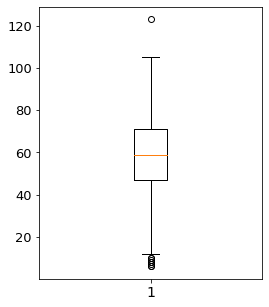

In [25]:
plt.rcParams['figure.figsize'] = 4, 5

# в среднем 17 переходов у всех
plt.boxplot(pd.Series(jumps));

In [57]:
np.median(jumps)

59.0

### Возвращаемся

In [32]:
#14: понедельник, 1 апреля 2019 — воскресенье, 7 апреля 2019
#40: понедельник, 30 сентября 2019 — воскресенье, 6 октября 2019

nth_week=39

good_clients_id, good_rw, \
bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)

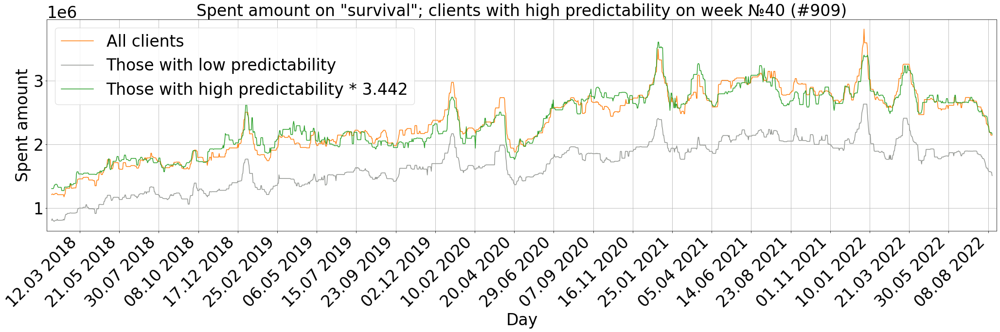

In [33]:
# Посмотрим на суммы разных групп клиентов
dates = pd.Series(pd.date_range('2018-01-01','2022-08-15')).dt.strftime('%d.%m %Y')
fig = plt.figure(figsize=(35, 8))

plt.plot(dates, all_rw, '-', c=cmap.colors[1], label='All clients')
#plt.plot(dates, good_rw, '-', c='xkcd:seaweed',label=f'Хорошо предсказумые')
plt.plot(dates, bad_rw, '-', c='xkcd:gray',label='Those with low predictability')
coeff_good = all_rw.mean()/good_rw.mean()
plt.plot(dates, good_rw*coeff_good, '-',c=cmap.colors[2],label=f'Those with high predictability * {coeff_good:.3f}',lw=1.5)

plt.title(f'Spent amount on "survival"; clients with high predictability on week №{nth_week+1} (#{good_clients_id.shape[0]})')
plt.xlabel('Day')
plt.ylabel('Spent amount')

plt.grid()
plt.xticks(dates[::70], rotation=45, ha='right')
plt.margins(x=0.005)
plt.legend();

### Разделение на компоненты

In [12]:
dates = pd.date_range('01-01-2018','08-15-2022')
dates

DatetimeIndex(['2018-01-01', '2018-01-02', '2018-01-03', '2018-01-04',
               '2018-01-05', '2018-01-06', '2018-01-07', '2018-01-08',
               '2018-01-09', '2018-01-10',
               ...
               '2022-08-06', '2022-08-07', '2022-08-08', '2022-08-09',
               '2022-08-10', '2022-08-11', '2022-08-12', '2022-08-13',
               '2022-08-14', '2022-08-15'],
              dtype='datetime64[ns]', length=1688, freq='D')

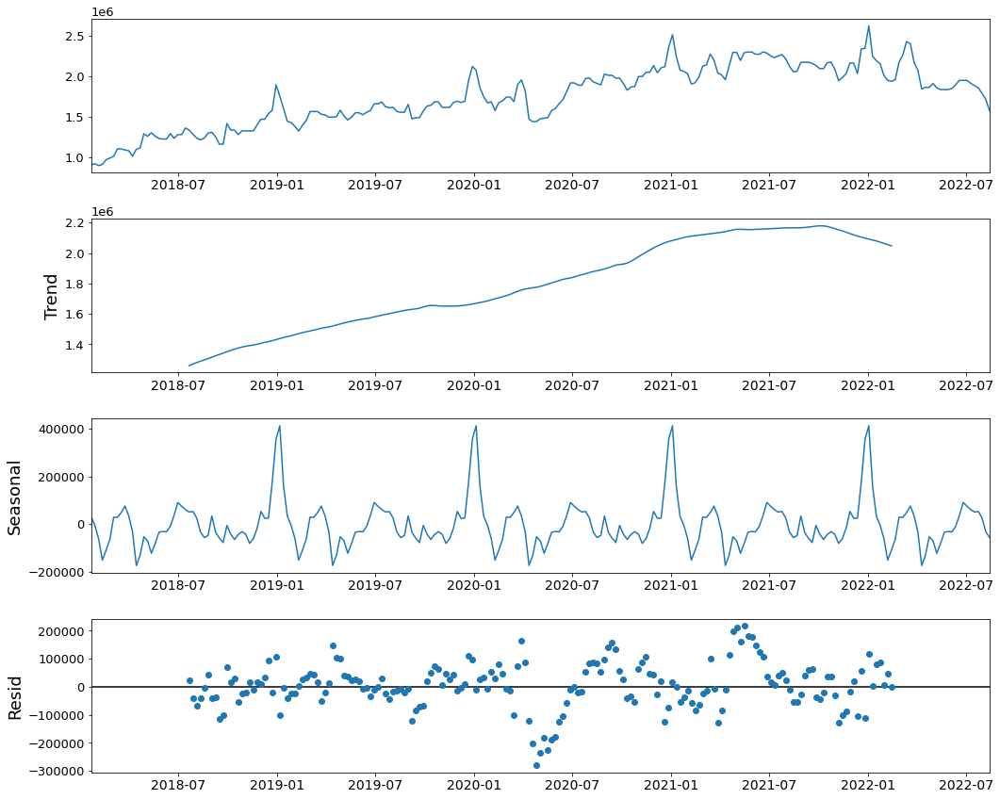

In [113]:
from statsmodels.tsa.seasonal import seasonal_decompose
plt.rcParams['figure.figsize'] = 15,12

#bad_with_date = bad_rw[730:] 
bad_with_date = bad_rw[bad_rw.first_valid_index():]
#bad_with_date.index = dates[730:]
bad_with_date.index = dates[bad_rw.first_valid_index():]

bad_res = seasonal_decompose(bad_with_date.asfreq('W'), model='additive')
bad_res.plot()
plt.show()

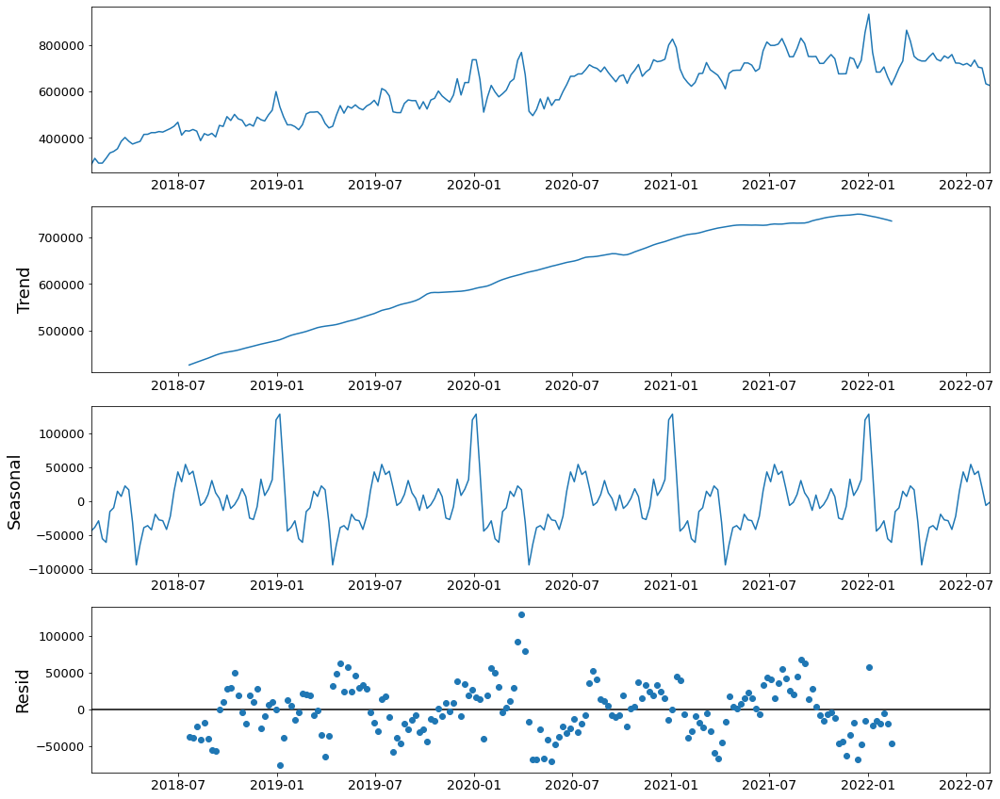

In [74]:
good_with_date = good_rw[good_rw.first_valid_index():]
good_with_date.index = dates[good_rw.first_valid_index():]

good_res = seasonal_decompose(good_with_date.asfreq('W'), model='additive')
good_res.plot()
plt.show()

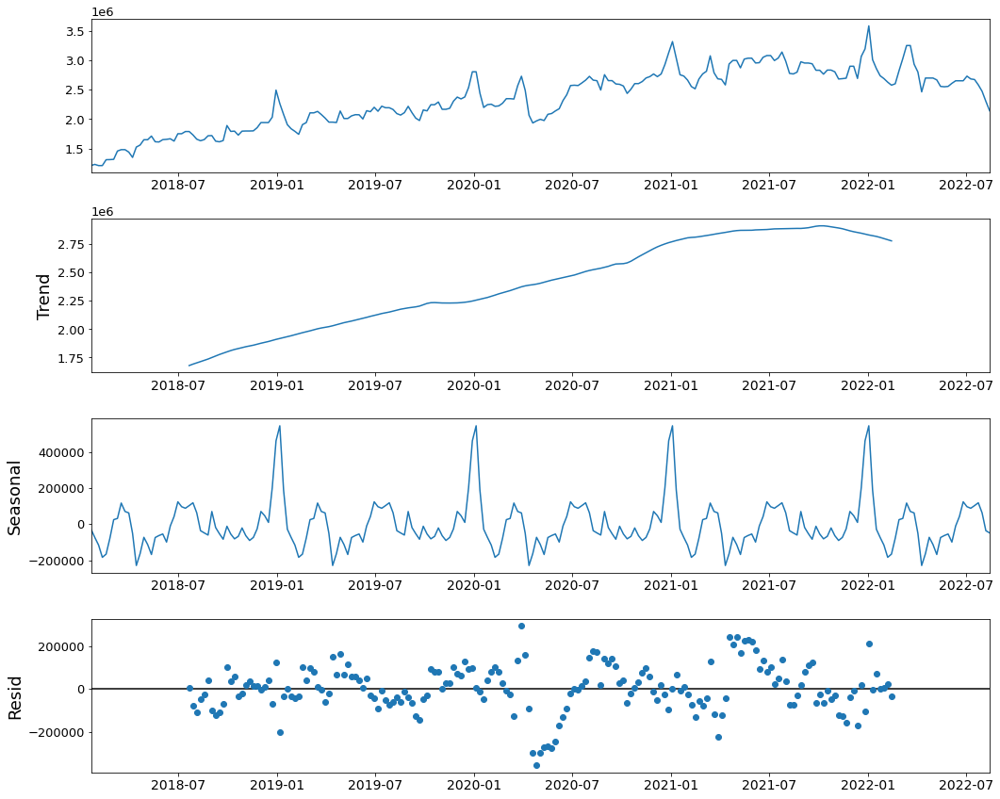

In [75]:
all_with_date = all_rw[all_rw.first_valid_index():]
all_with_date.index = dates[all_rw.first_valid_index():]

all_res = seasonal_decompose(all_with_date.asfreq('W'), model='additive')
all_res.plot()
plt.show()

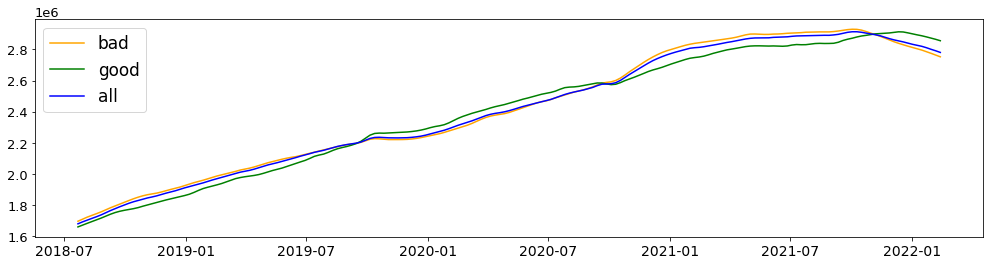

In [89]:
plt.rcParams['figure.figsize'] = 17,4
coeff_good = all_rw.mean()/good_rw.mean()
coeff_bad = all_rw.mean()/bad_rw.mean()

plt.plot(bad_res.trend * coeff_bad, label='bad', c='orange')
plt.plot(good_res.trend * coeff_good, label='good', c='green')
plt.plot(all_res.trend, label='all', c='blue')

plt.legend();

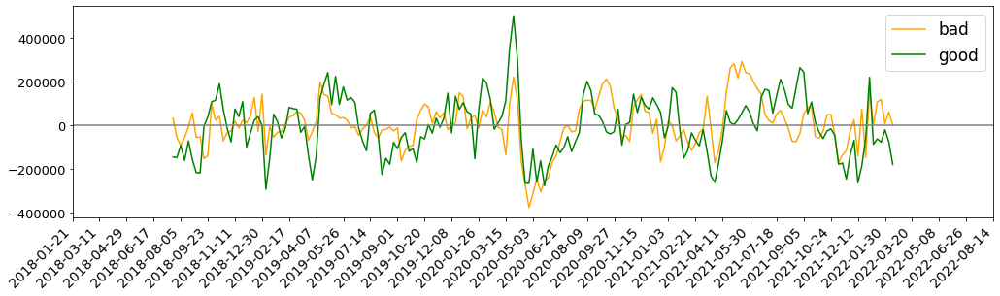

In [117]:
plt.rcParams['figure.figsize'] = 17,4
plt.plot(bad_res.resid * coeff_bad, label='bad', c='orange')
plt.plot(good_res.resid * coeff_good, label='good', c='green')
#plt.plot(all_res.resid, label='all', c='blue')

plt.xticks(good_with_date.asfreq('W').index[::7],rotation=45,ha='right')
plt.axhline(0.,c='gray',ls='-')
plt.legend();

In [133]:
from scipy.stats import entropy
'''Kolmogorov-Sinai Entropy'''
def KSEntr(data):
    l=len(data)
    e=[]
    for i in range(1,l//2+1):
        b=l//i
        hist,bins=np.histogram(data, bins=b)
        e.append(entropy(hist/l,  base=2)) #9/III-2021
    return max(e)

In [134]:
KSEntr(good_res.resid[26:-26])

6.3996078637308145

In [135]:
KSEntr(bad_res.resid[26:-26])

6.161087227719436

In [136]:
KSEntr(all_res.resid[26:-26])

6.306234302933706

### Графики по классам предсказуемости (базовые ценности и интересы)

In [55]:
from sklearn.preprocessing import MinMaxScaler


In [56]:
def get_datasets_from_week(nth_week):
    good_clients_id, good_rw, \
    bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)

    bad_clients_idx = np.where(bool_clients[:,nth_week]==0)
    bad_clients_id_upto8k = pd.Series(df_2models.index).iloc[bad_clients_idx].values
    bad_clients_id = pd.Series(df_real_id.index).iloc[bad_clients_id_upto8k].values

    bad_df = df[df.client.isin(bad_clients_id)]
    good_df = df[df.client.isin(good_clients_id)]
    
    # не будем учитывать категорию деньги
    good_df = good_df[good_df['value'].isin(['survival','socialization','self_realization'])]
    good_df_grouped = good_df.sort_values(by = 'date').groupby(['date','value'])['amt'].sum().reset_index(name='amt')

    bad_df = bad_df[bad_df['value'].isin(['survival','socialization','self_realization'])]
    bad_df_grouped = bad_df.sort_values(by = 'date').groupby(['date','value'])['amt'].sum().reset_index(name='amt')

    all_df = df[df['value'].isin(['survival','socialization','self_realization'])]
    all_df_grouped = all_df.sort_values(by = 'date').groupby(['date','value'])['amt'].sum().reset_index(name='amt')
    
    return good_df_grouped, bad_df_grouped, all_df_grouped

In [60]:
good_val = good_df_grouped[good_df_grouped.value=='survival']['amt'].iloc[730:]
bad_val = bad_df_grouped[bad_df_grouped.value=='survival']['amt'].iloc[730:]
all_val = all_df_grouped[all_df_grouped.value=='survival']['amt'].iloc[730:]
    
good_val

2192    162357
2195    396357
2198    448082
2201    440203
2204    414342
         ...  
5051    498607
5054    759394
5057    125284
5060     29312
5063      5179
Name: amt, Length: 958, dtype: int32

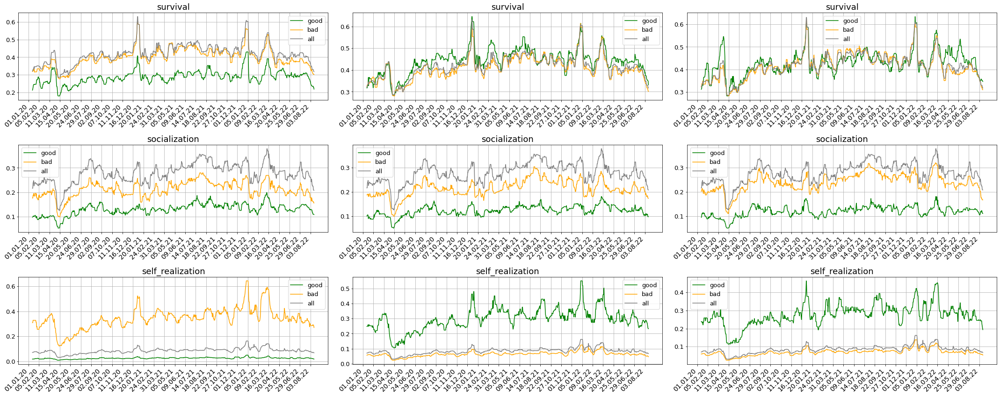

In [57]:
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=14)    # fontsize of the tick labels
plt.rc('ytick', labelsize=13)    # fontsize of the tick labels
plt.rc('legend', fontsize=13)    # legend fontsize
plt.rc('figure', titlesize=MEDIUM_SIZE) 

plt.rcParams['figure.figsize'] = 30,12
fig, ax = plt.subplots(3, 3)
window = 14
tick_freq = 35

def plot_value(value, ax, ax_x, ax_y, window, tick_freq, good_df_grouped, bad_df_grouped, all_df_grouped):
    
    good_val = good_df_grouped[good_df_grouped.value==value]['amt'].iloc[730:]
    bad_val = bad_df_grouped[bad_df_grouped.value==value]['amt'].iloc[730:]
    all_val = all_df_grouped[all_df_grouped.value==value]['amt'].iloc[730:]
    
    scaler_g = MinMaxScaler()
    res_good = scaler_g.fit_transform(good_val.to_numpy().reshape(-1, 1))
    ax[ax_x, ax_y].plot(dates[730:], pd.Series(res_good.reshape(-1)).rolling(window=window).median(), 
                        label='good',c='green')
    scaler_b = MinMaxScaler()
    res_bad = scaler_b.fit_transform(bad_val.to_numpy().reshape(-1, 1))
    ax[ax_x, ax_y].plot(dates[730:], pd.Series(res_bad.reshape(-1)).rolling(window=window).median(), 
                        label='bad',c='orange')
    scaler_a = MinMaxScaler()
    res_all = scaler_a.fit_transform(all_val.to_numpy().reshape(-1, 1))
    ax[ax_x, ax_y].plot(dates[730:], pd.Series(res_all.reshape(-1)).rolling(window=window).median(), 
                        label='all',c='gray')
    
    ax[ax_x, ax_y].set_xticks(dates[730::tick_freq])
    ax[ax_x, ax_y].set_xticklabels(dates[730::tick_freq],rotation=45,ha='right')
    ax[ax_x, ax_y].set_title(value)
    ax[ax_x, ax_y].grid()
    ax[ax_x, ax_y].legend()

    
weeks = [13,39,51]
for col in range(3):
    good_df_grouped, bad_df_grouped, all_df_grouped = get_datasets_from_week(weeks[col])
    
    plot_value('survival', ax, 0, col, window, tick_freq, good_df_grouped, bad_df_grouped, all_df_grouped)
    plot_value('socialization', ax, 1, col, window, tick_freq, good_df_grouped, bad_df_grouped, all_df_grouped)
    plot_value('self_realization', ax, 2, col, window, tick_freq, good_df_grouped, bad_df_grouped, all_df_grouped)
    
fig.tight_layout();

In [41]:
def get_datasets_from_week_group(nth_week, groups):
    good_clients_id, good_rw, \
    bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)

    bad_clients_idx = np.where(bool_clients[:,nth_week]==0)
    bad_clients_id_upto8k = pd.Series(df_2models.index).iloc[bad_clients_idx].values
    bad_clients_id = pd.Series(df_real_id.index).iloc[bad_clients_id_upto8k].values

    bad_df = df[df.client.isin(bad_clients_id)]
    good_df = df[df.client.isin(good_clients_id)]
    
    # не будем учитывать категорию деньги
    good_df_g = good_df[good_df['group'].isin(groups)]
    good_df_grouped_g = good_df_g.sort_values(by = 'date').groupby(['date','group'])['amt'].sum().reset_index(name='amt')

    bad_df_g = bad_df[bad_df['group'].isin(groups)]
    bad_df_grouped_g = bad_df_g.sort_values(by = 'date').groupby(['date','group'])['amt'].sum().reset_index(name='amt')

    all_df_g = df[df['group'].isin(groups)]
    all_df_grouped_g = all_df_g.sort_values(by = 'date').groupby(['date','group'])['amt'].sum().reset_index(name='amt')
    
    return good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g

In [126]:
def fill_missing_dates(client_class):
    missing_dates = list(set(client_class.date) ^ set(dates_new[730:]))
    
    if missing_dates:
        to_add = pd.DataFrame({'date': missing_dates,
                           'group': ['outfit']*len(missing_dates),
                           'amt': [0]*len(missing_dates)})
        return pd.concat([client_class, to_add], ignore_index=True).sort_values(by = 'date')['amt']
    
    else:
        return client_class['amt']

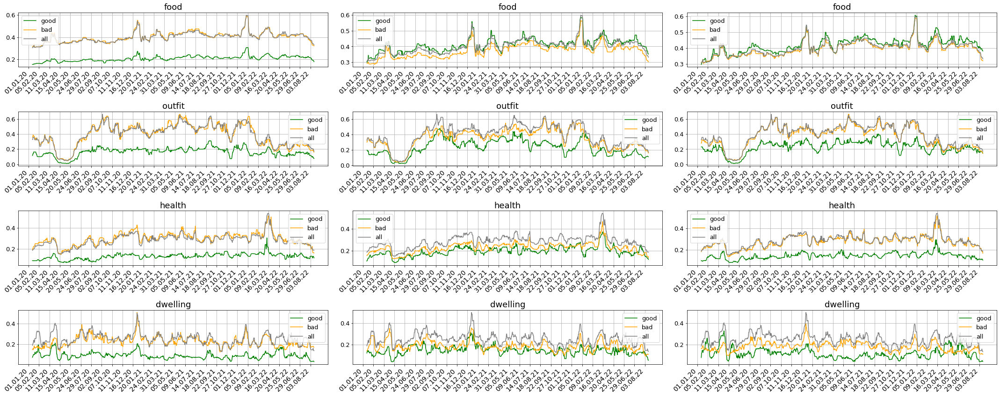

In [137]:
plt.rcParams['figure.figsize'] = 30,12
fig, ax = plt.subplots(4, 3)
window = 14
tick_freq = 35
dates_new = pd.Series(pd.date_range(df.date.min(),df.date.max())).dt.strftime('%Y-%m-%d')

def plot_group(group, ax, ax_x, ax_y, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g):
    
    good_g = good_df_grouped_g[good_df_grouped_g.group==group].iloc[730:]
    bad_g = bad_df_grouped_g[bad_df_grouped_g.group==group].iloc[730:]
    all_g = all_df_grouped_g[all_df_grouped_g.group==group].iloc[730:]
    
    
    good_g = fill_missing_dates(good_g)
    bad_g = fill_missing_dates(bad_g)
    all_g = fill_missing_dates(all_g)
    
    scaler_g = MinMaxScaler()
    res_good = scaler_g.fit_transform(good_g.to_numpy().reshape(-1, 1))
    ax[ax_x, ax_y].plot(dates[730:], pd.Series(res_good.reshape(-1)).rolling(window=window).median(), 
                        label='good',c='green')
    scaler_b = MinMaxScaler()
    res_bad = scaler_b.fit_transform(bad_g.to_numpy().reshape(-1, 1))
    ax[ax_x, ax_y].plot(dates[730:], pd.Series(res_bad.reshape(-1)).rolling(window=window).median(), 
                        label='bad',c='orange')
    scaler_a = MinMaxScaler()
    res_all = scaler_a.fit_transform(all_g.to_numpy().reshape(-1, 1))
    ax[ax_x, ax_y].plot(dates[730:], pd.Series(res_all.reshape(-1)).rolling(window=window).median(), 
                        label='all',c='gray')
    
    ax[ax_x, ax_y].set_xticks(dates[730::tick_freq])
    ax[ax_x, ax_y].set_xticklabels(dates[730::tick_freq],rotation=45,ha='right')
    ax[ax_x, ax_y].set_title(group)
    ax[ax_x, ax_y].grid()
    ax[ax_x, ax_y].legend()

    
weeks = [13,39,51]
for col in range(3):
    groups = ['food','outfit','health','dwelling']
    good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g = get_datasets_from_week_group(weeks[col], groups)
    
    plot_group('food', ax, 0, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('outfit', ax, 1, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('health', ax, 2, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('dwelling', ax, 3, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)  

fig.tight_layout();

array(['food', 'travel', 'fun', 'nonfood', 'outfit', 'health', 'kids',
       'telecom', 'misc', 'dwelling', 'beauty', 'remote', 'charity'],
      dtype=object)

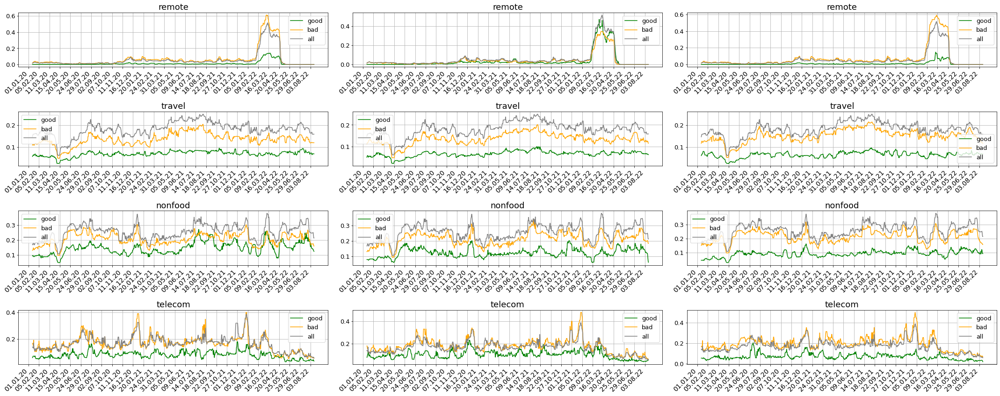

In [140]:
plt.rcParams['figure.figsize'] = 30,12
fig, ax = plt.subplots(4, 3)
window = 14
tick_freq = 35

weeks = [13,39,51]
for col in range(3):
    groups = ['remote','travel','nonfood','telecom']
    good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g = get_datasets_from_week_group(weeks[col], groups)
    
    plot_group('remote', ax, 0, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('travel', ax, 1, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('nonfood', ax, 2, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('telecom', ax, 3, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)  

fig.tight_layout();

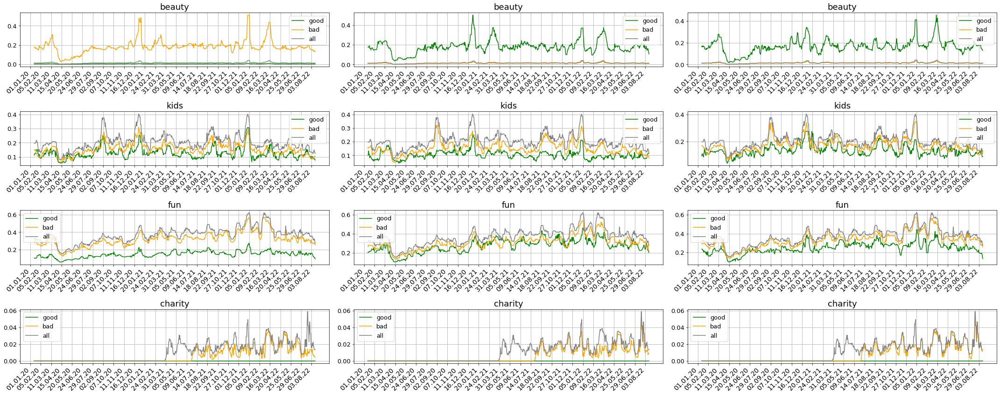

In [142]:
plt.rcParams['figure.figsize'] = 30,12
fig, ax = plt.subplots(4, 3)
window = 14
tick_freq = 35

weeks = [13,39,51]
for col in range(3):
    groups = ['beauty','kids','fun','charity']
    good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g = get_datasets_from_week_group(weeks[col], groups)
    
    plot_group('beauty', ax, 0, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('kids', ax, 1, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('fun', ax, 2, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)
    plot_group('charity', ax, 3, col, window, tick_freq, good_df_grouped_g, bad_df_grouped_g, all_df_grouped_g)  

fig.tight_layout();

In [143]:
df.group.unique()

array(['food', 'travel', 'fun', 'nonfood', 'outfit', 'health', 'kids',
       'telecom', 'misc', 'dwelling', 'beauty', 'remote', 'charity'],
      dtype=object)

## Предсказания

Инкрементально предсказываются 7 дней от последнего дня недели, у которой считали хороших клиентов.

### Задаем нужные параметры

In [34]:
good_clients_id, good_rw, \
bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,0,window_size=21)

In [35]:
days_test2 = pd.date_range('2020-01-01','2022-08-09')
days_test2 = np.array(days_test2).reshape(-1,7).astype('datetime64[D]')

a0_md = pd.Series(days_test2[:,0]).dt.strftime('%m.%d')
a1_md = pd.Series(days_test2[:,-1]).dt.strftime('%m.%d')

a0_dm = pd.Series(days_test2[:,0]).dt.strftime('%d.%m.%Y')
a1_dm = pd.Series(days_test2[:,-1]).dt.strftime('%d.%m.%Y')

In [36]:
# Задаем гиперпараметры модели
n_epochs_each_model = 20
n_batch_each_model = 1
lr_each_model = 0.000005
n_neurons_each_model = 60

days = pd.date_range('2018.01.01',f'2022.08.15')
days = pd.Series(days).dt.strftime('%d.%m.%Y')
last_day = days[days==f'{a1_dm[0]}'].index[0]
shift_days = good_rw.first_valid_index() # при скользящей медиане сдвинулись 
n_weeks=136

# Параметры для моделей
dim=28 #размерность вложения
mem=5 #глубина памяти для LSTM
split= days.shape[0]-last_day-1 #Разбиение ряда для обучения\прогноза (от конца)
fwd = 7 # На сколько дней предсказываем на тестовой

# для воспроизводимости рез-в
the_chosen_seed = 1108

reset_seeds(seed_value = the_chosen_seed)

In [21]:
font_size = 20
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=font_size)          # controls default text sizes
plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
plt.rc('axes', labelsize=font_size)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('legend', fontsize=font_size)    # legend fontsize
plt.rc('figure', titlesize=font_size)  # fontsize of the figure title

### Хорошо предсказуемые

0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

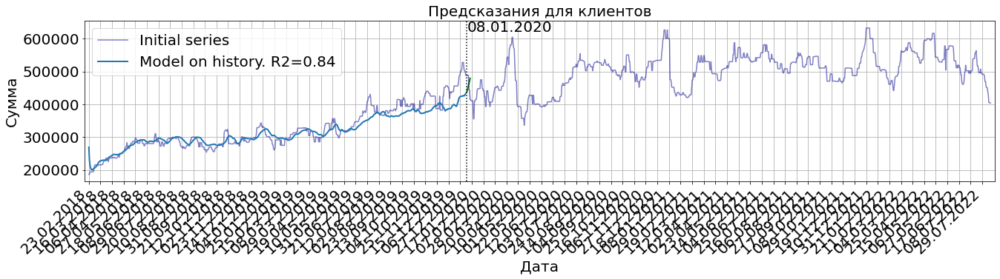

In [33]:
# Найдем клиентов в группах предсказуемости на заданной неделе
nth_week = 0
good_clients_id, good_rw, bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)
# предобработка
scaler, x, y, dat = macro_help_functions.prepare_data(good_rw.iloc[shift_days:], split, dim, mem)
# обучаем модель
model, fwd_mapes, full_fwd_pred_tr, \
    full_fwd_true, y_pred_tr, y_true = macro_model_functions.make_model(scaler, x, y, dat, good_rw.iloc[shift_days:],
                                                                        dim, mem, split, fwd, \
                                                                        n_epochs_each_model, n_batch_each_model,
                                                                        n_neurons_each_model,lr_each_model)
# смотрим, как хорошо подстроилась под обучающую выборку
plt.rcParams['figure.figsize'] = 22, 4
r = macro_help_functions.plot_clients_pred(good_rw.iloc[shift_days:], full_fwd_pred_tr,full_fwd_true,y_true,y_pred_tr,
        dim, mem, split, fwd, days, tick_freq=21,shift_days=shift_days)
plt.margins(x=0.005)

In [94]:
days.iloc[-split]

'08.01.2020'

  0%|          | 0/134 [00:00<?, ?it/s]

test MAPE median: 6.482%
test MAPE HP: 39.259%


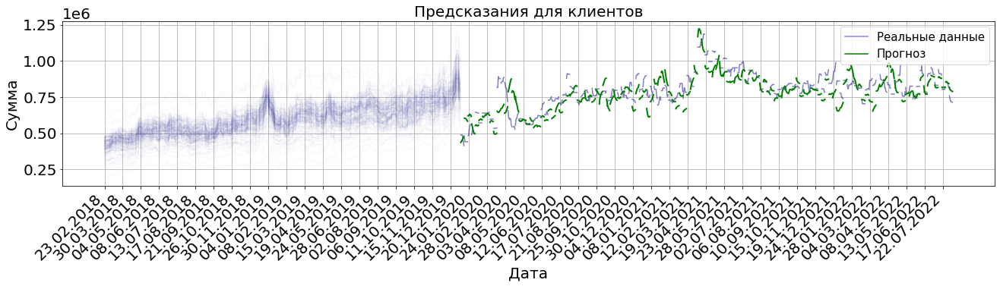

In [34]:
next_fwd_mapes = fwd_mapes.copy()
next_full_fwd_pred_tr = full_fwd_pred_tr.copy()
next_full_fwd_true = full_fwd_true.copy()

# Для каждой недели
for nth_week in trange(1,n_weeks-1):
    # ищем группы клиентов
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)
    # считаем день, с которого начинаем предсказывать
    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    # Предсказываем (без обучения)
    next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(next_good_rw.iloc[shift_days:], next_split, dim, mem, 0)
    next_fwd_mapes, next_full_fwd_pred_tr, next_full_fwd_true = macro_model_functions.make_pred_base_model(model, next_scaler, next_dat, next_good_rw,
                            dim, mem, next_split, fwd,
                            next_fwd_mapes, next_full_fwd_pred_tr, next_full_fwd_true)

# смотрим на результаты на тестовой выборке    
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes)<=0.05)[0].shape[0] / np.array(next_fwd_mapes).shape[0]) * 100 :.3f}%')    
r = macro_help_functions.plot_clients_pred_base('good',a1_dm,df_2models,df_real_id,bool_clients,
                                                next_full_fwd_pred_tr, next_full_fwd_true,split,
                                                dim, mem, fwd, days, tick_freq=35,n_weeks=n_weeks,shift_days=shift_days)

line1 = Line2D([0], [0], label='Реальные данные', color='blue', alpha=0.5)
line2 = Line2D([0], [0], label='Прогноз', color='green')
plt.legend(handles=[line1, line2], loc='upper right', fontsize=15);

In [35]:

model.save("exp_data/good/model_good.h5")

np.save('exp_data/good/next_fwd_mapes', np.array(next_fwd_mapes))
np.save('exp_data/good/next_full_fwd_pred_tr', np.array(next_full_fwd_pred_tr))
np.save('exp_data/good/next_full_fwd_true', np.array(next_full_fwd_true))


In [4]:
from tensorflow.keras.models import load_model

model = load_model('exp_data/good/model_good.h5')
next_fwd_mapes = np.load('exp_data/good/next_fwd_mapes.npy')
next_full_fwd_pred_tr = np.load('exp_data/good/next_full_fwd_pred_tr.npy')
next_full_fwd_true = np.load('exp_data/good/next_full_fwd_true.npy')

print(f'test MAPE median: {np.median(np.array(next_fwd_mapes)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes)<=0.05)[0].shape[0] / np.array(next_fwd_mapes).shape[0]) * 100 :.3f}%') 

test MAPE median: 6.482%
test MAPE HP: 39.259%


HP(Hit Probability): процент ошибок меньше заданного интервала

#### Выделяя группы только 1 раз.

In [24]:
good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,13,window_size=21)
print(good_clients_id.shape)
good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,39,window_size=21)
print(good_clients_id.shape)
good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,51,window_size=21)
print(good_clients_id.shape)

(926,)
(909,)
(696,)


0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

week №13
test MAPE median: 9.259%
test MAPE HP: 25.926%


0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

week №51
test MAPE median: 6.609%
test MAPE HP: 38.519%


0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

week №39
test MAPE median: 5.518%
test MAPE HP: 42.963%


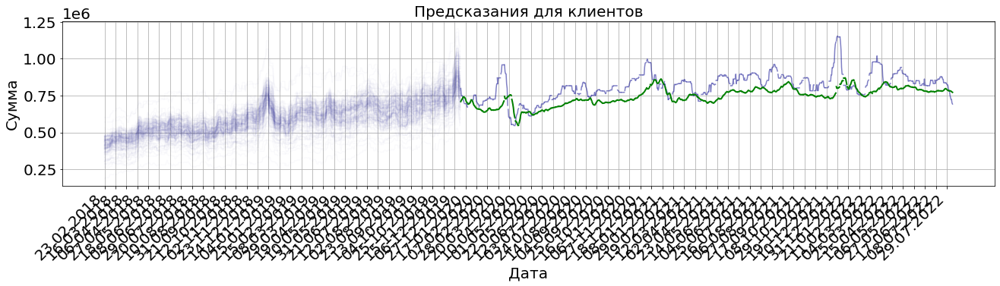

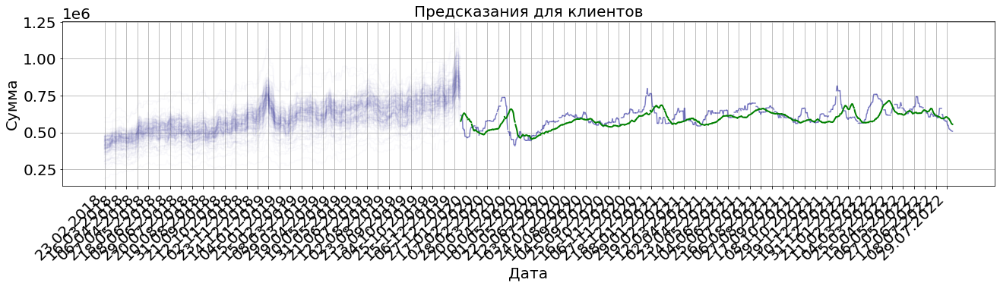

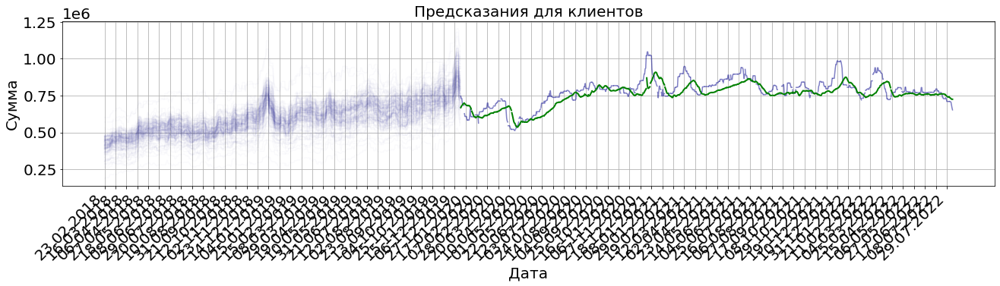

In [39]:
plt.rcParams['figure.figsize'] = 22, 4
for_weeks_next_fwd_mapes_1t = []
for_weeks_next_full_fwd_pred_tr_1t = []
for_weeks_next_full_fwd_true_1t = []
models_14_52_40 = []

nth_week = 0
# для каждой заданной недели
for week_to_test in [13,51,39]:
    reset_seeds(seed_value = the_chosen_seed)
    
    good_clients_id, good_rw, bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,week_to_test,window_size=21)

    scaler, x, y, dat = macro_help_functions.prepare_data(good_rw.iloc[shift_days:], split, dim, mem)

    model_temp, fwd_mapes_temp, full_fwd_pred_tr_temp, \
        full_fwd_true_temp, y_pred_tr, y_true = macro_model_functions.make_model(scaler, x, y, dat, good_rw.iloc[shift_days:],
                                                                            dim, mem, split, fwd, \
                                                                            n_epochs_each_model, n_batch_each_model,
                                                                            n_neurons_each_model,lr_each_model) 
    next_fwd_mapes_1t = fwd_mapes_temp.copy()
    next_full_fwd_pred_tr_1t = full_fwd_pred_tr_temp.copy()
    next_full_fwd_true_1t = full_fwd_true_temp.copy()

    # Для каждой тестовой недели
    for nth_week in trange(1,n_weeks-1):
        # считаем день, с которого начинаем предсказывать
        last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
        next_split= days.shape[0]-last_day-1

        # Предсказываем (без обучения)
        next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(good_rw.iloc[shift_days:], next_split, dim, mem, 0)
        next_fwd_mapes_1t, next_full_fwd_pred_tr_1t, next_full_fwd_true_1t = macro_model_functions.make_pred_base_model(model_temp, next_scaler, next_dat, good_rw,
                                dim, mem, next_split, fwd,
                                next_fwd_mapes_1t, next_full_fwd_pred_tr_1t, next_full_fwd_true_1t)
    # запомним рез-ты
    for_weeks_next_fwd_mapes_1t.append(next_fwd_mapes_1t)
    for_weeks_next_full_fwd_pred_tr_1t.append(next_full_fwd_pred_tr_1t)
    for_weeks_next_full_fwd_true_1t.append(next_full_fwd_true_1t)
    models_14_52_40.append(model_temp)
        
    r = macro_help_functions.plot_clients_pred_base('good',a1_dm,df_2models,df_real_id,bool_clients,
                                                next_full_fwd_pred_tr_1t, next_full_fwd_true_1t,split,
                                                dim, mem, fwd, days, tick_freq=21, n_weeks=n_weeks,shift_days=shift_days)
    print(f'week №{week_to_test}')
    print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_1t)) *100 :.3f}%')
    print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_1t)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_1t).shape[0]) * 100 :.3f}%')
    
# запишем рез-ты в переменные для отд.недель
next_fwd_mapes_1t14, next_fwd_mapes_1t52, next_fwd_mapes_1t = for_weeks_next_fwd_mapes_1t
next_full_fwd_pred_tr_1t14, next_full_fwd_pred_tr_1t52, next_full_fwd_pred_tr_1t = for_weeks_next_full_fwd_pred_tr_1t
next_full_fwd_true_1t14, next_full_fwd_true_1t52, next_full_fwd_true_1t = for_weeks_next_full_fwd_true_1t
model_14, model_52, model_40 = models_14_52_40

In [40]:
# SAVING

model_14.save("exp_data/good/model_14.h5")
model_52.save("exp_data/good/model_52.h5")
model_40.save("exp_data/good/model_40.h5")

np.save('exp_data/good/next_fwd_mapes_1t14', np.array(next_fwd_mapes_1t14))
np.save('exp_data/good/next_fwd_mapes_1t52', np.array(next_fwd_mapes_1t52))
np.save('exp_data/good/next_fwd_mapes_1t', np.array(next_fwd_mapes_1t))

np.save('exp_data/good/next_full_fwd_pred_tr_1t14', np.array(next_full_fwd_pred_tr_1t14))
np.save('exp_data/good/next_full_fwd_pred_tr_1t52', np.array(next_full_fwd_pred_tr_1t52))
np.save('exp_data/good/next_full_fwd_pred_tr_1t', np.array(next_full_fwd_pred_tr_1t))

np.save('exp_data/good/next_full_fwd_true_1t14', np.array(next_full_fwd_true_1t14))
np.save('exp_data/good/next_full_fwd_true_1t52', np.array(next_full_fwd_true_1t52))
np.save('exp_data/good/next_full_fwd_true_1t', np.array(next_full_fwd_true_1t))


In [5]:
# LOADING
model_14 = load_model('exp_data/good/model_14.h5')
model_52 = load_model('exp_data/good/model_52.h5')
model_40 = load_model('exp_data/good/model_40.h5')

next_fwd_mapes_1t14 = np.load('exp_data/good/next_fwd_mapes_1t14.npy')
next_fwd_mapes_1t52 = np.load('exp_data/good/next_fwd_mapes_1t52.npy')
next_fwd_mapes_1t = np.load('exp_data/good/next_fwd_mapes_1t.npy')

next_full_fwd_pred_tr_1t14 = np.load('exp_data/good/next_full_fwd_pred_tr_1t14.npy')
next_full_fwd_pred_tr_1t52 = np.load('exp_data/good/next_full_fwd_pred_tr_1t52.npy')
next_full_fwd_pred_tr_1t = np.load('exp_data/good/next_full_fwd_pred_tr_1t.npy')

next_full_fwd_true_1t14 = np.load('exp_data/good/next_full_fwd_true_1t14.npy')
next_full_fwd_true_1t52 = np.load('exp_data/good/next_full_fwd_true_1t52.npy')
next_full_fwd_true_1t = np.load('exp_data/good/next_full_fwd_true_1t.npy')

print(f'week №14')
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_1t14)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_1t14)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_1t14).shape[0]) * 100 :.3f}%')
print(f'week №52')    
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_1t52)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_1t52)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_1t52).shape[0]) * 100 :.3f}%')
print(f'week №40')
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_1t)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_1t)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_1t).shape[0]) * 100 :.3f}%')

week №14
test MAPE median: 9.259%
test MAPE HP: 25.926%
week №52
test MAPE median: 6.609%
test MAPE HP: 38.519%
week №40
test MAPE median: 5.518%
test MAPE HP: 42.963%


#### random clients of the same size

In [28]:
good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,
                                                                                                      39,window_size=21)
good_clients_id.shape

(909,)

In [29]:
r_clients = df_real_id.sample(good_clients_id.shape[0], random_state=42)['money_trans'].squeeze().to_list()
random_rw = pd.Series(np.array(r_clients).sum(0)[2,:]).rolling(window=21).median()

scaler_rand, x_rand, y_rand, dat_rand = macro_help_functions.prepare_data(random_rw.iloc[shift_days:], split, dim, mem)

model_rand, fwd_mapes_rand, full_fwd_pred_tr_rand, \
    full_fwd_true_rand, y_pred_tr_rand, y_true_rand = macro_model_functions.make_model(scaler_rand, x_rand, y_rand, dat_rand, random_rw.iloc[shift_days:],
                                                                        dim, mem, split, fwd, \
                                                                        n_epochs_each_model, n_batch_each_model,
                                                                        n_neurons_each_model,lr_each_model)   

0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

In [30]:
next_fwd_mapes_rand = fwd_mapes_rand.copy()
next_full_fwd_pred_tr_rand = full_fwd_pred_tr_rand.copy()
next_full_fwd_true_rand = full_fwd_true_rand.copy()
n_weeks=136

for nth_week in trange(1,n_weeks-1):
    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(random_rw.iloc[shift_days:], next_split, dim, mem, 0)
    
    next_fwd_mapes_rand, next_full_fwd_pred_tr_rand, next_full_fwd_true_rand = macro_model_functions.make_pred_base_model(model_rand, 
                                                                               scaler_rand, dat_rand, 
                            random_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            next_fwd_mapes_rand, next_full_fwd_pred_tr_rand, next_full_fwd_true_rand)

  0%|          | 0/134 [00:00<?, ?it/s]

In [31]:
def plot_clients_pred_base2(a1_dm,df_2models,df_real_id,bool_clients,
                           full_fwd_pred_tr,full_fwd_true,split,
                            dim, mem, fwd, days, tick_freq, n_weeks):

    fig = plt.figure()
        
    for nth_week in range(n_weeks-1):
        client_group = random_rw
        
        last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
        next_split= days.shape[0]-last_day-1
        yt= client_group[20+mem+dim:-next_split].values.reshape(-1)
        
        # Реальные данные
        plt.plot(client_group[20+mem+dim:-split].values.reshape(-1), c='darkblue', alpha=.02)
        
        ticks=days[20+mem+dim:]
        xt=np.arange(0, len(ticks), tick_freq)
        
        # На тестовой
        t=np.arange(len(yt), len(yt)+fwd)
        plt.plot(t, full_fwd_true[nth_week], c='darkblue', alpha=.5, label=None)
        plt.plot(t, full_fwd_pred_tr[nth_week], lw=2, c='green')

        # Граница обучающей и тестовой
        #plt.axvline(len(yt), ls=':', c='k')
        plt.xticks(xt, ticks.iloc[xt], rotation=45, ha='right')
        
    plt.title('Предсказания для клиентов')
    plt.xlabel('Дата')
    plt.ylabel('Сумма')
    plt.grid()
    
    return fig

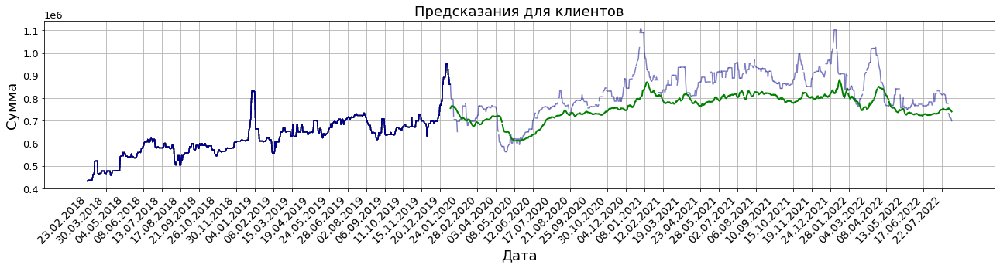

In [32]:
r = plot_clients_pred_base2(a1_dm,df_2models,df_real_id,bool_clients,
                                                next_full_fwd_pred_tr_rand, next_full_fwd_true_rand,split,
                                                dim, mem, fwd, days, tick_freq=35, n_weeks=n_weeks)

In [33]:
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_rand)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_rand)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_rand).shape[0]) * 100 :.3f}%')

test MAPE median: 7.881%
test MAPE HP: 22.222%


### Все клиенты

0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

test MAPE median: 12.835%
test MAPE HP: 18.519%


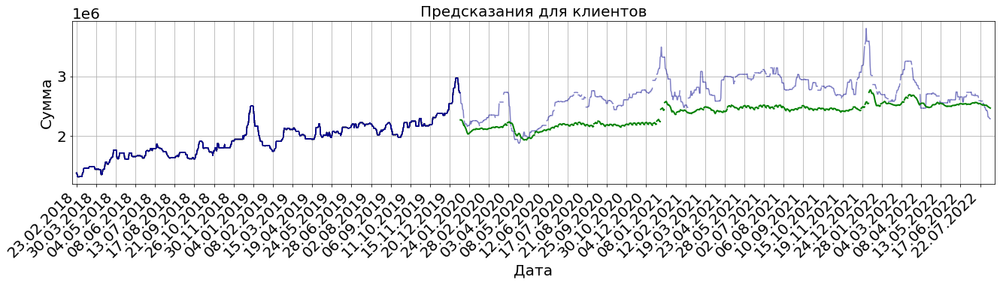

In [42]:
nth_week = 0
good_clients_id, good_rw, bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)
scaler_all, x_all, y_all, dat_all = macro_help_functions.prepare_data(all_rw.iloc[shift_days:], split, dim, mem)

model_all, fwd_mapes_all, full_fwd_pred_tr_all, full_fwd_true_all, \
                    y_pred_tr_all, y_true_all = macro_model_functions.make_model(scaler_all, x_all, y_all, dat_all, all_rw.iloc[shift_days:],
                                                                                dim, mem, split, fwd, \
                                                                                n_epochs_each_model, n_batch_each_model,n_neurons_each_model,lr_each_model)
next_fwd_mapes_all = fwd_mapes_all.copy()
next_full_fwd_pred_tr_all = full_fwd_pred_tr_all.copy()
next_full_fwd_true_all = full_fwd_true_all.copy()

good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,0,window_size=21)

for nth_week in trange(1,n_weeks-1):
    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(next_all_rw.iloc[shift_days:], next_split, dim, mem, 0)
    
    next_fwd_mapes_all, next_full_fwd_pred_tr_all, next_full_fwd_true_all = macro_model_functions.make_pred_base_model(model_all, next_scaler, next_dat, 
                            next_all_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            next_fwd_mapes_all, next_full_fwd_pred_tr_all, next_full_fwd_true_all)

print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_all)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_all)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_all).shape[0]) * 100 :.3f}%')
r = macro_help_functions.plot_clients_pred_base('all',a1_dm,df_2models,df_real_id,bool_clients,
                                                next_full_fwd_pred_tr_all, next_full_fwd_true_all,split,
                                                dim, mem, fwd, days, 35,n_weeks,shift_days)
plt.margins(x=0.005)

In [43]:

model_all.save("exp_data/all/model_all.h5")

np.save('exp_data/all/next_fwd_mapes_all', np.array(next_fwd_mapes_all))
np.save('exp_data/all/next_full_fwd_pred_tr_all', np.array(next_full_fwd_pred_tr_all))
np.save('exp_data/all/next_full_fwd_true_all', np.array(next_full_fwd_true_all))


In [6]:
model_all = load_model('exp_data/all/model_all.h5')
next_fwd_mapes_all = np.load('exp_data/all/next_fwd_mapes_all.npy')
next_full_fwd_pred_tr_all = np.load('exp_data/all/next_full_fwd_pred_tr_all.npy')
next_full_fwd_true_all = np.load('exp_data/all/next_full_fwd_true_all.npy')

print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_all)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_all)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_all).shape[0]) * 100 :.3f}%') 

test MAPE median: 12.835%
test MAPE HP: 18.519%


### Плохо предсказуемые

0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

test MAPE median: 12.342%
test MAPE HP: 14.815%


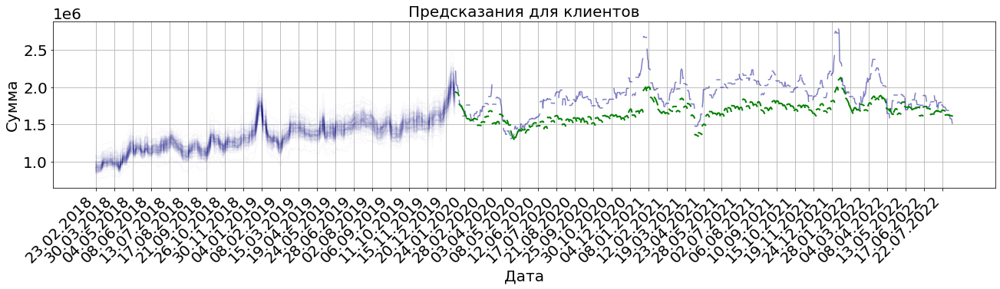

In [45]:
nth_week = 0
good_clients_id, good_rw, bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)
scaler_bad, x_bad, y_bad, dat_bad = macro_help_functions.prepare_data(bad_rw.iloc[shift_days:], split, dim, mem)

model_bad, fwd_mapes_bad, full_fwd_pred_tr_bad, full_fwd_true_bad, \
                    y_pred_tr_bad, y_true_bad = macro_model_functions.make_model(scaler_bad, x_bad, y_bad, dat_bad, bad_rw.iloc[shift_days:],
                                                                                dim, mem, split, fwd, \
                                                                                n_epochs_each_model, n_batch_each_model,n_neurons_each_model,lr_each_model)
next_fwd_mapes_bad = fwd_mapes_bad.copy()
next_full_fwd_pred_tr_bad = full_fwd_pred_tr_bad.copy()
next_full_fwd_true_bad = full_fwd_true_bad.copy()

for nth_week in trange(1,n_weeks-1):
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)

    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(next_bad_rw.iloc[shift_days:], next_split, dim, mem, 0)
    
    next_fwd_mapes_bad, next_full_fwd_pred_tr_bad, next_full_fwd_true_bad = macro_model_functions.make_pred_base_model(model_bad, next_scaler, next_dat, 
                            next_bad_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            next_fwd_mapes_bad, next_full_fwd_pred_tr_bad, next_full_fwd_true_bad)
    
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_bad)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_bad)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_bad).shape[0]) * 100 :.3f}%')
r = macro_help_functions.plot_clients_pred_base('bad',a1_dm,df_2models,df_real_id,bool_clients,
                                                next_full_fwd_pred_tr_bad, next_full_fwd_true_bad,split,
                                                dim, mem, fwd, days, 35, n_weeks,shift_days)

In [46]:

model_bad.save("exp_data/bad/model_bad.h5")

np.save('exp_data/bad/next_fwd_mapes_bad', np.array(next_fwd_mapes_bad))
np.save('exp_data/bad/next_full_fwd_pred_tr_bad', np.array(next_full_fwd_pred_tr_bad))
np.save('exp_data/bad/next_full_fwd_true_bad', np.array(next_full_fwd_true_bad))


In [7]:
model_bad = load_model('exp_data/bad/model_bad.h5')
next_fwd_mapes_bad = np.load('exp_data/bad/next_fwd_mapes_bad.npy')
next_full_fwd_pred_tr_bad = np.load('exp_data/bad/next_full_fwd_pred_tr_bad.npy')
next_full_fwd_true_bad = np.load('exp_data/bad/next_full_fwd_true_bad.npy')

print(f'test MAPE median: {np.median(next_fwd_mapes_bad) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(next_fwd_mapes_bad<=0.05)[0].shape[0] / next_fwd_mapes_bad.shape[0]) * 100 :.3f}%') 

test MAPE median: 12.342%
test MAPE HP: 14.815%


#### Выделяя 1 раз

0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

week №13
test MAPE median: 5.435%
test MAPE HP: 45.926%


0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

week №51
test MAPE median: 12.243%
test MAPE HP: 17.778%


0epoch [00:00, ?epoch/s]

Predict on train data:   0%|          | 0/683 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

week №39
test MAPE median: 9.100%
test MAPE HP: 21.481%


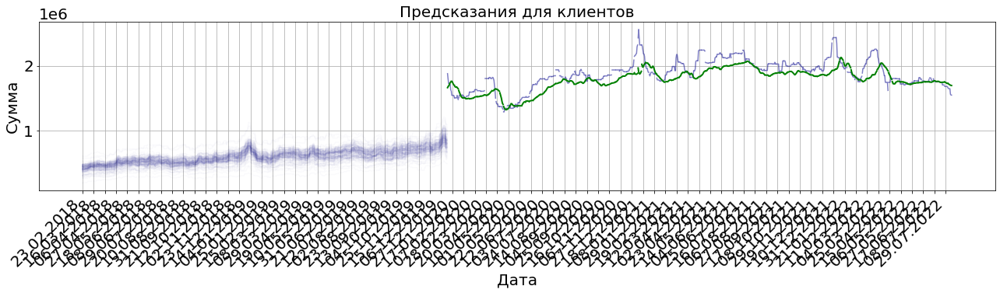

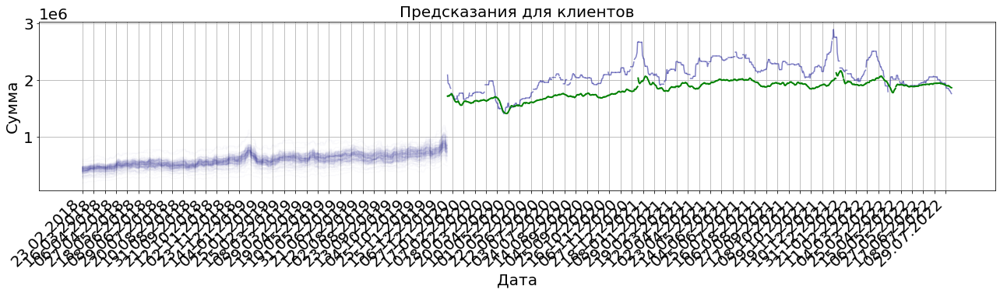

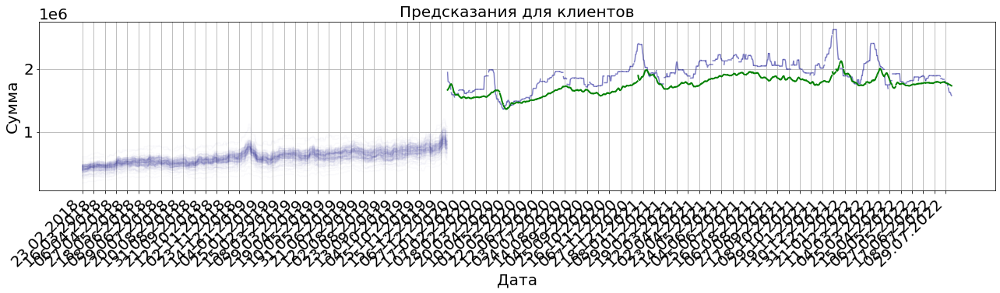

In [48]:
plt.rcParams['figure.figsize'] = 22, 4
for_weeks_next_fwd_mapes_bad_1t = []
for_weeks_next_full_fwd_pred_tr_bad_1t = []
for_weeks_next_full_fwd_true_bad_1t = []
models_bad_14_52_40 = []

# для каждой заданной недели
for week_to_test in [13,51,39]:
    reset_seeds(seed_value = the_chosen_seed)
    
    good_clients_id, good_rw, bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,week_to_test,window_size=21)

    scaler, x, y, dat = macro_help_functions.prepare_data(bad_rw.iloc[shift_days:], split, dim, mem)

    model_bad_temp, fwd_mapes_bad_temp, full_fwd_pred_tr_bad_temp, \
        full_fwd_true_bad_temp, y_pred_tr_bad, y_true_bad = macro_model_functions.make_model(scaler, x, y, dat, bad_rw.iloc[shift_days:],
                                                                        dim, mem, split, fwd, \
                                                                        n_epochs_each_model, n_batch_each_model,
                                                                        n_neurons_each_model,lr_each_model)  
    next_fwd_mapes_bad_1t = fwd_mapes_bad_temp.copy()
    next_full_fwd_pred_tr_bad_1t = full_fwd_pred_tr_bad_temp.copy()
    next_full_fwd_true_bad_1t = full_fwd_true_bad_temp.copy()

    # Для каждой тестовой недели
    for nth_week in trange(1,n_weeks-1):
        # считаем день, с которого начинаем предсказывать
        last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
        next_split= days.shape[0]-last_day-1

        # Предсказываем (без обучения)
        next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(bad_rw.iloc[shift_days:], next_split, dim, mem, 0)
        next_fwd_mapes_bad_1t, next_full_fwd_pred_tr_bad_1t, next_full_fwd_true_bad_1t = macro_model_functions.make_pred_base_model(model_bad_temp, next_scaler, next_dat, 
                            bad_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            next_fwd_mapes_bad_1t, next_full_fwd_pred_tr_bad_1t, next_full_fwd_true_bad_1t)
    # запомним рез-ты
    for_weeks_next_fwd_mapes_bad_1t.append(next_fwd_mapes_bad_1t)
    for_weeks_next_full_fwd_pred_tr_bad_1t.append(next_full_fwd_pred_tr_bad_1t)
    for_weeks_next_full_fwd_true_bad_1t.append(next_full_fwd_true_bad_1t)
    models_bad_14_52_40.append(model_bad_temp)
        
    r = macro_help_functions.plot_clients_pred_base('good',a1_dm,df_2models,df_real_id,bool_clients,
                                                next_full_fwd_pred_tr_bad_1t, next_full_fwd_true_bad_1t,split,
                                                dim, mem, fwd, days, tick_freq=21, n_weeks=n_weeks,shift_days=shift_days)
    print(f'week №{week_to_test}')
    print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_bad_1t)) *100 :.3f}%')
    print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_bad_1t)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_bad_1t).shape[0]) * 100 :.3f}%')
    
# запишем рез-ты в переменные для отд.недель
next_fwd_mapes_bad_1t14, next_fwd_mapes_bad_1t52, next_fwd_mapes_bad_1t = for_weeks_next_fwd_mapes_bad_1t
next_full_fwd_pred_tr_bad_1t14, next_full_fwd_pred_tr_bad_1t52, next_full_fwd_pred_tr_bad_1t = for_weeks_next_full_fwd_pred_tr_bad_1t
next_full_fwd_true_bad_1t14, next_full_fwd_true_bad_1t52, next_full_fwd_true_bad_1t = for_weeks_next_full_fwd_true_bad_1t

model_bad_14, model_bad_52, model_bad_40 = models_bad_14_52_40

In [49]:

model_bad_14.save("exp_data/bad/model_bad_14.h5")
model_bad_52.save("exp_data/bad/model_bad_52.h5")
model_bad_40.save("exp_data/bad/model_bad_40.h5")

np.save('exp_data/bad/next_fwd_mapes_bad_1t14', np.array(next_fwd_mapes_bad_1t14))
np.save('exp_data/bad/next_fwd_mapes_bad_1t52', np.array(next_fwd_mapes_bad_1t52))
np.save('exp_data/bad/next_fwd_mapes_bad_1t', np.array(next_fwd_mapes_bad_1t))

np.save('exp_data/bad/next_full_fwd_pred_tr_bad_1t14', np.array(next_full_fwd_pred_tr_bad_1t14))
np.save('exp_data/bad/next_full_fwd_pred_tr_bad_1t52', np.array(next_full_fwd_pred_tr_bad_1t52))
np.save('exp_data/bad/next_full_fwd_pred_tr_bad_1t', np.array(next_full_fwd_pred_tr_bad_1t))

np.save('exp_data/bad/next_full_fwd_true_bad_1t14', np.array(next_full_fwd_true_bad_1t14))
np.save('exp_data/bad/next_full_fwd_true_bad_1t52', np.array(next_full_fwd_true_bad_1t52))
np.save('exp_data/bad/next_full_fwd_true_bad_1t', np.array(next_full_fwd_true_bad_1t))


In [8]:
# LOADING
model_bad_14 = load_model('exp_data/bad/model_bad_14.h5')
model_bad_52 = load_model('exp_data/bad/model_bad_52.h5')
model_bad_40 = load_model('exp_data/bad/model_bad_40.h5')

next_fwd_mapes_bad_1t14 = np.load('exp_data/bad/next_fwd_mapes_bad_1t14.npy')
next_fwd_mapes_bad_1t52 = np.load('exp_data/bad/next_fwd_mapes_bad_1t52.npy')
next_fwd_mapes_bad_1t = np.load('exp_data/bad/next_fwd_mapes_bad_1t.npy')

next_full_fwd_pred_tr_bad_1t14 = np.load('exp_data/bad/next_full_fwd_pred_tr_bad_1t14.npy')
next_full_fwd_pred_tr_bad_1t52 = np.load('exp_data/bad/next_full_fwd_pred_tr_bad_1t52.npy')
next_full_fwd_pred_tr_bad_1t = np.load('exp_data/bad/next_full_fwd_pred_tr_bad_1t.npy')

next_full_fwd_true_bad_1t14 = np.load('exp_data/bad/next_full_fwd_true_bad_1t14.npy')
next_full_fwd_true_bad_1t52 = np.load('exp_data/bad/next_full_fwd_true_bad_1t52.npy')
next_full_fwd_true_bad_1t = np.load('exp_data/bad/next_full_fwd_true_bad_1t.npy')

print(f'week №14')
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_bad_1t14)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_bad_1t14)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_bad_1t14).shape[0]) * 100 :.3f}%')
print(f'week №52')    
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_bad_1t52)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_bad_1t52)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_bad_1t52).shape[0]) * 100 :.3f}%')
print(f'week №40')
print(f'test MAPE median: {np.median(np.array(next_fwd_mapes_bad_1t)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(next_fwd_mapes_bad_1t)<=0.05)[0].shape[0] / np.array(next_fwd_mapes_bad_1t).shape[0]) * 100 :.3f}%')

week №14
test MAPE median: 5.435%
test MAPE HP: 45.926%
week №52
test MAPE median: 12.243%
test MAPE HP: 17.778%
week №40
test MAPE median: 9.100%
test MAPE HP: 21.481%


### Кол-во хороших клиентов, если выделяем 1 раз

In [36]:
SMALL_SIZE = 16
MEDIUM_SIZE = 18

font_size = 33
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=font_size)          # controls default text sizes
plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
plt.rc('axes', labelsize=font_size)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('legend', fontsize=font_size)    # legend fontsize
plt.rc('figure', titlesize=font_size)  # fontsize of the figure title

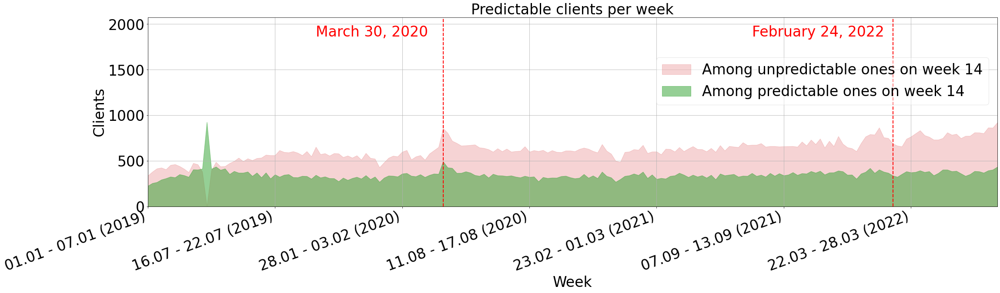

In [37]:
plt.rcParams['figure.figsize'] = 35, 8

bad_clients_on_14 = np.where(bool_clients[:,13]==0)[0]
good_clients_on_14 = np.where(bool_clients[:,13]==1)[0]
good_clients_num = good_clients_on_14.shape[0]
bad_clients_num = bad_clients_on_14.shape[0]

#plt.fill_between((a0+' - '+a1), 0, bad_clients_num, color='gray', alpha=0.04)
plt.fill_between((a0+' - '+a1), bool_clients[bad_clients_on_14,:].sum(0), 0, 
                 color=cmap.colors[3], alpha=0.2, label='Among unpredictable ones on week 14')
plt.fill_between((a0+' - '+a1), bool_clients[good_clients_on_14,:].sum(0), 0, 
                 color=cmap.colors[2], alpha=0.5, label='Among predictable ones on week 14')

plt.axvline(65, ls='--', lw=2, color='red')
plt.text(67-30,bad_clients_num*0.9,'March 30, 2020',c='red')
plt.axvline(164, ls='--', lw=2, color='red')
plt.text(166-33,bad_clients_num*0.9,'February 24, 2022',c='red')

plt.xticks((a0+' - '+a1)[::28], rotation=20, ha='right')
plt.ylim(0,bad_clients_num)
plt.margins(x=0)
plt.grid()

# в каком углу легенды находится точка, указанная в bbox_to_anchor
plt.legend(loc='lower left', bbox_to_anchor=(0.59,0.5), framealpha=0.5)
plt.title('Predictable clients per week')
plt.ylabel('Clients')
plt.xlabel('Week');

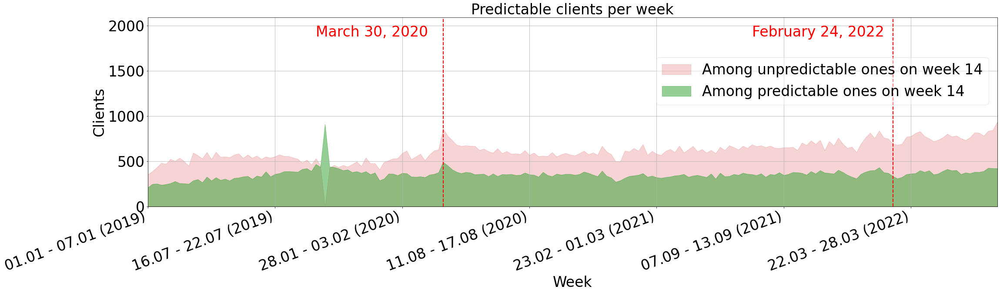

In [38]:
plt.rcParams['figure.figsize'] = 35, 8

bad_clients_on_14 = np.where(bool_clients[:,39]==0)[0]
good_clients_on_14 = np.where(bool_clients[:,39]==1)[0]
good_clients_num = good_clients_on_14.shape[0]
bad_clients_num = bad_clients_on_14.shape[0]

#plt.fill_between((a0+' - '+a1), 0, bad_clients_num, color='gray', alpha=0.04)
plt.fill_between((a0+' - '+a1), bool_clients[bad_clients_on_14,:].sum(0), 0, 
                 color=cmap.colors[3], alpha=0.2, label='Among unpredictable ones on week 14')
plt.fill_between((a0+' - '+a1), bool_clients[good_clients_on_14,:].sum(0), 0, 
                 color=cmap.colors[2], alpha=0.5, label='Among predictable ones on week 14')

plt.axvline(65, ls='--', lw=2, color='red')
plt.text(67-30,bad_clients_num*0.9,'March 30, 2020',c='red')
plt.axvline(164, ls='--', lw=2, color='red')
plt.text(166-33,bad_clients_num*0.9,'February 24, 2022',c='red')

plt.xticks((a0+' - '+a1)[::28], rotation=20, ha='right')
plt.ylim(0,bad_clients_num)
plt.margins(x=0)
plt.grid()

# в каком углу легенды находится точка, указанная в bbox_to_anchor
plt.legend(loc='lower left', bbox_to_anchor=(0.59,0.5), framealpha=0.5)
plt.title('Predictable clients per week')
plt.ylabel('Clients')
plt.xlabel('Week');

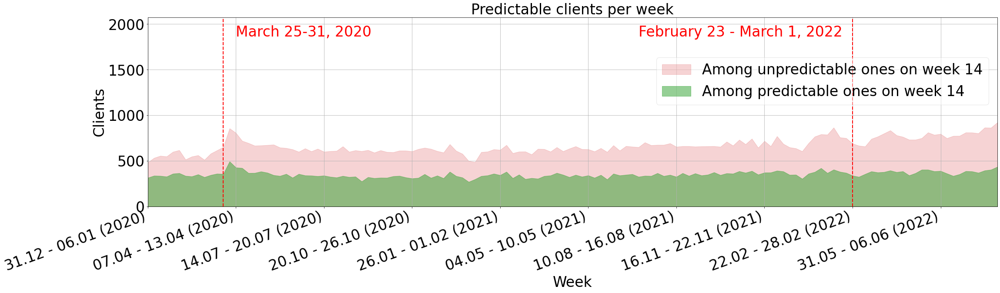

In [23]:
plt.rcParams['figure.figsize'] = 35, 8

bad_clients_on_14 = np.where(bool_clients[:,13]==0)[0]
good_clients_on_14 = np.where(bool_clients[:,13]==1)[0]
good_clients_num = good_clients_on_14.shape[0]
bad_clients_num = bad_clients_on_14.shape[0]

#plt.fill_between((a0[-136:]+' - '+a1[-136:]), 0, bad_clients_num, color='gray', alpha=0.04)
plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[bad_clients_on_14,-136:].sum(0), 0, 
                 color=cmap.colors[3], alpha=0.2, label='Among unpredictable ones on week 14')

#plt.fill_between((a0[-136:]+' - '+a1[-136:]), 0, good_clients_num, color='gray', alpha=0.2)
plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[good_clients_on_14,-136:].sum(0), 0, 
                 color=cmap.colors[2], alpha=0.5, label='Among predictable ones on week 14')

critical_week_1_pos = np.where(days_test2[:,0]==pd.to_datetime('2020-03-25'))[0]
plt.axvline(critical_week_1_pos, ls='--', lw=2, color='red')
plt.text(critical_week_1_pos+2, bad_clients_num*0.9,'March 25-31, 2020',c='red')

critical_week_2_pos = np.where(days_test2[:,0]==pd.to_datetime('2022-02-23'))[0]
plt.axvline(critical_week_2_pos, ls='--', lw=2, color='red')
plt.text(critical_week_2_pos-34, bad_clients_num*0.9,'February 23 - March 1, 2022',c='red')

plt.xticks((a0[-136:]+' - '+a1[-136:])[::14], rotation=20, ha='right')
plt.ylim(0,bad_clients_num)
plt.margins(x=0)
plt.grid()

# в каком углу легенды находится точка, указанная в bbox_to_anchor
plt.legend(loc='lower left', bbox_to_anchor=(0.59,0.5), framealpha=0.5)
plt.title('Predictable clients per week')
plt.ylabel('Clients')
plt.xlabel('Week');

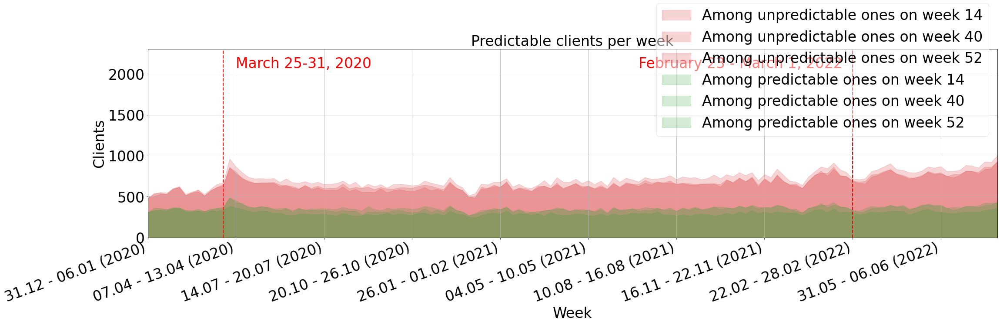

In [233]:
plt.rcParams['figure.figsize'] = 35, 8
hatches = ['o', '++', 'x']

for i,the_week in enumerate([13,39,51]):
    bad_clients_on_week_n = np.where(bool_clients[:,the_week]==0)[0]
    bad_clients_num = bad_clients_on_week_n.shape[0]

    #plt.fill_between((a0[-136:]+' - '+a1[-136:]), 0, bad_clients_num, color='gray', alpha=0.04)
    plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[bad_clients_on_week_n,-136:].sum(0), 0, 
                     color=cmap.colors[3],alpha=0.2,
                     #color='none', edgecolor=cmap.colors[3], hatch=hatches[i],
                     label=f'Among unpredictable ones on week {the_week+1}')

for i,the_week in enumerate([13,39,51]):
    good_clients_on_week_n = np.where(bool_clients[:,the_week]==1)[0]
    good_clients_num = good_clients_on_week_n.shape[0]

    #plt.fill_between((a0[-136:]+' - '+a1[-136:]), 0, good_clients_num, color='gray', alpha=0.2)
    plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[good_clients_on_week_n,-136:].sum(0), 0, 
                     color=cmap.colors[2], alpha=0.2,
                     #color='white', edgecolor=cmap.colors[2], hatch=hatches[i],
                     label=f'Among predictable ones on week {the_week+1}')

    
critical_week_1_pos = np.where(days_test2[:,0]==pd.to_datetime('2020-03-25'))[0]
plt.axvline(critical_week_1_pos, ls='--', lw=2, color='red')
plt.text(critical_week_1_pos+2, bad_clients_num*0.9,'March 25-31, 2020',c='red')

critical_week_2_pos = np.where(days_test2[:,0]==pd.to_datetime('2022-02-23'))[0]
plt.axvline(critical_week_2_pos, ls='--', lw=2, color='red')
plt.text(critical_week_2_pos-34, bad_clients_num*0.9,'February 23 - March 1, 2022',c='red')

plt.xticks((a0[-136:]+' - '+a1[-136:])[::14], rotation=20, ha='right')
plt.ylim(0,bad_clients_num)
plt.margins(x=0)
plt.grid()

# в каком углу легенды находится точка, указанная в bbox_to_anchor
plt.legend(loc='lower left', bbox_to_anchor=(0.59,0.5), framealpha=0.5)
plt.title('Predictable clients per week')
plt.ylabel('Clients')
plt.xlabel('Week');

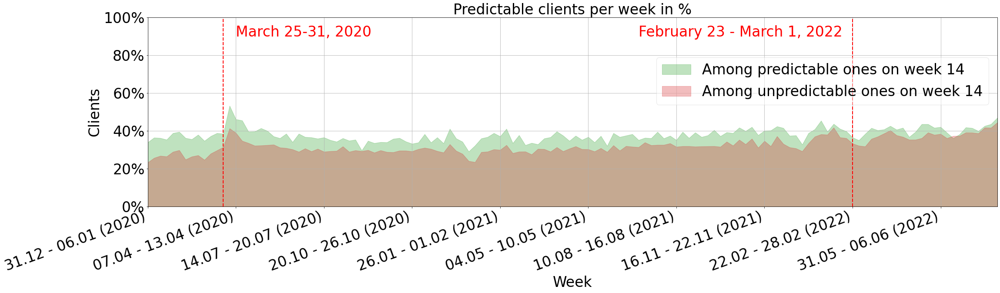

In [232]:
plt.rcParams['figure.figsize'] = 35, 8
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

bad_clients_on_14 = np.where(bool_clients[:,13]==0)[0]
good_clients_on_14 = np.where(bool_clients[:,13]==1)[0]
good_clients_num = good_clients_on_14.shape[0]
bad_clients_num = bad_clients_on_14.shape[0]


#plt.fill_between((a0[-136:]+' - '+a1[-136:]), 0, 1, color='gray', alpha=0.04)


plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[good_clients_on_14,-136:].sum(0)/good_clients_num, 0, 
                 color=cmap.colors[2], alpha=0.3, label='Among predictable ones on week 14')
plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[bad_clients_on_14,-136:].sum(0)/bad_clients_num, 0, 
                 color=cmap.colors[3], alpha=0.3, label='Among unpredictable ones on week 14')

critical_week_1_pos = np.where(days_test2[:,0]==pd.to_datetime('2020-03-25'))[0]
plt.axvline(critical_week_1_pos, ls='--', lw=2, color='red')
plt.text(critical_week_1_pos+2, 0.9,'March 25-31, 2020',c='red')

critical_week_2_pos = np.where(days_test2[:,0]==pd.to_datetime('2022-02-23'))[0]
plt.axvline(critical_week_2_pos, ls='--', lw=2, color='red')
plt.text(critical_week_2_pos-34, 0.9,'February 23 - March 1, 2022',c='red')

plt.xticks((a0[-136:]+' - '+a1[-136:])[::14], rotation=20, ha='right')
plt.ylim(0,1)
plt.margins(x=0)
plt.grid()

# в каком углу легенды находится точка, указанная в bbox_to_anchor
plt.legend(loc='lower left', bbox_to_anchor=(0.59,0.5), framealpha=0.5)
plt.title('Predictable clients per week in %')
plt.ylabel('Clients')
plt.xlabel('Week');

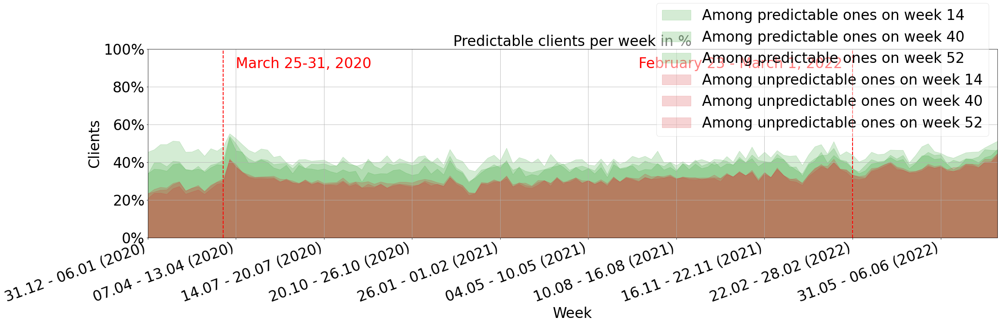

In [235]:
plt.rcParams['figure.figsize'] = 35, 8
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

for i,the_week in enumerate([13,39,51]):
    good_clients_on_week_n = np.where(bool_clients[:,the_week]==1)[0]
    good_clients_num = good_clients_on_week_n.shape[0]

    #plt.fill_between((a0[-136:]+' - '+a1[-136:]), 0, good_clients_num, color='gray', alpha=0.2)
    plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[good_clients_on_week_n,-136:].sum(0)/good_clients_num, 
                     0, color=cmap.colors[2], alpha=0.2,
                     #color='white', edgecolor=cmap.colors[2], hatch=hatches[i],
                     label=f'Among predictable ones on week {the_week+1}')

for i,the_week in enumerate([13,39,51]):
    bad_clients_on_week_n = np.where(bool_clients[:,the_week]==0)[0]
    bad_clients_num = bad_clients_on_week_n.shape[0]

    #plt.fill_between((a0[-136:]+' - '+a1[-136:]), 0, bad_clients_num, color='gray', alpha=0.04)
    plt.fill_between((a0[-136:]+' - '+a1[-136:]), bool_clients[bad_clients_on_week_n,-136:].sum(0)/bad_clients_num, 
                     0, color=cmap.colors[3],alpha=0.2,
                     #color='none', edgecolor=cmap.colors[3], hatch=hatches[i],
                     label=f'Among unpredictable ones on week {the_week+1}')
    
    
critical_week_1_pos = np.where(days_test2[:,0]==pd.to_datetime('2020-03-25'))[0]
plt.axvline(critical_week_1_pos, ls='--', lw=2, color='red')
plt.text(critical_week_1_pos+2, 0.9,'March 25-31, 2020',c='red')

critical_week_2_pos = np.where(days_test2[:,0]==pd.to_datetime('2022-02-23'))[0]
plt.axvline(critical_week_2_pos, ls='--', lw=2, color='red')
plt.text(critical_week_2_pos-34, 0.9,'February 23 - March 1, 2022',c='red')

plt.xticks((a0[-136:]+' - '+a1[-136:])[::14], rotation=20, ha='right')
plt.ylim(0,1)
plt.margins(x=0)
plt.grid()

# в каком углу легенды находится точка, указанная в bbox_to_anchor
plt.legend(loc='lower left', bbox_to_anchor=(0.59,0.5), framealpha=0.5)
plt.title('Predictable clients per week in %')
plt.ylabel('Clients')
plt.xlabel('Week');

### То же, но для инкрементальной

#### Хорошие

In [24]:
reset_seeds(seed_value = the_chosen_seed)

lr_inc = 0.00005
n_ep_inc = 10

in1 = Input(batch_shape = (1, mem, dim))
out = LSTM(n_neurons_each_model, batch_input_shape=(1, mem, dim), 
                    stateful=True, return_sequences=False, activation='relu')(in1)
out = Dropout(0.1)(out)
out = Dense(32, activation='relu')(out)
out = Dropout(0.1)(out)
x = Dense(1, activation='linear')(out)

model_inc = Model(inputs=[in1], outputs=x)
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=lr_inc)
model_inc.compile(loss='mean_squared_error',metrics=['mape'], optimizer=optimizer,  run_eagerly=True)
model_inc.set_weights(model.get_weights())

In [23]:
fwd_mapes,full_fwd_pred_tr,full_fwd_true = [next_fwd_mapes[0]],\
                                            [next_full_fwd_pred_tr[0]],\
                                            [next_full_fwd_true[0]]

  0%|          | 0/134 [00:00<?, ?it/s]

test MAPE median: 5.279%
test MAPE HP: 48.148%


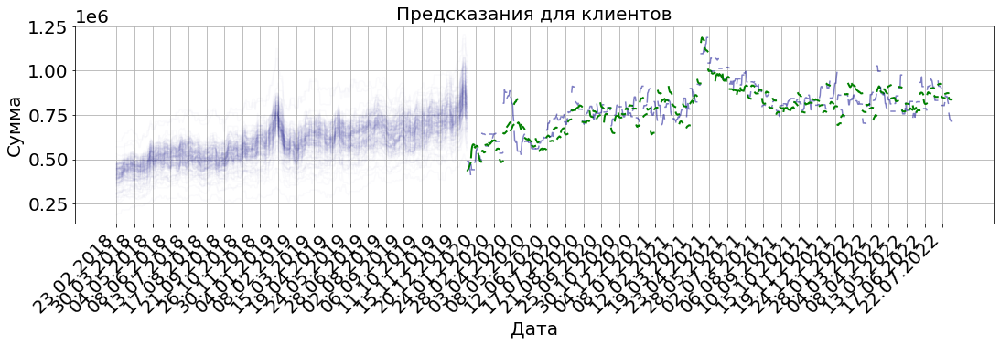

In [53]:
inext_fwd_mapes = fwd_mapes.copy()
inext_full_fwd_pred_tr = full_fwd_pred_tr.copy()
inext_full_fwd_true = full_fwd_true.copy()

for nth_week in trange(1,n_weeks-1):
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)

    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(next_good_rw.iloc[shift_days:], next_split, dim, mem, 0)
    inext_fwd_mapes, inext_full_fwd_pred_tr, inext_full_fwd_true = macro_model_functions.use_inc_model(model_inc, next_scaler, next_dat, next_good_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            inext_fwd_mapes, inext_full_fwd_pred_tr, inext_full_fwd_true,n_ep_inc)
    
plt.rcParams['figure.figsize'] = 18, 4

print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes).shape[0]) * 100 :.3f}%')
r = macro_help_functions.plot_clients_pred_base('good',a1_dm,df_2models,df_real_id,bool_clients,
                                                inext_full_fwd_pred_tr, inext_full_fwd_true,split,
                                                dim, mem, fwd, days, 35, n_weeks,shift_days)

In [54]:

model.save("exp_data/good/model_inc.h5")

np.save('exp_data/good/inext_fwd_mapes', np.array(inext_fwd_mapes))
np.save('exp_data/good/inext_full_fwd_pred_tr', np.array(inext_full_fwd_pred_tr))
np.save('exp_data/good/inext_full_fwd_true', np.array(inext_full_fwd_true))


In [9]:
model_inc = load_model('exp_data/good/model_inc.h5')
inext_fwd_mapes = np.load('exp_data/good/inext_fwd_mapes.npy')
inext_full_fwd_pred_tr = np.load('exp_data/good/inext_full_fwd_pred_tr.npy')
inext_full_fwd_true = np.load('exp_data/good/inext_full_fwd_true.npy')

print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes).shape[0]) * 100 :.3f}%') 

test MAPE median: 5.279%
test MAPE HP: 48.148%


##### выделяя 1 раз

In [56]:
plt.rcParams['figure.figsize'] = 22, 4
for_weeks_inext_fwd_mapes_1t = []
for_weeks_inext_full_fwd_pred_tr_1t = []
for_weeks_inext_full_fwd_true_1t = []
imodels_14_52_40 = []

# для каждой заданной недели
for week_to_test in [13,51,39]:
    reset_seeds(seed_value = the_chosen_seed)
    
    in1 = Input(batch_shape = (1, mem, dim))
    out = LSTM(n_neurons_each_model, batch_input_shape=(1, mem, dim), 
                        stateful=True, return_sequences=False, activation='relu')(in1)
    out = Dropout(0.1)(out)
    out = Dense(32, activation='relu')(out)
    out = Dropout(0.1)(out)
    x = Dense(1, activation='linear')(out)

    model_inc_temp = Model(inputs=[in1], outputs=x)
    optimizer = tensorflow.keras.optimizers.Adam(learning_rate=lr_inc)
    model_inc_temp.compile(loss='mean_squared_error',metrics=['mape'], optimizer=optimizer,  run_eagerly=True)
    model_inc_temp.set_weights(model.get_weights())
    
    good_clients_id, good_rw, bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,week_to_test,window_size=21)
    
    inext_fwd_mapes_1t = fwd_mapes.copy()
    inext_full_fwd_pred_tr_1t = full_fwd_pred_tr.copy()
    inext_full_fwd_true_1t = full_fwd_true.copy()

    # Для каждой тестовой недели
    for nth_week in trange(1,n_weeks-1):
        # считаем день, с которого начинаем предсказывать
        last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
        next_split= days.shape[0]-last_day-1

        # Предсказываем (без обучения)
        next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(good_rw.iloc[shift_days:], next_split, dim, mem, 0)
        inext_fwd_mapes_1t, inext_full_fwd_pred_tr_1t, inext_full_fwd_true_1t = macro_model_functions.use_inc_model(model_inc_temp, next_scaler, next_dat, good_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            inext_fwd_mapes_1t, inext_full_fwd_pred_tr_1t, inext_full_fwd_true_1t,n_ep_inc)
    # запомним рез-ты
    for_weeks_inext_fwd_mapes_1t.append(inext_fwd_mapes_1t)
    for_weeks_inext_full_fwd_pred_tr_1t.append(inext_full_fwd_pred_tr_1t)
    for_weeks_inext_full_fwd_true_1t.append(inext_full_fwd_true_1t)
    imodels_14_52_40.append(model_inc_temp)
    
    print(f'week №{week_to_test}')
    print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_1t)) *100 :.3f}%')
    print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_1t)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_1t).shape[0]) * 100 :.3f}%')
    
# запишем рез-ты в переменные для отд.недель
inext_fwd_mapes_1t14, inext_fwd_mapes_1t52, inext_fwd_mapes_1t = for_weeks_inext_fwd_mapes_1t
inext_full_fwd_pred_tr_1t14, inext_full_fwd_pred_tr_1t52, inext_full_fwd_pred_tr_1t = for_weeks_inext_full_fwd_pred_tr_1t
inext_full_fwd_true_1t14, inext_full_fwd_true_1t52, inext_full_fwd_true_1t = for_weeks_inext_full_fwd_true_1t
imodel_14, imodel_52, imodel_40 = imodels_14_52_40

  0%|          | 0/134 [00:00<?, ?it/s]

week №13
test MAPE median: 5.357%
test MAPE HP: 45.185%


  0%|          | 0/134 [00:00<?, ?it/s]

week №51
test MAPE median: 5.827%
test MAPE HP: 40.741%


  0%|          | 0/134 [00:00<?, ?it/s]

week №39
test MAPE median: 5.147%
test MAPE HP: 47.407%


In [57]:
# SAVING

imodel_14.save("exp_data/good/imodel_14.h5")
imodel_52.save("exp_data/good/imodel_52.h5")
imodel_40.save("exp_data/good/imodel_40.h5")

np.save('exp_data/good/inext_fwd_mapes_1t14', np.array(inext_fwd_mapes_1t14))
np.save('exp_data/good/inext_fwd_mapes_1t52', np.array(inext_fwd_mapes_1t52))
np.save('exp_data/good/inext_fwd_mapes_1t', np.array(inext_fwd_mapes_1t))

np.save('exp_data/good/inext_full_fwd_pred_tr_1t14', np.array(inext_full_fwd_pred_tr_1t14))
np.save('exp_data/good/inext_full_fwd_pred_tr_1t52', np.array(inext_full_fwd_pred_tr_1t52))
np.save('exp_data/good/inext_full_fwd_pred_tr_1t', np.array(inext_full_fwd_pred_tr_1t))

np.save('exp_data/good/inext_full_fwd_true_1t14', np.array(inext_full_fwd_true_1t14))
np.save('exp_data/good/inext_full_fwd_true_1t52', np.array(inext_full_fwd_true_1t52))
np.save('exp_data/good/inext_full_fwd_true_1t', np.array(inext_full_fwd_true_1t))


In [11]:
# LOADING
imodel_14 = load_model('exp_data/good/imodel_14.h5')
imodel_52 = load_model('exp_data/good/imodel_52.h5')
imodel_40 = load_model('exp_data/good/imodel_40.h5')

inext_fwd_mapes_1t14 = np.load('exp_data/good/inext_fwd_mapes_1t14.npy')
inext_fwd_mapes_1t52 = np.load('exp_data/good/inext_fwd_mapes_1t52.npy')
inext_fwd_mapes_1t = np.load('exp_data/good/inext_fwd_mapes_1t.npy')

inext_full_fwd_pred_tr_1t14 = np.load('exp_data/good/inext_full_fwd_pred_tr_1t14.npy')
inext_full_fwd_pred_tr_1t52 = np.load('exp_data/good/inext_full_fwd_pred_tr_1t52.npy')
inext_full_fwd_pred_tr_1t = np.load('exp_data/good/inext_full_fwd_pred_tr_1t.npy')

inext_full_fwd_true_1t14 = np.load('exp_data/good/inext_full_fwd_true_1t14.npy')
inext_full_fwd_true_1t52 = np.load('exp_data/good/inext_full_fwd_true_1t52.npy')
inext_full_fwd_true_1t = np.load('exp_data/good/inext_full_fwd_true_1t.npy')

print(f'week №14')
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_1t14)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_1t14)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_1t14).shape[0]) * 100 :.3f}%')
print(f'week №52')    
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_1t52)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_1t52)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_1t52).shape[0]) * 100 :.3f}%')
print(f'week №40')
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_1t)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_1t)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_1t).shape[0]) * 100 :.3f}%')

week №14
test MAPE median: 5.357%
test MAPE HP: 45.185%
week №52
test MAPE median: 5.827%
test MAPE HP: 40.741%
week №40
test MAPE median: 5.147%
test MAPE HP: 47.407%


#### Все

In [59]:
in1 = Input(batch_shape = (1, mem, dim))
out = LSTM(n_neurons_each_model, batch_input_shape=(1, mem, dim), 
                    stateful=True, return_sequences=False, activation='relu')(in1)
out = Dropout(0.1)(out)
out = Dense(32, activation='relu')(out)
out = Dropout(0.1)(out)
x = Dense(1, activation='linear')(out)

model_all_inc = Model(inputs=[in1], outputs=x)
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=lr_inc)
model_all_inc.compile(loss='mean_squared_error',metrics=['mape'], optimizer=optimizer,  run_eagerly=True)
model_all_inc.set_weights(model_all.get_weights())

In [26]:
fwd_mapes_all,full_fwd_pred_tr_all,full_fwd_true_all = [next_fwd_mapes_all[0]],\
                                                        [next_full_fwd_pred_tr_all[0]],\
                                                        [next_full_fwd_true_all[0]]

  0%|          | 0/134 [00:00<?, ?it/s]

test MAPE median: 4.995%
test MAPE HP: 50.370%


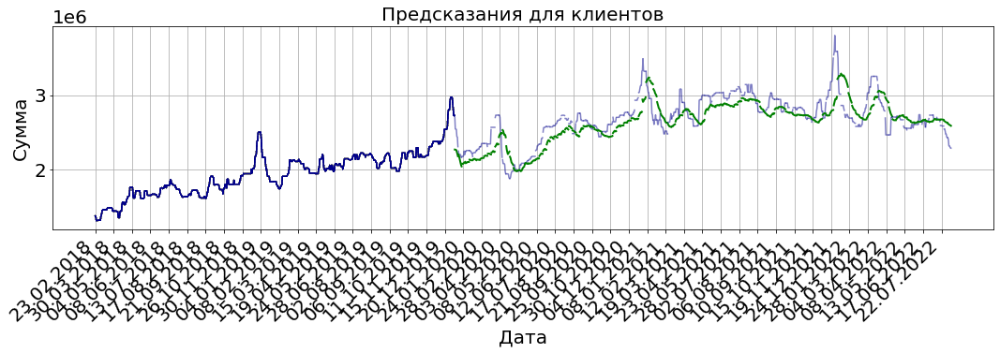

In [61]:
inext_fwd_mapes_all = fwd_mapes_all.copy()
inext_full_fwd_pred_tr_all = full_fwd_pred_tr_all.copy()
inext_full_fwd_true_all = full_fwd_true_all.copy()

for nth_week in trange(1,n_weeks-1):
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)

    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(next_all_rw.iloc[shift_days:], next_split, dim, mem, 0)
    
    inext_fwd_mapes_all, inext_full_fwd_pred_tr_all, inext_full_fwd_true_all = macro_model_functions.use_inc_model(model_all_inc, next_scaler, next_dat, next_all_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            inext_fwd_mapes_all, inext_full_fwd_pred_tr_all, inext_full_fwd_true_all,
                            n_ep_inc)

plt.rcParams['figure.figsize'] = 18, 4
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_all)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_all)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_all).shape[0]) * 100 :.3f}%')
r = macro_help_functions.plot_clients_pred_base('all',a1_dm,df_2models,df_real_id,bool_clients,
                                                inext_full_fwd_pred_tr_all, inext_full_fwd_true_all,split,
                                                dim, mem, fwd, days, 35, n_weeks,shift_days)

In [64]:

model_all_inc.save("exp_data/all/model_all_inc.h5")

np.save('exp_data/all/inext_fwd_mapes_all', np.array(inext_fwd_mapes_all))
np.save('exp_data/all/inext_full_fwd_pred_tr_all', np.array(inext_full_fwd_pred_tr_all))
np.save('exp_data/all/inext_full_fwd_true_all', np.array(inext_full_fwd_true_all))

In [12]:
model_all_inc = load_model('exp_data/all/model_all_inc.h5')
inext_fwd_mapes_all = np.load('exp_data/all/inext_fwd_mapes_all.npy')
inext_full_fwd_pred_tr_all = np.load('exp_data/all/inext_full_fwd_pred_tr_all.npy')
inext_full_fwd_true_all = np.load('exp_data/all/inext_full_fwd_true_all.npy')

print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_all)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_all)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_all).shape[0]) * 100 :.3f}%') 

test MAPE median: 4.995%
test MAPE HP: 50.370%


#### Плохие

In [66]:
in1 = Input(batch_shape = (1, mem, dim))
out = LSTM(n_neurons_each_model, batch_input_shape=(1, mem, dim), 
                    stateful=True, return_sequences=False, activation='relu')(in1)
out = Dropout(0.1)(out)
out = Dense(32, activation='relu')(out)
out = Dropout(0.1)(out)
x = Dense(1, activation='linear')(out)

model_bad_inc = Model(inputs=[in1], outputs=x)
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=lr_inc)
model_bad_inc.compile(loss='mean_squared_error',metrics=['mape'], optimizer=optimizer,  run_eagerly=True)
model_bad_inc.set_weights(model_bad.get_weights())

In [28]:
fwd_mapes_bad,full_fwd_pred_tr_bad,full_fwd_true_bad = [next_fwd_mapes_bad[0]],\
                                                        [next_full_fwd_pred_tr_bad[0]],\
                                                        [next_full_fwd_true_bad[0]]

  0%|          | 0/134 [00:00<?, ?it/s]

test MAPE median: 5.403%
test MAPE HP: 46.667%


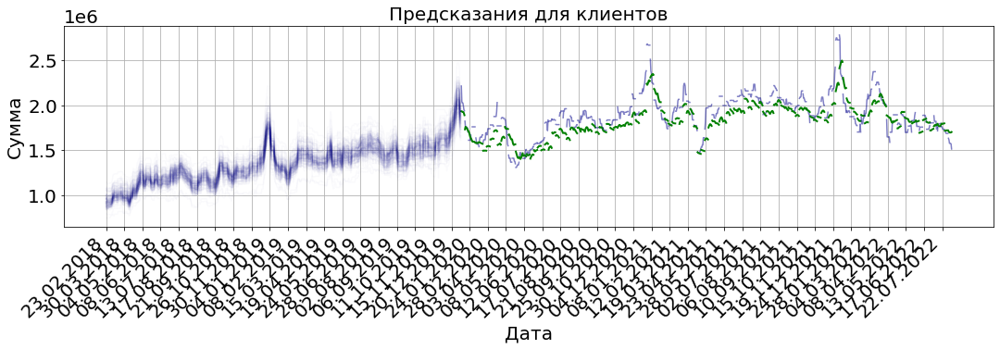

In [68]:
inext_fwd_mapes_bad = fwd_mapes_bad.copy()
inext_full_fwd_pred_tr_bad = full_fwd_pred_tr_bad.copy()
inext_full_fwd_true_bad = full_fwd_true_bad.copy()

for nth_week in trange(1,n_weeks-1):
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)

    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(next_bad_rw.iloc[shift_days:], next_split, dim, mem, 0)
    
    inext_fwd_mapes_bad, inext_full_fwd_pred_tr_bad, inext_full_fwd_true_bad = macro_model_functions.use_inc_model(model_bad_inc, next_scaler, next_dat, next_bad_rw.iloc[shift_days:],
                            dim, mem, next_split, fwd,
                            inext_fwd_mapes_bad, inext_full_fwd_pred_tr_bad, inext_full_fwd_true_bad,n_ep_inc)
    
plt.rcParams['figure.figsize'] = 18, 4
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_bad)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_bad)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_bad).shape[0]) * 100 :.3f}%')
r = macro_help_functions.plot_clients_pred_base('bad',a1_dm,df_2models,df_real_id,bool_clients,
                                                inext_full_fwd_pred_tr_bad, inext_full_fwd_true_bad,split,
                                                dim, mem, fwd, days, 35, n_weeks,shift_days)

In [69]:

model_bad_inc.save("exp_data/bad/model_bad_inc.h5")

np.save('exp_data/bad/inext_fwd_mapes_bad', np.array(inext_fwd_mapes_bad))
np.save('exp_data/bad/inext_full_fwd_pred_tr_bad', np.array(inext_full_fwd_pred_tr_bad))
np.save('exp_data/bad/inext_full_fwd_true_bad', np.array(inext_full_fwd_true_bad))


In [13]:
model_bad_inc = load_model('exp_data/bad/model_bad_inc.h5')
inext_fwd_mapes_bad = np.load('exp_data/bad/inext_fwd_mapes_bad.npy')
inext_full_fwd_pred_tr_bad = np.load('exp_data/bad/inext_full_fwd_pred_tr_bad.npy')
inext_full_fwd_true_bad = np.load('exp_data/bad/inext_full_fwd_true_bad.npy')

print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_bad)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_bad)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_bad).shape[0]) * 100 :.3f}%') 

test MAPE median: 5.403%
test MAPE HP: 46.667%


##### выделяя 1 раз

In [71]:
plt.rcParams['figure.figsize'] = 22, 4
for_weeks_inext_fwd_mapes_bad_1t = []
for_weeks_inext_full_fwd_pred_tr_bad_1t = []
for_weeks_inext_full_fwd_true_bad_1t = []
imodels_bad_14_52_40 = []

# для каждой заданной недели
for week_to_test in [13,51,39]:
    reset_seeds(seed_value = the_chosen_seed)
    
    in1 = Input(batch_shape = (1, mem, dim))
    out = LSTM(n_neurons_each_model, batch_input_shape=(1, mem, dim), 
                        stateful=True, return_sequences=False, activation='relu')(in1)
    out = Dropout(0.1)(out)
    out = Dense(32, activation='relu')(out)
    out = Dropout(0.1)(out)
    x = Dense(1, activation='linear')(out)

    model_bad_inc_temp = Model(inputs=[in1], outputs=x)
    optimizer = tensorflow.keras.optimizers.Adam(learning_rate=lr_inc)
    model_bad_inc_temp.compile(loss='mean_squared_error',metrics=['mape'], optimizer=optimizer,  run_eagerly=True)
    model_bad_inc_temp.set_weights(model_bad.get_weights())
    
    good_clients_id, good_rw, bad_rw, all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,week_to_test,window_size=21)
    
    inext_fwd_mapes_bad_1t = fwd_mapes_bad.copy()
    inext_full_fwd_pred_tr_bad_1t = full_fwd_pred_tr_bad.copy()
    inext_full_fwd_true_bad_1t = full_fwd_true_bad.copy()

    # Для каждой тестовой недели
    for nth_week in trange(1,n_weeks-1):
        # считаем день, с которого начинаем предсказывать
        last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
        next_split= days.shape[0]-last_day-1

        # Предсказываем (без обучения)
        next_scaler, next_x, next_y, next_dat = macro_help_functions.prepare_data(bad_rw.iloc[shift_days:], next_split, dim, mem, 0)
    
        inext_fwd_mapes_bad_1t, inext_full_fwd_pred_tr_bad_1t, \
        inext_full_fwd_true_bad_1t = macro_model_functions.use_inc_model(model_bad_inc_temp, next_scaler, next_dat, bad_rw.iloc[shift_days:],
                                dim, mem, next_split, fwd, inext_fwd_mapes_bad_1t, inext_full_fwd_pred_tr_bad_1t, inext_full_fwd_true_bad_1t,n_ep_inc)
    # запомним рез-ты
    for_weeks_inext_fwd_mapes_bad_1t.append(inext_fwd_mapes_bad_1t)
    for_weeks_inext_full_fwd_pred_tr_bad_1t.append(inext_full_fwd_pred_tr_bad_1t)
    for_weeks_inext_full_fwd_true_bad_1t.append(inext_full_fwd_true_bad_1t)
    imodels_bad_14_52_40.append(model_bad_inc_temp)
    
    print(f'week №{week_to_test}')
    print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_bad_1t)) *100 :.3f}%')
    print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_bad_1t)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_bad_1t).shape[0]) * 100 :.3f}%')
    
# запишем рез-ты в переменные для отд.недель
inext_fwd_mapes_bad_1t14, inext_fwd_mapes_bad_1t52, inext_fwd_mapes_bad_1t = for_weeks_inext_fwd_mapes_bad_1t
inext_full_fwd_pred_tr_bad_1t14, inext_full_fwd_pred_tr_bad_1t52, inext_full_fwd_pred_tr_bad_1t = for_weeks_inext_full_fwd_pred_tr_bad_1t
inext_full_fwd_true_bad_1t14, inext_full_fwd_true_bad_1t52, inext_full_fwd_true_bad_1t = for_weeks_inext_full_fwd_true_bad_1t
imodel_bad_14, imodel_bad_52, imodel_bad_40 = imodels_bad_14_52_40

  0%|          | 0/134 [00:00<?, ?it/s]

week №13
test MAPE median: 4.834%
test MAPE HP: 51.852%


  0%|          | 0/134 [00:00<?, ?it/s]

week №51
test MAPE median: 5.698%
test MAPE HP: 41.481%


  0%|          | 0/134 [00:00<?, ?it/s]

week №39
test MAPE median: 5.706%
test MAPE HP: 41.481%


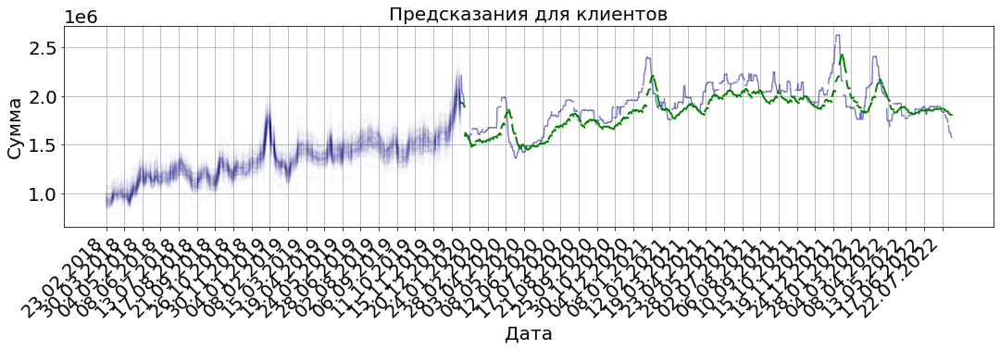

In [72]:
# для последней рассмотренной недели
plt.rcParams['figure.figsize'] = 18, 4
r = macro_help_functions.plot_clients_pred_base('bad',a1_dm,df_2models,df_real_id,bool_clients,
                                                 inext_full_fwd_pred_tr_bad_1t, inext_full_fwd_true_bad_1t,split,
                                                dim, mem, fwd, days, 35, n_weeks,shift_days)

In [73]:
# SAVING

imodel_bad_14.save("exp_data/bad/imodel_bad_14.h5")
imodel_bad_52.save("exp_data/bad/imodel_bad_52.h5")
imodel_bad_40.save("exp_data/bad/imodel_bad_40.h5")

np.save('exp_data/bad/inext_fwd_mapes_bad_1t14', np.array(inext_fwd_mapes_bad_1t14))
np.save('exp_data/bad/inext_fwd_mapes_bad_1t52', np.array(inext_fwd_mapes_bad_1t52))
np.save('exp_data/bad/inext_fwd_mapes_bad_1t', np.array(inext_fwd_mapes_bad_1t))

np.save('exp_data/bad/inext_full_fwd_pred_tr_bad_1t14', np.array(inext_full_fwd_pred_tr_bad_1t14))
np.save('exp_data/bad/inext_full_fwd_pred_tr_bad_1t52', np.array(inext_full_fwd_pred_tr_bad_1t52))
np.save('exp_data/bad/inext_full_fwd_pred_tr_bad_1t', np.array(inext_full_fwd_pred_tr_bad_1t))

np.save('exp_data/bad/inext_full_fwd_true_bad_1t14', np.array(inext_full_fwd_true_bad_1t14))
np.save('exp_data/bad/inext_full_fwd_true_bad_1t52', np.array(inext_full_fwd_true_bad_1t52))
np.save('exp_data/bad/inext_full_fwd_true_bad_1t', np.array(inext_full_fwd_true_bad_1t))


In [14]:
# LOADING
imodel_bad_14 = load_model('exp_data/bad/imodel_bad_14.h5')
imodel_bad_52 = load_model('exp_data/bad/imodel_bad_52.h5')
imodel_bad_40 = load_model('exp_data/bad/imodel_bad_40.h5')

inext_fwd_mapes_bad_1t14 = np.load('exp_data/bad/inext_fwd_mapes_bad_1t14.npy')
inext_fwd_mapes_bad_1t52 = np.load('exp_data/bad/inext_fwd_mapes_bad_1t52.npy')
inext_fwd_mapes_bad_1t = np.load('exp_data/bad/inext_fwd_mapes_bad_1t.npy')

inext_full_fwd_pred_tr_bad_1t14 = np.load('exp_data/bad/inext_full_fwd_pred_tr_bad_1t14.npy')
inext_full_fwd_pred_tr_bad_1t52 = np.load('exp_data/bad/inext_full_fwd_pred_tr_bad_1t52.npy')
inext_full_fwd_pred_tr_bad_1t = np.load('exp_data/bad/inext_full_fwd_pred_tr_bad_1t.npy')

inext_full_fwd_true_bad_1t14 = np.load('exp_data/bad/inext_full_fwd_true_bad_1t14.npy')
inext_full_fwd_true_bad_1t52 = np.load('exp_data/bad/inext_full_fwd_true_bad_1t52.npy')
inext_full_fwd_true_bad_1t = np.load('exp_data/bad/inext_full_fwd_true_bad_1t.npy')

print(f'week №14')
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_bad_1t14)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_bad_1t14)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_bad_1t14).shape[0]) * 100 :.3f}%')
print(f'week №52')    
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_bad_1t52)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_bad_1t52)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_bad_1t52).shape[0]) * 100 :.3f}%')
print(f'week №40')
print(f'test MAPE median: {np.median(np.array(inext_fwd_mapes_bad_1t)) *100 :.3f}%')
print(f'test MAPE HP: {(np.where(np.array(inext_fwd_mapes_bad_1t)<=0.05)[0].shape[0] / np.array(inext_fwd_mapes_bad_1t).shape[0]) * 100 :.3f}%')

week №14
test MAPE median: 4.834%
test MAPE HP: 51.852%
week №52
test MAPE median: 5.698%
test MAPE HP: 41.481%
week №40
test MAPE median: 5.706%
test MAPE HP: 41.481%


####  Графики

In [15]:
font_size = 20
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=font_size)          # controls default text sizes
plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
plt.rc('axes', labelsize=font_size)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('legend', fontsize=font_size)    # legend fontsize
plt.rc('figure', titlesize=font_size)  # fontsize of the figure title

Text(0, 0.5, 'MAPE')

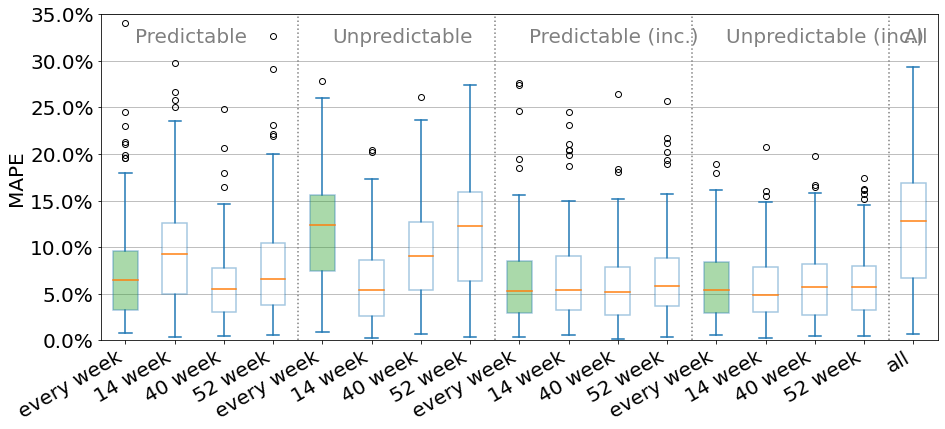

In [32]:
# График
preds_each_week_all = pd.DataFrame({'High1':next_fwd_mapes,'High2':next_fwd_mapes_1t14,'High3':next_fwd_mapes_1t,'High4':next_fwd_mapes_1t52,
                                    'Low1':next_fwd_mapes_bad,'Low2':next_fwd_mapes_bad_1t14,'Low3':next_fwd_mapes_bad_1t,'Low4':next_fwd_mapes_bad_1t52,
                                    'iHigh1':inext_fwd_mapes,'iHigh2':inext_fwd_mapes_1t14,'iHigh3':inext_fwd_mapes_1t,'iHigh4':inext_fwd_mapes_1t52,
                                    'iLow1':inext_fwd_mapes_bad,'iLow2':inext_fwd_mapes_bad_1t14,'iLow3':inext_fwd_mapes_bad_1t,'iLow4':inext_fwd_mapes_bad_1t52,
                                   'All':next_fwd_mapes_all})

plt.rcParams['figure.figsize'] = 15, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = preds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

height = 0.32
beginning = 1.2
plt.text(beginning, height, 'Predictable', color='gray')
plt.axvline(4.5, c='gray', ls=':')
plt.text(beginning+4, height, 'Unpredictable', color='gray')
plt.axvline(8.5, c='gray', ls=':')
plt.text(beginning+8, height, 'Predictable (inc.)', color='gray')
plt.axvline(12.5, c='gray', ls=':')
plt.text(beginning+12, height, 'Unpredictable (inc.)', color='gray')
plt.axvline(16.5, c='gray', ls=':')
plt.text(beginning+15.6, height, 'All', color='gray')

colors = [cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         'white']

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

s = plt.xticks(range(1,18), ['every week','14 week','40 week','52 week']*4+['all'], rotation=30, ha='right')
plt.grid(axis='y')
plt.ylim(0,0.35)
plt.ylabel('MAPE')

In [34]:
next_fwd_mapes.shape

(135,)

Text(0, 0.5, 'MAPE')

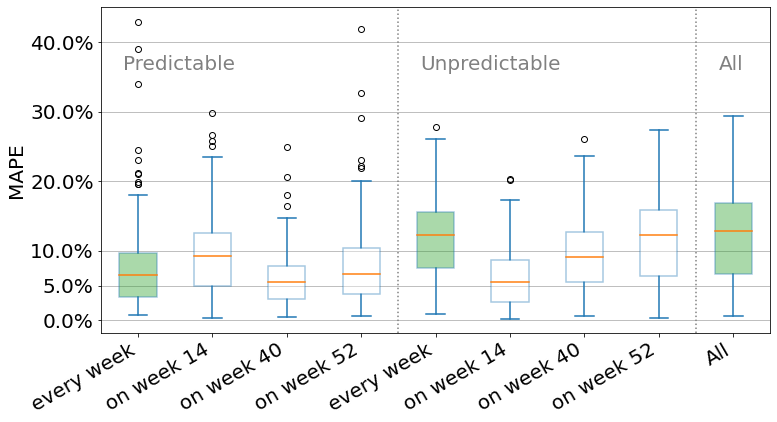

In [33]:
# График
preds_each_week_all = pd.DataFrame({'High1':next_fwd_mapes,'High2':next_fwd_mapes_1t14,'High3':next_fwd_mapes_1t,'High4':next_fwd_mapes_1t52,
                                    'Low1':next_fwd_mapes_bad,'Low2':next_fwd_mapes_bad_1t14,'Low3':next_fwd_mapes_bad_1t,'Low4':next_fwd_mapes_bad_1t52,
                                   'All':next_fwd_mapes_all})
plt.rcParams['figure.figsize'] = 12, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = preds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

plt.text(0.8, 0.36, 'Predictable', color='gray')
plt.axvline(4.5, c='gray', ls=':')
plt.text(4.8, 0.36, 'Unpredictable', color='gray')
plt.axvline(8.5, c='gray', ls=':')
plt.text(8.8, 0.36, 'All', color='gray')

colors = [cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white'
         ]

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

s = plt.xticks(range(1,10), ['every week','on week 14','on week 40','on week 52']*2+['All'], rotation=30, ha='right')
plt.yticks([0,0.05,0.1,0.2,0.3,0.4])
plt.grid(axis='y')
#plt.ylim(0,0.3)
plt.ylabel('MAPE')

Text(0, 0.5, 'MAPE')

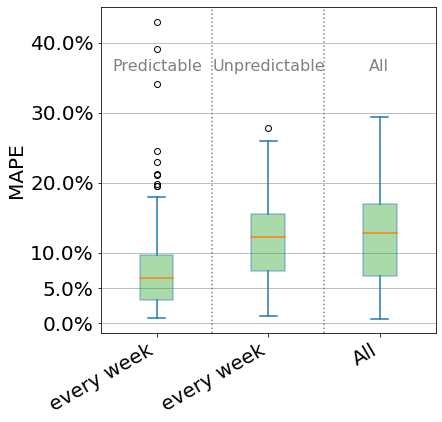

In [63]:
# График
preds_each_week_all = pd.DataFrame({'High1':next_fwd_mapes,
                                    'Low1':next_fwd_mapes_bad,
                                   'All':next_fwd_mapes_all})
plt.rcParams['figure.figsize'] = 6, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = preds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

fs = 16
plt.text(0.6, 0.36, 'Predictable', color='gray', fontsize=fs)
plt.axvline(1.5, c='gray', ls=':')
plt.text(1.5, 0.36, 'Unpredictable', color='gray', fontsize=fs)
plt.axvline(2.5, c='gray', ls=':')
plt.text(2.9, 0.36, 'All', color='gray', fontsize=fs)

colors = [cmap.colors[2],cmap.colors[2],cmap.colors[2]]

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

s = plt.xticks(range(1,4), ['every week']*2+['All'], rotation=30, ha='right')
plt.yticks([0,0.05,0.1,0.2,0.3,0.4])
plt.grid(axis='y')
#plt.ylim(0,0.3)
plt.ylabel('MAPE')

Text(0, 0.5, 'MAPE')

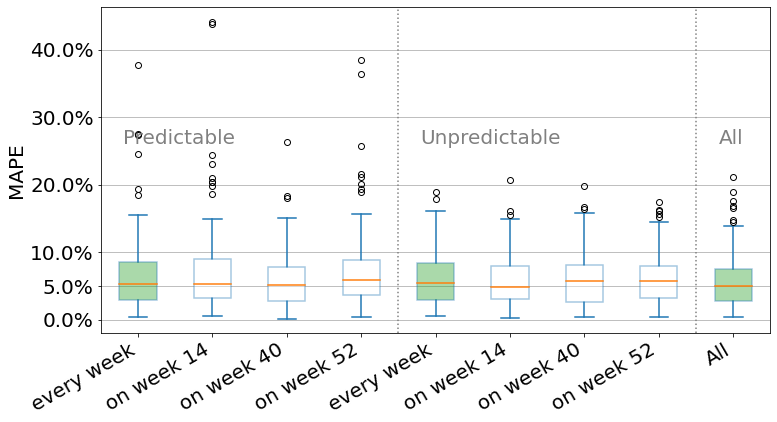

In [36]:
# График
ipreds_each_week_all = pd.DataFrame({'High1':inext_fwd_mapes,'High2':inext_fwd_mapes_1t14,'High3':inext_fwd_mapes_1t,'High4':inext_fwd_mapes_1t52,
                                    'Low1':inext_fwd_mapes_bad,'Low2':inext_fwd_mapes_bad_1t14,'Low3':inext_fwd_mapes_bad_1t,'Low4':inext_fwd_mapes_bad_1t52,
                                   'All':inext_fwd_mapes_all})
plt.rcParams['figure.figsize'] = 12, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = ipreds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

plt.text(0.8, 0.26, 'Predictable', color='gray')
plt.axvline(4.5, c='gray', ls=':')
plt.text(4.8, 0.26, 'Unpredictable', color='gray')
plt.axvline(8.5, c='gray', ls=':')
plt.text(8.8, 0.26, 'All', color='gray')

colors = [cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white'
         ]

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

s = plt.xticks(range(1,10), ['every week','on week 14','on week 40','on week 52']*2+['All'], rotation=30, ha='right')
plt.yticks([0,0.05,0.1,0.2,0.3,0.4])
plt.grid(axis='y')
#plt.ylim(0,0.2)
plt.ylabel('MAPE')

Text(0, 0.5, 'MAPE')

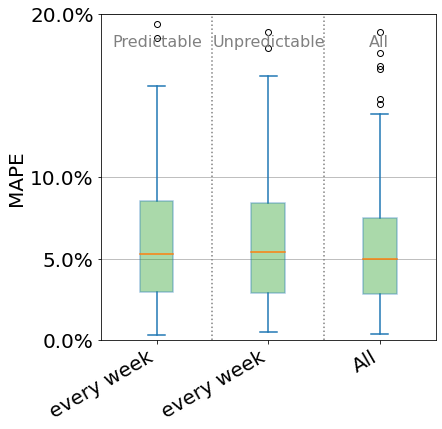

In [70]:
# График
ipreds_each_week_all = pd.DataFrame({'High1':inext_fwd_mapes,
                                    'Low1':inext_fwd_mapes_bad,
                                   'All':inext_fwd_mapes_all})
plt.rcParams['figure.figsize'] = 6, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = ipreds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

fs = 16
plt.text(0.6, 0.18, 'Predictable', color='gray', fontsize=fs)
plt.axvline(1.5, c='gray', ls=':')
plt.text(1.5, 0.18, 'Unpredictable', color='gray', fontsize=fs)
plt.axvline(2.5, c='gray', ls=':')
plt.text(2.9, 0.18, 'All', color='gray', fontsize=fs)

colors = [cmap.colors[2],cmap.colors[2],cmap.colors[2]]

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

s = plt.xticks(range(1,4), ['every week']*2+['All'], rotation=30, ha='right')

plt.yticks([0,0.05,0.1,0.2,0.3,0.4])
plt.grid(axis='y')
plt.ylim(0,0.2)
plt.ylabel('MAPE')

Text(0, 0.5, 'MAPE')

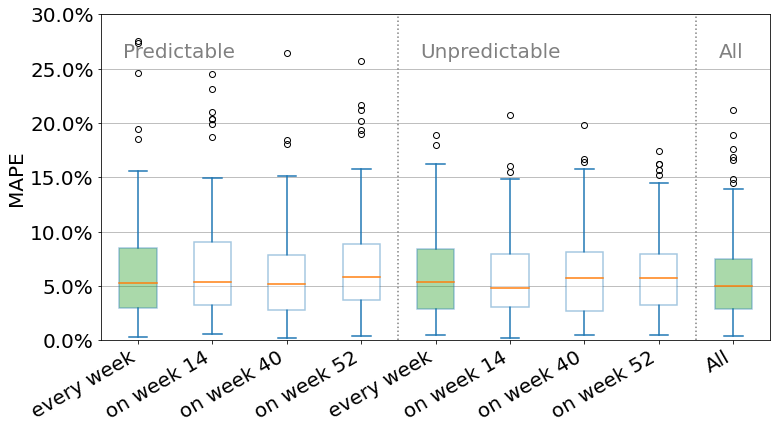

In [79]:
# График
ipreds_each_week_all = pd.DataFrame({'High1':inext_fwd_mapes,'High2':inext_fwd_mapes_1t14,'High3':inext_fwd_mapes_1t,'High4':inext_fwd_mapes_1t52,
                                    'Low1':inext_fwd_mapes_bad,'Low2':inext_fwd_mapes_bad_1t14,'Low3':inext_fwd_mapes_bad_1t,'Low4':inext_fwd_mapes_bad_1t52,
                                   'All':inext_fwd_mapes_all})
plt.rcParams['figure.figsize'] = 12, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = ipreds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

plt.text(0.8, 0.26, 'Predictable', color='gray')
plt.axvline(4.5, c='gray', ls=':')
plt.text(4.8, 0.26, 'Unpredictable', color='gray')
plt.axvline(8.5, c='gray', ls=':')
plt.text(8.8, 0.26, 'All', color='gray')

colors = [cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white'
         ]

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

s = plt.xticks(range(1,10), ['every week','on week 14','on week 40','on week 52']*2+['All'], rotation=30, ha='right')
plt.grid(axis='y')
plt.ylim(0,0.3)
plt.ylabel('MAPE')

## Предсказания для хороших/плохих/всех сравниваем с реальными для всех клиентов

### По сумме

Найдем ошибки прогноза всех по сумме хороших и плохих

In [40]:
for_weeks_next_fwd_mapes_1t = next_fwd_mapes_1t14, next_fwd_mapes_1t52, next_fwd_mapes_1t
for_weeks_next_full_fwd_pred_tr_1t = next_full_fwd_pred_tr_1t14, next_full_fwd_pred_tr_1t52, next_full_fwd_pred_tr_1t
for_weeks_next_full_fwd_true_1t = next_full_fwd_true_1t14, next_full_fwd_true_1t52, next_full_fwd_true_1t

for_weeks_next_fwd_mapes_bad_1t = next_fwd_mapes_bad_1t14, next_fwd_mapes_bad_1t52, next_fwd_mapes_bad_1t 
for_weeks_next_full_fwd_pred_tr_bad_1t = next_full_fwd_pred_tr_bad_1t14, next_full_fwd_pred_tr_bad_1t52, next_full_fwd_pred_tr_bad_1t
for_weeks_next_full_fwd_true_bad_1t = next_full_fwd_true_bad_1t14, next_full_fwd_true_bad_1t52, next_full_fwd_true_bad_1t

for_weeks_inext_fwd_mapes_1t = inext_fwd_mapes_1t14, inext_fwd_mapes_1t52, inext_fwd_mapes_1t
for_weeks_inext_full_fwd_pred_tr_1t = inext_full_fwd_pred_tr_1t14, inext_full_fwd_pred_tr_1t52, inext_full_fwd_pred_tr_1t
for_weeks_inext_full_fwd_true_1t = inext_full_fwd_true_1t14, inext_full_fwd_true_1t52, inext_full_fwd_true_1t

for_weeks_inext_fwd_mapes_bad_1t = inext_fwd_mapes_bad_1t14, inext_fwd_mapes_bad_1t52, inext_fwd_mapes_bad_1t
for_weeks_inext_full_fwd_pred_tr_bad_1t = inext_full_fwd_pred_tr_bad_1t14, inext_full_fwd_pred_tr_bad_1t52, inext_full_fwd_pred_tr_bad_1t
for_weeks_inext_full_fwd_true_bad_1t = inext_full_fwd_true_bad_1t14, inext_full_fwd_true_bad_1t52, inext_full_fwd_true_bad_1t

In [41]:
# при поиске клиентов в классах каждую неделю
mape_all_sum = []
imape_all_sum = []

for nth_week in trange(0,n_weeks-1):
    # Считаем MAPE для предсказаний
    mape_all_sum.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                next_full_fwd_pred_tr[nth_week]+next_full_fwd_pred_tr_bad[nth_week]))
    imape_all_sum.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                inext_full_fwd_pred_tr[nth_week]+inext_full_fwd_pred_tr_bad[nth_week]))

# при поиске клиентов в классах только один раз
for_weeks_mape_all_sum_1t = []
for_weeks_imape_all_sum_1t = []
for week_to_test in range(len([14,52,40])):
    mape_all_sum_1t = []
    imape_all_sum_1t = []
    for nth_week in trange(0,n_weeks-1):
        mape_all_sum_1t.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                          for_weeks_next_full_fwd_pred_tr_1t[week_to_test][nth_week] + \
                                                          for_weeks_next_full_fwd_pred_tr_bad_1t[week_to_test][nth_week]))
        imape_all_sum_1t.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                           for_weeks_inext_full_fwd_pred_tr_1t[week_to_test][nth_week] + \
                                                          for_weeks_inext_full_fwd_pred_tr_bad_1t[week_to_test][nth_week]))
    for_weeks_mape_all_sum_1t.append(mape_all_sum_1t)
    for_weeks_imape_all_sum_1t.append(imape_all_sum_1t) 
    
mape_all_sum_1t14,mape_all_sum_1t52,mape_all_sum_1t = for_weeks_mape_all_sum_1t
imape_all_sum_1t14,imape_all_sum_1t52,imape_all_sum_1t = for_weeks_imape_all_sum_1t

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

Найдем ошибки прогноза всех по хорошим или по плохим с поиском клиентов 1 раз

Графики для сумм плохие+хорошие

In [43]:
font_size = 15
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=font_size)          # controls default text sizes
plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
plt.rc('axes', labelsize=font_size)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('legend', fontsize=font_size)    # legend fontsize
plt.rc('figure', titlesize=font_size)  # fontsize of the figure title

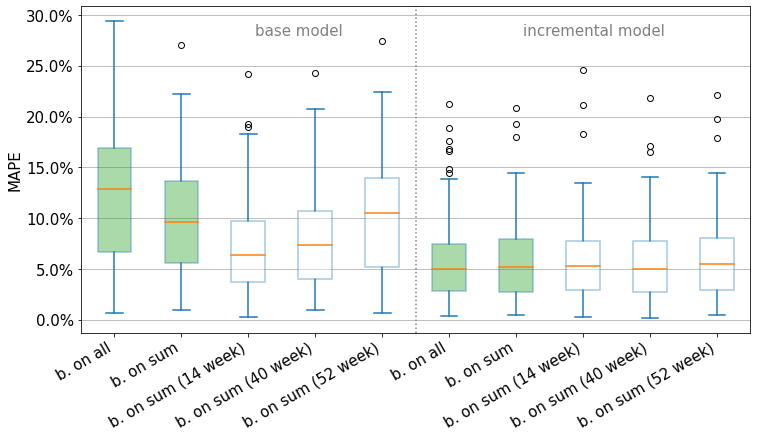

In [44]:
plt.rcParams['figure.figsize'] = 12, 6
temp_sum = pd.DataFrame({'regular':next_fwd_mapes_all,'sum':mape_all_sum,
                        'sum_1t14':mape_all_sum_1t14,'sum_1t40':mape_all_sum_1t,'sum_1t52':mape_all_sum_1t52,
                        'inc_regular':inext_fwd_mapes_all,'sum_inc':imape_all_sum,
                        'sum_inc_1t14':imape_all_sum_1t14,'sum_inc_1t40':imape_all_sum_1t,'sum_inc_1t52':imape_all_sum_1t52})

boxes = temp_sum.plot(kind='box', return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             capprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             patch_artist=True,
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))
plt.xticks(range(1,11),
           ["b. on all","b. on sum",'b. on sum (14 week)','b. on sum (40 week)','b. on sum (52 week)']*2)

colors = [cmap.colors[2],cmap.colors[2],'white','white','white',
          cmap.colors[2],cmap.colors[2],'white','white','white']

for i,box in enumerate(boxes[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)
    
plt.text(3.1, 0.28, 'base model', color='gray')
plt.axvline(5.5, c='gray', ls=':')
plt.text(7.1, 0.28, 'incremental model', color='gray')

plt.grid(axis='y')
plt.ylabel('MAPE')
plt.xticks(rotation=30, ha='right');

In [45]:
mape_hp = 0.05
print(f'14 sum_1t: test MAPE median: {np.median(np.array(mape_all_sum_1t14)) * 100 :.3f}%')
print(f'14 sum_1t: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_all_sum_1t14)<=mape_hp)[0].shape[0] / np.array(mape_all_sum_1t14).shape[0]) * 100 :.3f}%\n')
print(f'40 sum_1t: test MAPE median: {np.median(np.array(mape_all_sum_1t)) * 100 :.3f}%')
print(f'40 sum_1t: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_all_sum_1t)<=mape_hp)[0].shape[0] / np.array(mape_all_sum_1t).shape[0]) * 100 :.3f}%\n')
print(f'52 sum_1t: test MAPE median: {np.median(np.array(mape_all_sum_1t52)) * 100 :.3f}%')
print(f'52 sum_1t: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_all_sum_1t52)<=mape_hp)[0].shape[0] / np.array(mape_all_sum_1t52).shape[0]) * 100 :.3f}%\n')


print(f'14 sum_inc_1t: test MAPE median: {np.median(np.array(imape_all_sum_1t14)) * 100 :.3f}%')
print(f'14 sum_inc_1t: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_all_sum_1t14)<=mape_hp)[0].shape[0] / np.array(imape_all_sum_1t14).shape[0]) * 100 :.3f}%\n')
print(f'40 sum_inc_1t: test MAPE median: {np.median(np.array(imape_all_sum_1t)) * 100 :.3f}%')
print(f'40 sum_inc_1t: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_all_sum_1t)<=mape_hp)[0].shape[0] / np.array(imape_all_sum_1t).shape[0]) * 100 :.3f}%\n')
print(f'52 sum_inc_1t: test MAPE median: {np.median(np.array(imape_all_sum_1t52)) * 100 :.3f}%')
print(f'52 sum_inc_1t: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_all_sum_1t52)<=mape_hp)[0].shape[0] / np.array(imape_all_sum_1t52).shape[0]) * 100 :.3f}%\n')


14 sum_1t: test MAPE median: 6.391%
14 sum_1t: test MAPE HP (<=5.0%): 34.074%

40 sum_1t: test MAPE median: 7.367%
40 sum_1t: test MAPE HP (<=5.0%): 32.593%

52 sum_1t: test MAPE median: 10.517%
52 sum_1t: test MAPE HP (<=5.0%): 23.704%

14 sum_inc_1t: test MAPE median: 5.272%
14 sum_inc_1t: test MAPE HP (<=5.0%): 49.630%

40 sum_inc_1t: test MAPE median: 4.995%
40 sum_inc_1t: test MAPE HP (<=5.0%): 50.370%

52 sum_inc_1t: test MAPE median: 5.475%
52 sum_inc_1t: test MAPE HP (<=5.0%): 48.148%



In [46]:
print(f'ALL vs ALL preds: test MAPE median: {np.median(np.array(next_fwd_mapes_all)) * 100 :.3f}%')
print(f'ALL vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(next_fwd_mapes_all)<=mape_hp)[0].shape[0] / np.array(next_fwd_mapes_all).shape[0]) * 100 :.3f}%\n')

print(f'inc ALL vs ALL preds: test MAPE median: {np.median(np.array(inext_fwd_mapes_all)) * 100 :.3f}%')
print(f'inc ALL vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(inext_fwd_mapes_all)<=mape_hp)[0].shape[0] / np.array(inext_fwd_mapes_all).shape[0]) * 100 :.3f}%\n')


print(f'sum: test MAPE median: {np.median(np.array(mape_all_sum)) * 100 :.3f}%')
print(f'sum: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_all_sum)<=mape_hp)[0].shape[0] / np.array(mape_all_sum).shape[0]) * 100 :.3f}%\n')

print(f'sum_inc: test MAPE median: {np.median(np.array(imape_all_sum)) * 100 :.3f}%')
print(f'sum_inc: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_all_sum)<=mape_hp)[0].shape[0] / np.array(imape_all_sum).shape[0]) * 100 :.3f}%\n')

ALL vs ALL preds: test MAPE median: 12.835%
ALL vs ALL preds: test MAPE HP (<=5.0%): 18.519%

inc ALL vs ALL preds: test MAPE median: 4.995%
inc ALL vs ALL preds: test MAPE HP (<=5.0%): 50.370%

sum: test MAPE median: 9.654%
sum: test MAPE HP (<=5.0%): 22.963%

sum_inc: test MAPE median: 5.231%
sum_inc: test MAPE HP (<=5.0%): 49.630%



### По отд. классу клиентов с выбором 1 раз

In [48]:
split

951

In [49]:
last_day = days[days==f'{a1_dm[2]}'].index[0]
next_split= days.shape[0]-last_day-1
next_all_rw[shift_days+mem+dim:-next_split]

53     1373448.0
54     1373448.0
55     1310807.0
56     1310807.0
57     1310807.0
         ...    
746    2198953.0
747    2198953.0
748    2198953.0
749    2160364.0
750    2160364.0
Length: 698, dtype: float64

In [51]:
for_weeks_mape_good_pred_vs_all_1t = []
for_weeks_imape_good_pred_vs_all_1t = []
for_weeks_mape_bad_pred_vs_all_1t = []
for_weeks_imape_bad_pred_vs_all_1t = []



for week_to_test in [13,51,39]:
    good_clients_id, next_good_rw, next_bad_rw, \
        next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,
                                                                  bool_clients,week_to_test,
                                                                  window_size=21)
    coeff_good = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_good_rw[shift_days:-split].values.reshape(-1))
    coeff_bad = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_bad_rw[shift_days:-split].values.reshape(-1))
    
    mape_good_pred_vs_all_1t = []
    imape_good_pred_vs_all_1t = []
    mape_bad_pred_vs_all_1t = []
    imape_bad_pred_vs_all_1t = []
    
    for nth_week in trange(0,n_weeks-1):
        last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
        next_split= days.shape[0]-last_day-1

        # Считаем MAPE для предсказаний хороших клиентов, умноженных на коэфф.
        #(этот коефф же берет данные за сам период теста????? поэтому убираем)
        #coeff = np.median(next_all_rw[shift_days+mem+dim:-next_split].values.reshape(-1))/np.median(next_good_rw[shift_days+mem+dim:-next_split].values.reshape(-1))
        
        mape_good_pred_vs_all_1t.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                    next_full_fwd_pred_tr_1t[nth_week]*coeff_good))
        imape_good_pred_vs_all_1t.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                    inext_full_fwd_pred_tr_1t[nth_week]*coeff_good))
        # Считаем MAPE для предсказаний плохих клиентов, умноженных на коэфф.
        #(этот коефф же берет данные за сам период теста????? поэтому убираем)
        #coeff_bad = np.median(next_all_rw[shift_days+mem+dim:-next_split].values.reshape(-1))/np.median(next_bad_rw[shift_days+mem+dim:-next_split].values.reshape(-1))

        mape_bad_pred_vs_all_1t.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                       next_full_fwd_pred_tr_bad_1t[nth_week]*coeff_bad))
        imape_bad_pred_vs_all_1t.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                       inext_full_fwd_pred_tr_bad_1t[nth_week]*coeff_bad))
        
    for_weeks_mape_good_pred_vs_all_1t.append(mape_good_pred_vs_all_1t)
    for_weeks_imape_good_pred_vs_all_1t.append(imape_good_pred_vs_all_1t)
    for_weeks_mape_bad_pred_vs_all_1t.append(mape_bad_pred_vs_all_1t)
    for_weeks_imape_bad_pred_vs_all_1t.append(imape_bad_pred_vs_all_1t)

mape_good_pred_vs_all_1t14,mape_good_pred_vs_all_1t52,mape_good_pred_vs_all_1t = for_weeks_mape_good_pred_vs_all_1t
imape_good_pred_vs_all_1t14,imape_good_pred_vs_all_1t52,imape_good_pred_vs_all_1t = for_weeks_imape_good_pred_vs_all_1t
mape_bad_pred_vs_all_1t14,mape_bad_pred_vs_all_1t52,mape_bad_pred_vs_all_1t = for_weeks_mape_bad_pred_vs_all_1t
imape_bad_pred_vs_all_1t14,imape_bad_pred_vs_all_1t52,imape_bad_pred_vs_all_1t = for_weeks_imape_bad_pred_vs_all_1t

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

In [52]:
mape_hp = 0.05

print(f'14week good: test MAPE median: {np.median(np.array(mape_good_pred_vs_all_1t14)) * 100 :.3f}%')
print(f'14week good: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_good_pred_vs_all_1t14)<=mape_hp)[0].shape[0] / np.array(mape_good_pred_vs_all_1t14).shape[0]) * 100 :.3f}%\n')
print(f'40week good: test MAPE median: {np.median(np.array(mape_good_pred_vs_all_1t)) * 100 :.3f}%')
print(f'40week good: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_good_pred_vs_all_1t)<=mape_hp)[0].shape[0] / np.array(mape_good_pred_vs_all_1t).shape[0]) * 100 :.3f}%\n')
print(f'52week good: test MAPE median: {np.median(np.array(mape_good_pred_vs_all_1t52)) * 100 :.3f}%')
print(f'52week good: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_good_pred_vs_all_1t52)<=mape_hp)[0].shape[0] / np.array(mape_good_pred_vs_all_1t52).shape[0]) * 100 :.3f}%\n')

print(f'14week bad: test MAPE median: {np.median(np.array(mape_bad_pred_vs_all_1t14)) * 100 :.3f}%')
print(f'14week bad: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_bad_pred_vs_all_1t14)<=mape_hp)[0].shape[0] / np.array(mape_bad_pred_vs_all_1t14).shape[0]) * 100 :.3f}%\n')
print(f'40week bad: test MAPE median: {np.median(np.array(mape_bad_pred_vs_all_1t)) * 100 :.3f}%')
print(f'40week bad: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_bad_pred_vs_all_1t)<=mape_hp)[0].shape[0] / np.array(mape_bad_pred_vs_all_1t).shape[0]) * 100 :.3f}%\n')
print(f'52week bad: test MAPE median: {np.median(np.array(mape_bad_pred_vs_all_1t52)) * 100 :.3f}%')
print(f'52week bad: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_bad_pred_vs_all_1t52)<=mape_hp)[0].shape[0] / np.array(mape_bad_pred_vs_all_1t52).shape[0]) * 100 :.3f}%\n')


14week good: test MAPE median: 6.453%
14week good: test MAPE HP (<=5.0%): 35.556%

40week good: test MAPE median: 6.801%
40week good: test MAPE HP (<=5.0%): 32.593%

52week good: test MAPE median: 21.422%
52week good: test MAPE HP (<=5.0%): 1.481%

14week bad: test MAPE median: 6.962%
14week bad: test MAPE HP (<=5.0%): 37.778%

40week bad: test MAPE median: 8.207%
40week bad: test MAPE HP (<=5.0%): 31.111%

52week bad: test MAPE median: 15.574%
52week bad: test MAPE HP (<=5.0%): 3.704%



In [53]:
print(f'i14week good: test MAPE median: {np.median(np.array(imape_good_pred_vs_all_1t14)) * 100 :.3f}%')
print(f'i14week good: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_good_pred_vs_all_1t14)<=mape_hp)[0].shape[0] / np.array(imape_good_pred_vs_all_1t14).shape[0]) * 100 :.3f}%\n')
print(f'i40week good: test MAPE median: {np.median(np.array(imape_good_pred_vs_all_1t)) * 100 :.3f}%')
print(f'i40week good: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_good_pred_vs_all_1t)<=mape_hp)[0].shape[0] / np.array(imape_good_pred_vs_all_1t).shape[0]) * 100 :.3f}%\n')
print(f'i52week good: test MAPE median: {np.median(np.array(imape_good_pred_vs_all_1t52)) * 100 :.3f}%')
print(f'i52week good: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_good_pred_vs_all_1t52)<=mape_hp)[0].shape[0] / np.array(imape_good_pred_vs_all_1t52).shape[0]) * 100 :.3f}%\n')

print(f'i14week bad: test MAPE median: {np.median(np.array(imape_bad_pred_vs_all_1t14)) * 100 :.3f}%')
print(f'i14week bad: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_bad_pred_vs_all_1t14)<=mape_hp)[0].shape[0] / np.array(imape_bad_pred_vs_all_1t14).shape[0]) * 100 :.3f}%\n')
print(f'i40week bad: test MAPE median: {np.median(np.array(imape_bad_pred_vs_all_1t)) * 100 :.3f}%')
print(f'i40week bad: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_bad_pred_vs_all_1t)<=mape_hp)[0].shape[0] / np.array(imape_bad_pred_vs_all_1t).shape[0]) * 100 :.3f}%\n')
print(f'i52week bad: test MAPE median: {np.median(np.array(imape_bad_pred_vs_all_1t52)) * 100 :.3f}%')
print(f'i52week bad: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_bad_pred_vs_all_1t52)<=mape_hp)[0].shape[0] / np.array(imape_bad_pred_vs_all_1t52).shape[0]) * 100 :.3f}%\n')


i14week good: test MAPE median: 6.030%
i14week good: test MAPE HP (<=5.0%): 36.296%

i40week good: test MAPE median: 6.550%
i40week good: test MAPE HP (<=5.0%): 35.556%

i52week good: test MAPE median: 24.177%
i52week good: test MAPE HP (<=5.0%): 0.741%

i14week bad: test MAPE median: 4.433%
i14week bad: test MAPE HP (<=5.0%): 56.296%

i40week bad: test MAPE median: 4.784%
i40week bad: test MAPE HP (<=5.0%): 53.333%

i52week bad: test MAPE median: 11.047%
i52week bad: test MAPE HP (<=5.0%): 10.370%



### По отд. классу клиентов с выбором каждую неделю

Найдем ошибки прогноза всех по хорошим или по плохим с поиском клиентов на каждой неделе

In [54]:
mape_good_pred_vs_all = []
imape_good_pred_vs_all = []
mape_bad_pred_vs_all = []
imape_bad_pred_vs_all = []

for nth_week in trange(0,n_weeks-1):
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)
    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    # Считаем MAPE для предсказаний хороших клиентов, умноженных на коэфф.
    #coeff = np.median(next_all_rw[shift_days+mem+dim:-next_split].values.reshape(-1))/np.median(next_good_rw[shift_days+mem+dim:-next_split].values.reshape(-1))
    coeff_good = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_good_rw[shift_days:-split].values.reshape(-1))
        
    mape_good_pred_vs_all.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                next_full_fwd_pred_tr[nth_week]*coeff_good))
    imape_good_pred_vs_all.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                inext_full_fwd_pred_tr[nth_week]*coeff_good))
    # Считаем MAPE для предсказаний плохих клиентов, умноженных на коэфф.
    #coeff_bad = np.median(next_all_rw[shift_days+mem+dim:-next_split].values.reshape(-1))/np.median(next_bad_rw[shift_days+mem+dim:-next_split].values.reshape(-1))
    coeff_bad = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_bad_rw[shift_days:-split].values.reshape(-1))
    
    mape_bad_pred_vs_all.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                   next_full_fwd_pred_tr_bad[nth_week]*coeff_bad))
    imape_bad_pred_vs_all.append(mean_absolute_percentage_error(next_full_fwd_true_all[nth_week], 
                                                                   inext_full_fwd_pred_tr_bad[nth_week]*coeff_bad))

  0%|          | 0/135 [00:00<?, ?it/s]

Обычная модель

In [55]:
mape_hp = 0.05

print(f'ALL vs ALL preds: test MAPE median: {np.median(np.array(next_fwd_mapes_all)) * 100 :.3f}%')
print(f'ALL vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(next_fwd_mapes_all)<=mape_hp)[0].shape[0] / np.array(next_fwd_mapes_all).shape[0]) * 100 :.3f}%\n')

print(f'GOOD vs ALL preds: test MAPE median: {np.median(np.array(mape_good_pred_vs_all)) * 100 :.3f}%')
print(f'GOOD vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_good_pred_vs_all)<=mape_hp)[0].shape[0] / np.array(mape_good_pred_vs_all).shape[0]) * 100 :.3f}%\n')

print(f'BAD vs ALL preds: test MAPE median: {np.median(np.array(mape_bad_pred_vs_all)) * 100 :.3f}%')
print(f'BAD vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(mape_bad_pred_vs_all)<=mape_hp)[0].shape[0] / np.array(mape_bad_pred_vs_all).shape[0]) * 100 :.3f}%')

ALL vs ALL preds: test MAPE median: 12.835%
ALL vs ALL preds: test MAPE HP (<=5.0%): 18.519%

GOOD vs ALL preds: test MAPE median: 8.394%
GOOD vs ALL preds: test MAPE HP (<=5.0%): 30.370%

BAD vs ALL preds: test MAPE median: 10.244%
BAD vs ALL preds: test MAPE HP (<=5.0%): 22.222%


Инкрементально

In [56]:
mape_hp = 0.05

print(f'ALL vs ALL preds: test MAPE median: {np.median(np.array(inext_fwd_mapes_all)) * 100 :.3f}%')
print(f'ALL vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(inext_fwd_mapes_all)<=mape_hp)[0].shape[0] / np.array(inext_fwd_mapes_all).shape[0]) * 100 :.3f}%\n')

print(f'GOOD vs ALL preds: test MAPE median: {np.median(np.array(imape_good_pred_vs_all)) * 100 :.3f}%')
print(f'GOOD vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_good_pred_vs_all)<=mape_hp)[0].shape[0] / np.array(imape_good_pred_vs_all).shape[0]) * 100 :.3f}%\n')

print(f'BAD vs ALL preds: test MAPE median: {np.median(np.array(imape_bad_pred_vs_all)) * 100 :.3f}%')
print(f'BAD vs ALL preds: test MAPE HP (<={mape_hp*100}%): {(np.where(np.array(imape_bad_pred_vs_all)<=mape_hp)[0].shape[0] / np.array(imape_bad_pred_vs_all).shape[0]) * 100 :.3f}%')

ALL vs ALL preds: test MAPE median: 4.995%
ALL vs ALL preds: test MAPE HP (<=5.0%): 50.370%

GOOD vs ALL preds: test MAPE median: 6.441%
GOOD vs ALL preds: test MAPE HP (<=5.0%): 36.296%

BAD vs ALL preds: test MAPE median: 5.090%
BAD vs ALL preds: test MAPE HP (<=5.0%): 49.630%


  0%|          | 0/135 [00:00<?, ?it/s]

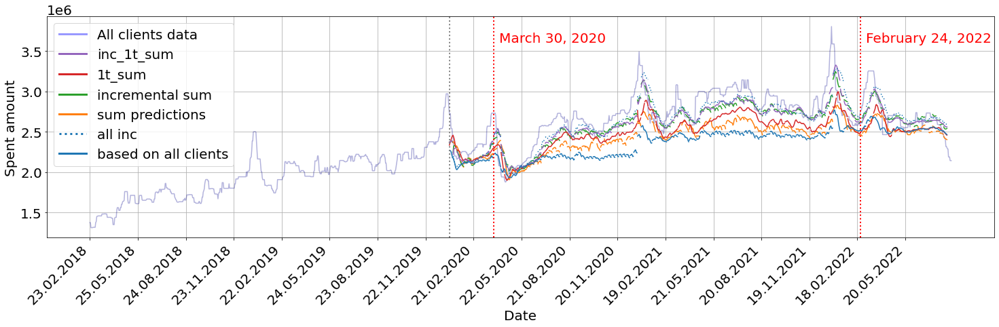

In [281]:
plt.rcParams['figure.figsize'] = 25, 6
ytt = all_rw[shift_days+mem+dim:].values.reshape(-1)
plt.plot(ytt, c='darkblue', alpha=.3, label='All clients data')

for nth_week in trange(0,n_weeks-1):
    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    
    x_coords = np.arange(len(ytt)-next_split-2,len(ytt)-next_split-2+fwd)
    
    plt.plot(x_coords, next_full_fwd_pred_tr[nth_week]+next_full_fwd_pred_tr_bad[nth_week], color=cmap.colors[1],linestyle='-')
    plt.plot(x_coords, inext_full_fwd_pred_tr[nth_week]+inext_full_fwd_pred_tr_bad[nth_week], color=cmap.colors[2],linestyle='-')
    
    plt.plot(x_coords, next_full_fwd_pred_tr_1t[nth_week]+next_full_fwd_pred_tr_bad_1t[nth_week], color=cmap.colors[3],linestyle='-')
    plt.plot(x_coords, inext_full_fwd_pred_tr_1t[nth_week]+inext_full_fwd_pred_tr_bad_1t[nth_week], color=cmap.colors[4],linestyle='-')
    
    plt.plot(x_coords, next_full_fwd_pred_tr_all[nth_week],'-', c=cmap.colors[0])
    plt.plot(x_coords, inext_full_fwd_pred_tr_all[nth_week], c=cmap.colors[0],linestyle=':')
    
ticks=days[shift_days+mem+dim:]
xt=np.arange(0, len(ticks), 13)
plt.xticks(xt[::7], ticks.iloc[xt][::7], rotation=45, ha='right')

lines = [Line2D([0], [0], color='blue', linewidth=3, linestyle='-', alpha=0.4),
         Line2D([0], [0], color=cmap.colors[4], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[3], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[2], linewidth=3, linestyle='-'),
        Line2D([0], [0], color=cmap.colors[1], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[0], linewidth=3, linestyle=':'),
        Line2D([0], [0], color=cmap.colors[0], linewidth=3, linestyle='-')]
labels = ['All clients data','inc_1t_sum', '1t_sum','incremental sum',"sum predictions",'all inc','based on all clients']
plt.legend(lines, labels)

plt.axvline(len(ytt)-split-2,ls=':',c='gray',lw=2)

plt.axvline(766,ls=':',c='red',lw=2)
plt.text(776, ytt.max()*0.95,'March 30, 2020',c='red')

plt.axvline(1462,ls=':',c='red',lw=2)
plt.text(1472, ytt.max()*0.95,'February 24, 2022',c='red',)

plt.grid()
#plt.title('Предсказания клиентов относительно реальных данных всех клиентов')
plt.ylabel('Spent amount')
plt.xlabel('Date');

In [64]:
font_size = 22
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=font_size)          # controls default text sizes
plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
plt.rc('axes', labelsize=font_size)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('legend', fontsize=font_size)    # legend fontsize
plt.rc('figure', titlesize=font_size)  # fontsize of the figure title

  0%|          | 0/135 [00:00<?, ?it/s]

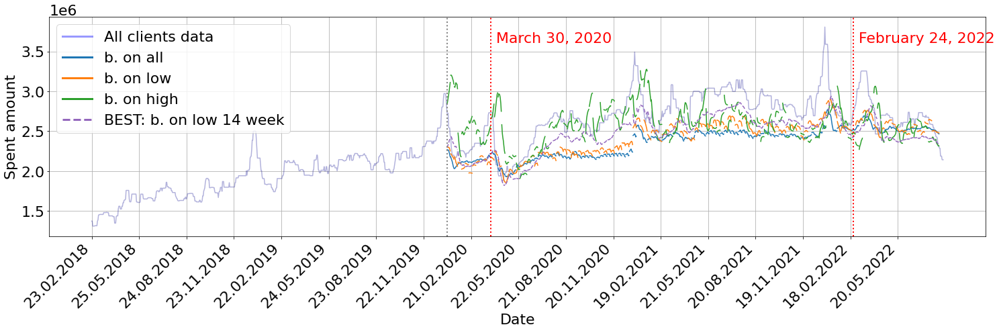

In [65]:
plt.rcParams['figure.figsize'] = 25, 6
ytt = all_rw[shift_days+mem+dim:].values.reshape(-1)
plt.plot(ytt, c='darkblue', alpha=.3, label='All clients data')

good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,14,window_size=21)
coeff_14w = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_bad_rw[shift_days:-split].values.reshape(-1))


for nth_week in trange(0,n_weeks-1):
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)
    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    x_coords = np.arange(len(ytt)-next_split-2,len(ytt)-next_split-2+fwd)
    
    # на основе всех клиентов
    plt.plot(x_coords, next_full_fwd_pred_tr_all[nth_week], 
             color=cmap.colors[0],linestyle='-')
    
    # сумма предсказаний хороших и плохих на 40 неделе
    #plt.plot(x_coords, for_weeks_next_full_fwd_pred_tr_1t[1][nth_week]+for_weeks_next_full_fwd_pred_tr_bad_1t[1][nth_week], 
             #color=cmap.colors[4],linestyle='-')
    
    # Считаем коэфф. для предсказаний плохих клиентов
    #coeff_bad = np.median(next_all_rw[shift_days+mem+dim:-next_split].values.reshape(-1))/np.median(next_bad_rw[shift_days+mem+dim:-next_split].values.reshape(-1))
    coeff_bad = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_bad_rw[shift_days:-split].values.reshape(-1))
    plt.plot(x_coords, next_full_fwd_pred_tr_bad[nth_week]*coeff_bad, 
             color=cmap.colors[1],linestyle='-')
    
    # Считаем коэфф. для предсказаний хороших клиентов
    #coeff_good = np.median(next_all_rw[shift_days+mem+dim:-next_split].values.reshape(-1))/np.median(next_good_rw[shift_days+mem+dim:-next_split].values.reshape(-1))
    coeff_good = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_good_rw[shift_days:-split].values.reshape(-1))
    plt.plot(x_coords, next_full_fwd_pred_tr[nth_week]*coeff_good, 
             color=cmap.colors[2],linestyle='-')
    
    # на основе bad на 14 неделе 
    plt.plot(x_coords, for_weeks_next_full_fwd_pred_tr_bad_1t[0][nth_week]*coeff_14w, 
             color=cmap.colors[4],linestyle='--')
    
   
    
ticks=days[shift_days+mem+dim:]
xt=np.arange(0, len(ticks), 13)
plt.xticks(xt[::7], ticks.iloc[xt][::7], rotation=45, ha='right')

lines = [Line2D([0], [0], color='blue', linewidth=3, linestyle='-', alpha=0.4),
         Line2D([0], [0], color=cmap.colors[0], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[1], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[2], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[4], linewidth=3, linestyle='--'),
        ]
labels = ['All clients data', 'b. on all', 'b. on low', 'b. on high', 'BEST: b. on low 14 week']
plt.legend(lines, labels)

plt.axvline(len(ytt)-split-2,ls=':',c='gray',lw=2)

plt.axvline(766,ls=':',c='red',lw=2)
plt.text(776, ytt.max()*0.95,'March 30, 2020',c='red')

plt.axvline(1462,ls=':',c='red',lw=2)
plt.text(1472, ytt.max()*0.95,'February 24, 2022',c='red',)

plt.grid()
#plt.title('Предсказания клиентов относительно реальных данных всех клиентов')
plt.ylabel('Spent amount')
plt.xlabel('Date');

In [76]:
coeff_bad = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_bad_rw[shift_days:-split].values.reshape(-1))
coeff_good = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_good_rw[shift_days:-split].values.reshape(-1))
    

  0%|          | 0/135 [00:00<?, ?it/s]

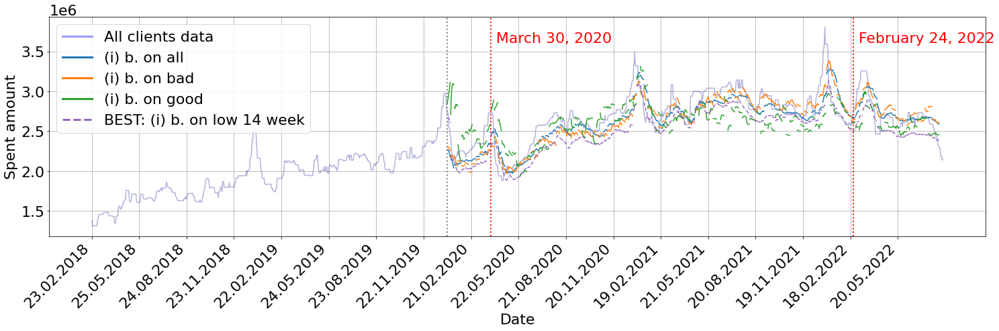

In [77]:
plt.rcParams['figure.figsize'] = 25, 6
ytt = all_rw[shift_days+mem+dim:].values.reshape(-1)
plt.plot(ytt, c='darkblue', alpha=.3, label='All clients data')


for nth_week in trange(0,n_weeks-1):
    good_clients_id, next_good_rw, next_bad_rw, next_all_rw = macro_help_functions.client_groups_nth_week(df_2models,df_real_id,bool_clients,nth_week,window_size=21)
    last_day = days[days==f'{a1_dm[nth_week]}'].index[0]
    next_split= days.shape[0]-last_day-1
    x_coords = np.arange(len(ytt)-next_split-2,len(ytt)-next_split-2+fwd)
    
    # на основе всех клиентов
    plt.plot(x_coords, inext_full_fwd_pred_tr_all[nth_week], 
             color=cmap.colors[0],linestyle='-')
    
    # сумма предсказаний хороших и плохих на 40 неделе
    #plt.plot(x_coords, for_weeks_next_full_fwd_pred_tr_1t[1][nth_week]+for_weeks_next_full_fwd_pred_tr_bad_1t[1][nth_week], 
             #color=cmap.colors[4],linestyle='-')
    
     # Считаем коэфф. для предсказаний плохих клиентов
    coeff_bad = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_bad_rw[shift_days:-split].values.reshape(-1))
    plt.plot(x_coords, inext_full_fwd_pred_tr_bad[nth_week]*coeff_bad, 
             color=cmap.colors[1],linestyle='-')
    
    # Считаем коэфф. для предсказаний хороших клиентов
    coeff_good = np.median(next_all_rw[shift_days:-split].values.reshape(-1))/np.median(next_good_rw[shift_days:-split].values.reshape(-1))
    plt.plot(x_coords, inext_full_fwd_pred_tr[nth_week]*coeff_good, 
             color=cmap.colors[2],linestyle='-')
    
    # на основе bad на 14 неделе 
    plt.plot(x_coords, for_weeks_inext_full_fwd_pred_tr_bad_1t[0][nth_week]*coeff_14w, 
             color=cmap.colors[4],linestyle='--')
    
ticks=days[shift_days+mem+dim:]
xt=np.arange(0, len(ticks), 13)
plt.xticks(xt[::7], ticks.iloc[xt][::7], rotation=45, ha='right')

lines = [Line2D([0], [0], color='blue', linewidth=3, linestyle='-', alpha=0.4),
         Line2D([0], [0], color=cmap.colors[0], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[1], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[2], linewidth=3, linestyle='-'),
         Line2D([0], [0], color=cmap.colors[4], linewidth=3, linestyle='--'),
        ]
labels = ['All clients data', '(i) b. on all', '(i) b. on bad', 
          '(i) b. on good', 'BEST: (i) b. on low 14 week']
plt.legend(lines, labels)

plt.axvline(len(ytt)-split-2,ls=':',c='gray',lw=2)

plt.axvline(766,ls=':',c='red',lw=2)
plt.text(776, ytt.max()*0.95,'March 30, 2020',c='red')

plt.axvline(1462,ls=':',c='red',lw=2)
plt.text(1472, ytt.max()*0.95,'February 24, 2022',c='red',)

plt.grid()
#plt.title('Предсказания клиентов относительно реальных данных всех клиентов')
plt.ylabel('Spent amount')
plt.xlabel('Date');

In [81]:
font_size = 23
cmap = matplotlib.colors.ListedColormap(matplotlib.cm.get_cmap("tab10").colors[:5])

plt.rc('font', size=font_size)          # controls default text sizes
plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
plt.rc('axes', labelsize=font_size)    # fontsize of the x and y labels

plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
plt.rc('legend', fontsize=font_size)    # legend fontsize
plt.rc('figure', titlesize=font_size)  # fontsize of the figure title

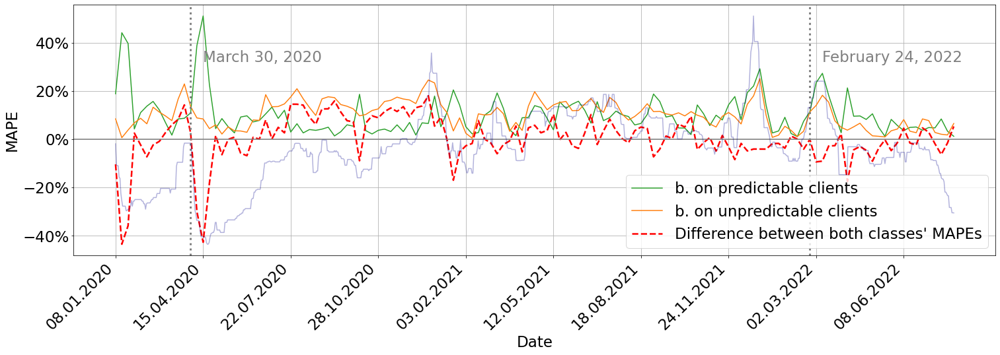

In [86]:
# MAPE для каждого из 77 предсказаний
temp_vs_all = pd.DataFrame({'good':mape_good_pred_vs_all,'igood':imape_good_pred_vs_all,
                            'all': next_fwd_mapes_all, 'iall': inext_fwd_mapes_all,
                            'bad':mape_bad_pred_vs_all,'ibad':imape_bad_pred_vs_all})
plt.rcParams['figure.figsize'] = 25, 7

fig=plt.figure()

ax=fig.add_subplot(111, label="1")
ax2=fig.add_subplot(111, label="2", frame_on=False)
ax2.plot(days[-split:],ytt[-split:], c='darkblue', alpha=.3, label="All clients' data")
ax2.axis('off')

ax.plot(temp_vs_all['good'],'-',c=cmap.colors[2],label="b. on predictable clients")
#ax.plot(temp_vs_all['all'],'-',label='based on all clients', c=cmap.colors[0])
ax.plot(temp_vs_all['bad'],'-',label="b. on unpredictable clients",c=cmap.colors[1])
ax.plot((temp_vs_all['bad']-temp_vs_all['good']),'--',label="Difference between both classes' MAPEs",c='red',lw=2.5)

ax.set_xticks(np.arange(0, len(a0_dm[1:]),14))
ax.set_xticklabels(a0_dm[1::14],rotation=45, ha='right')

ax.yaxis.set_major_formatter(mtick.PercentFormatter(1))
ax.axhline(0.,c='gray',ls='-')

ax.grid()
ax.legend(loc='lower right')

ax.axvline(12,ls=':',c='gray',lw=3)
ax.text(14,0.32,'March 30, 2020',c='gray')
ax.axvline(111,ls=':',c='gray',lw=3)
ax.text(113,0.32,'February 24, 2022',c='gray')

#plt.title('Ошибки предсказаний относительно реальных данных всех клиентов')
ax.set_ylabel('MAPE')
ax.set_xlabel('Date');


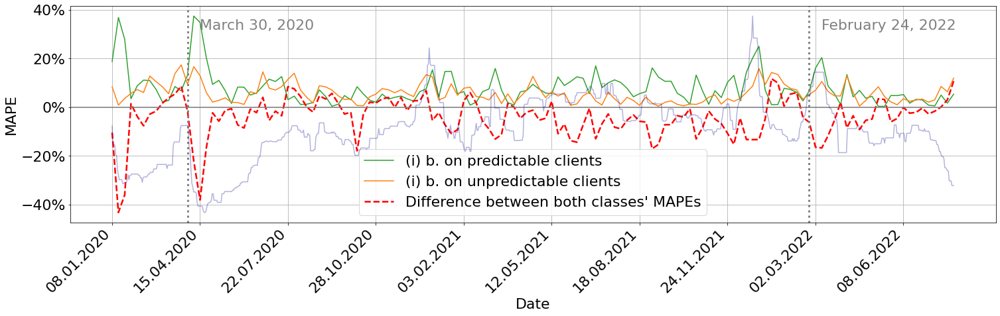

In [78]:
plt.rcParams['figure.figsize'] = 25, 6

fig=plt.figure()

ax=fig.add_subplot(111, label="1")
ax2=fig.add_subplot(111, label="2", frame_on=False)
ax2.plot(days[-split:],ytt[-split:], c='darkblue', alpha=.3, label="All clients' data")
ax2.axis('off')

ax.plot(temp_vs_all['igood'],'-',c=cmap.colors[2],label="(i) b. on predictable clients")
#ax.plot(temp_vs_all['all'],'-',label='based on all clients', c=cmap.colors[0])
ax.plot(temp_vs_all['ibad'],'-',label="(i) b. on unpredictable clients",c=cmap.colors[1])
ax.plot((temp_vs_all['ibad']-temp_vs_all['good']),'--',label="Difference between both classes' MAPEs",c='red',lw=2.5)

ax.set_xticks(np.arange(0, len(a0_dm[1:]),14))
ax.set_xticklabels(a0_dm[1::14],rotation=45, ha='right')

ax.yaxis.set_major_formatter(mtick.PercentFormatter(1))
ax.axhline(0.,c='gray',ls='-')

ax.grid()
ax.legend()

ax.axvline(12,ls=':',c='gray',lw=3)
ax.text(14,0.32,'March 30, 2020',c='gray')
ax.axvline(111,ls=':',c='gray',lw=3)
ax.text(113,0.32,'February 24, 2022',c='gray')

#plt.title('Ошибки предсказаний относительно реальных данных всех клиентов')
ax.set_ylabel('MAPE')
ax.set_xlabel('Date');

### Графики

In [285]:
temp_sum = pd.DataFrame({'regular':next_fwd_mapes_all,'sum':mape_all_sum,
                        'sum_1t14':mape_all_sum_1t14,'sum_1t40':mape_all_sum_1t,'sum_1t52':mape_all_sum_1t52,
                        'inc_regular':inext_fwd_mapes_all,'sum_inc':imape_all_sum,
                        'sum_inc_1t14':imape_all_sum_1t14,'sum_inc_1t40':imape_all_sum_1t,'sum_inc_1t52':imape_all_sum_1t52})

Text(0, 0.5, 'MAPE')

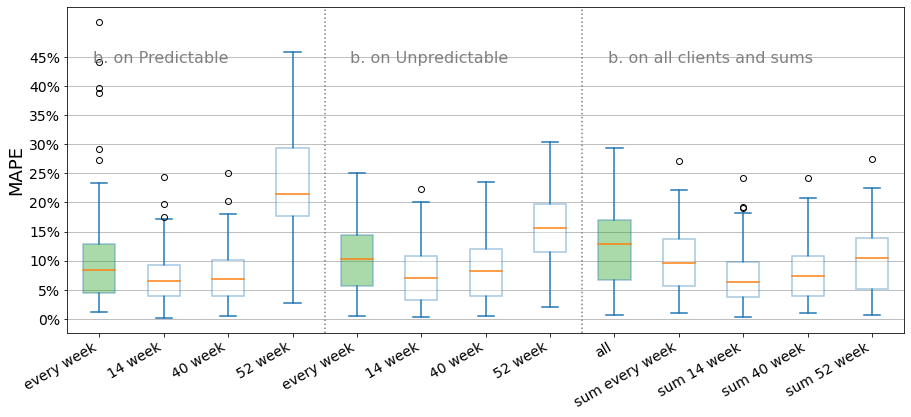

In [287]:
# График
preds_each_week_all = pd.DataFrame({'High1':mape_good_pred_vs_all,'High2':mape_good_pred_vs_all_1t14,'High3':mape_good_pred_vs_all_1t,'High4':mape_good_pred_vs_all_1t52,
                                    'Low1':mape_bad_pred_vs_all,'Low2':mape_bad_pred_vs_all_1t14,'Low3':mape_bad_pred_vs_all_1t,'Low4':mape_bad_pred_vs_all_1t52,
                                   'All':next_fwd_mapes_all,'Sum_everyw':mape_all_sum, 'sum_1t14':mape_all_sum_1t14,'sum_1t40':mape_all_sum_1t,'sum_1t52':mape_all_sum_1t52})

plt.rcParams['figure.figsize'] = 15, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = preds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

height = 0.44
beginning = 0.9
plt.text(beginning, height, 'b. on Predictable', color='gray')
plt.axvline(4.5, c='gray', ls=':')
plt.text(beginning+4, height, 'b. on Unpredictable', color='gray')
plt.axvline(8.5, c='gray', ls=':')
plt.text(beginning+8, height, 'b. on all clients and sums', color='gray')

colors = [cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white','white','white','white',
         'white' 
         ]

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

plt.xticks(range(1,14), ['every week','14 week','40 week','52 week']*2+['all','sum every week','sum 14 week','sum 40 week','sum 52 week'], rotation=30, ha='right')
plt.yticks(np.arange(0, 0.5, 0.05))
plt.grid(axis='y')
#plt.ylim(0,0.48)
plt.ylabel('MAPE')

#plt.title('Предсказания относительно той же группы');

Text(0, 0.5, 'MAPE')

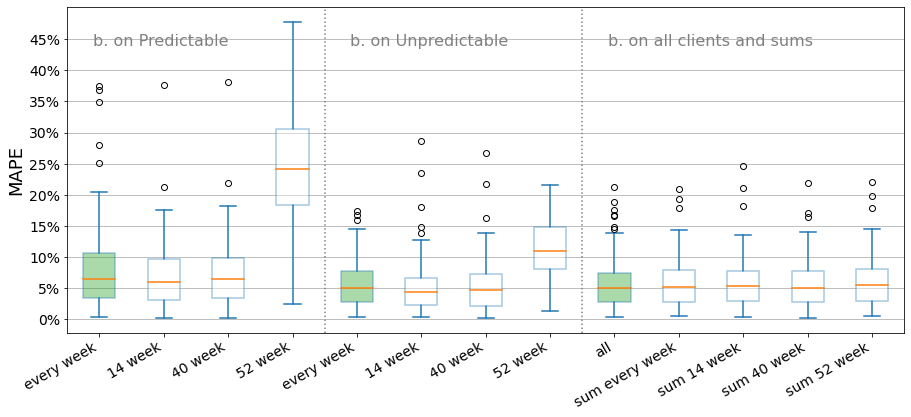

In [288]:
# График
preds_each_week_all = pd.DataFrame({'High1':imape_good_pred_vs_all,'High2':imape_good_pred_vs_all_1t14,'High3':imape_good_pred_vs_all_1t,'High4':imape_good_pred_vs_all_1t52,
                                    'Low1':imape_bad_pred_vs_all,'Low2':imape_bad_pred_vs_all_1t14,'Low3':imape_bad_pred_vs_all_1t,'Low4':imape_bad_pred_vs_all_1t52,
                                   'All':inext_fwd_mapes_all,'Sum_everyw':imape_all_sum, 'sum_1t14':imape_all_sum_1t14,'sum_1t40':imape_all_sum_1t,'sum_1t52':imape_all_sum_1t52})

plt.rcParams['figure.figsize'] = 15, 6
style_for_all4 = dict(linewidth=1.5, color=cmap.colors[0])

bb = preds_each_week_all.plot(kind='box',return_type='both',
                             boxprops=dict(linewidth=1.5, color=cmap.colors[0]),
                             medianprops=dict(linewidth=1.5, color=cmap.colors[1]),
                             whiskerprops=style_for_all4,
                             capprops=style_for_all4,
                           patch_artist = True
                         )
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))

height = 0.44
beginning = 0.9
plt.text(beginning, height, 'b. on Predictable', color='gray')
plt.axvline(4.5, c='gray', ls=':')
plt.text(beginning+4, height, 'b. on Unpredictable', color='gray')
plt.axvline(8.5, c='gray', ls=':')
plt.text(beginning+8, height, 'b. on all clients and sums', color='gray')

colors = [cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white',
         cmap.colors[2],'white','white','white','white','white','white',
         'white' 
         ]

for i,box in enumerate(bb[1]['boxes']):
    box.set_facecolor(colors[i])
    box.set_alpha(.4)

plt.xticks(range(1,14), ['every week','14 week','40 week','52 week']*2+['all','sum every week','sum 14 week','sum 40 week','sum 52 week'], rotation=30, ha='right')
plt.yticks(np.arange(0, 0.5, 0.05))
plt.grid(axis='y')
#plt.ylim(0,0.48)
plt.ylabel('MAPE')

#plt.title('Предсказания относительно той же группы');